### HOUSE SALE PRICING PREDICTION

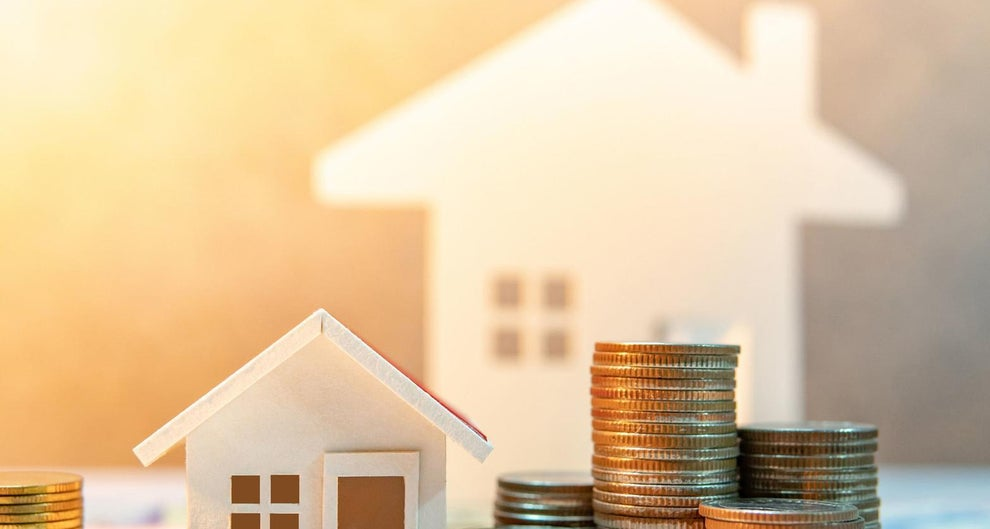

This is a beginners notebook that covers all the main steps necessary to complete a Machine Learning project. Here below you can see a detailed table of contents of the work:

**PREPROCESSING & EDA**

- Importing Libraries & Data
- Dealing with Duplicates and Nan
- Looking at correlations
- Data Normalization (Plots & Tests)


**MODELING**

- Baseline Models with 10-Folds CV
- Best Model (RandomGridSearch)
- Prediction
- Submission

In [1]:
# IMPORTING LIBRARIES

import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
from scipy.stats import norm
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import skew, norm
from sklearn.neighbors import KNeighborsRegressor
%matplotlib inline
from scipy import stats

#MODELING import
import shap
import xgboost as xgb
from catboost import Pool
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeRegressor
from mlxtend.regressor import StackingRegressor
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_log_error

import warnings
warnings.filterwarnings(action="ignore")

In [2]:
# IMPORTING DATA

house_data = pd.read_csv('C:/Users/ersar/OneDrive/Desktop/Kaggle/HousePrice/train.csv')
test = pd.read_csv('C:/Users/ersar/OneDrive/Desktop/Kaggle/HousePrice/test.csv')
data_w = house_data.copy()
data_w.columns = data_w.columns.str.replace(' ', '') # Replacing the white spaces in columns' names if any
data_w.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [3]:
data_w.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


### EDA & VISUALIZATION

Before working with data let's understand them first. A crucial step to this aim is the ***Exploratory data analysis (EDA)***: a combination of visualizations and statistical analysis (uni-variate, bi-variate, and multivariate) these steps' helps us to better understand the data we are working with and to gain insight into their relationships. So, let's explore our target variable and how the other features influence it.

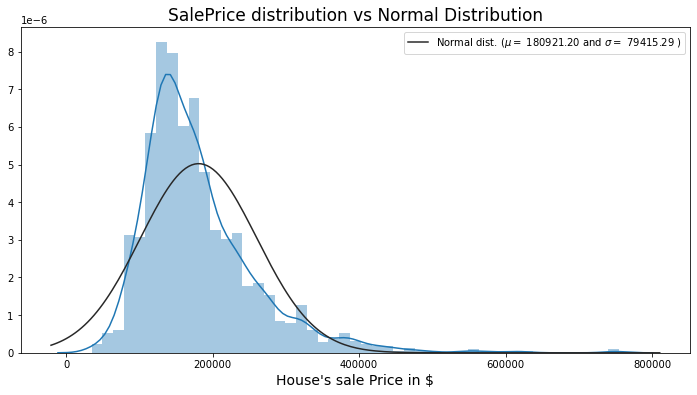

In [4]:
# Getting the main parameters of the Normal Ditribution ()
(mu, sigma) = norm.fit(data_w['SalePrice'])

plt.figure(figsize = (12,6))
sns.distplot(data_w['SalePrice'], kde = True, hist=True, fit = norm)
plt.title('SalePrice distribution vs Normal Distribution', fontsize = 17)
plt.xlabel("House's sale Price in $", fontsize = 14)
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.show()

In literature, acceptable values for skewness are between -0.5 and 0.5 while -2 and 2 for Kurtosis. Looking at the plot, we can clearly see how the distribution does not seem to be normal, but highly right-skewed. The non-normality of our distribution is also supported by the Shapiro test for normality (p-value really small that allows us to reject the hypotesis of normality). Despite that, let's leave it like that for now, we'll deal with that later in the notebook. 

In [5]:
# Skew and kurt


shap_t,shap_p = stats.shapiro(data_w['SalePrice'])

print("Skewness: %f" % abs(data_w['SalePrice']).skew())
print("Kurtosis: %f" % abs(data_w['SalePrice']).kurt())
print("Shapiro_Test: %f" % shap_t)
print("Shapiro_Test: %f" % shap_p)

Skewness: 1.882876
Kurtosis: 6.536282
Shapiro_Test: 0.869672
Shapiro_Test: 0.000000


The correlation matrix is the best way to see all the numerical correlation between features. Let's see which are the feature that correlate most with our target variable.

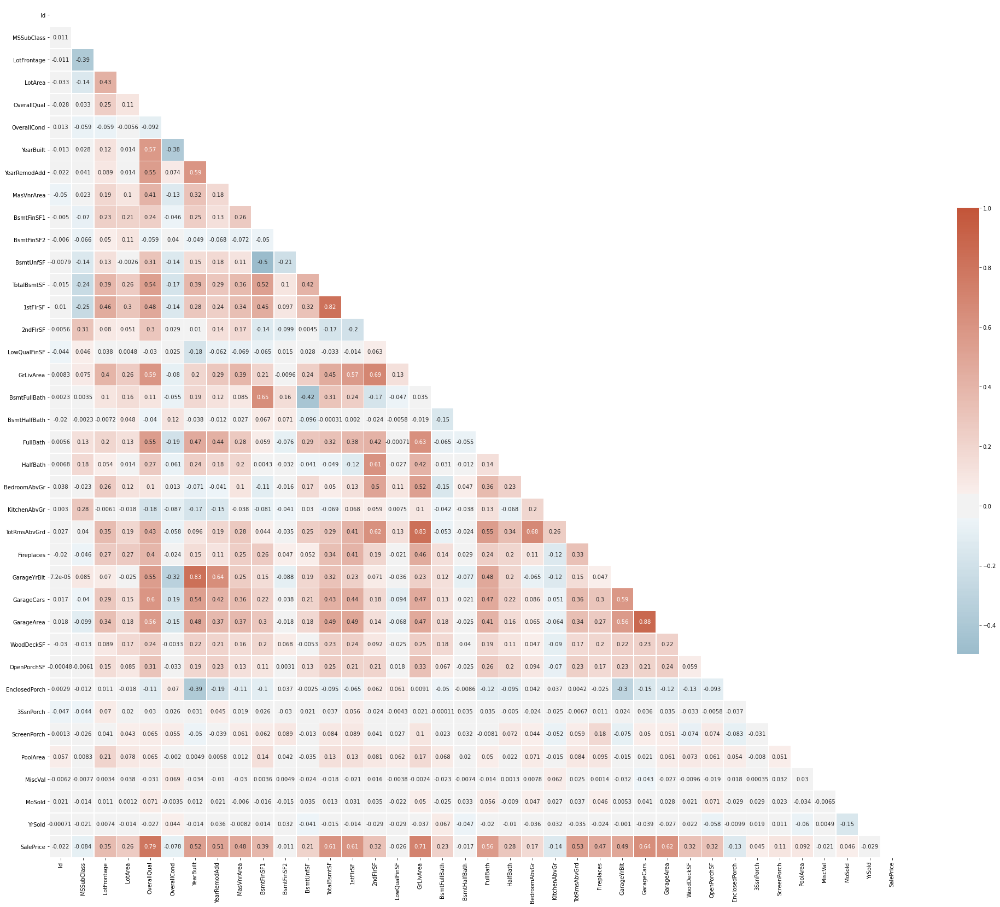

In [6]:
# Correlation Matrix

f, ax = plt.subplots(figsize=(35, 30))
mat = data_w.corr('pearson')
mask = np.triu(np.ones_like(mat, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(mat, mask=mask, cmap=cmap, vmax=1, center=0, annot = True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

Now that we know which features correlates most with our target variable we can investigate them more in depth.

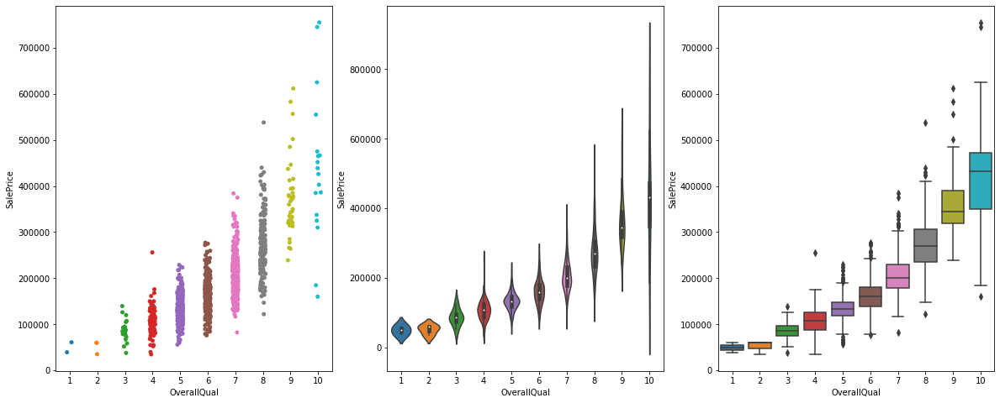

In [7]:
# OverallQuall - SalePrice [Pearson = 0.79]

figure, ax = plt.subplots(1,3, figsize = (20,8))
sns.stripplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[0])
sns.violinplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[1])
sns.boxplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[2])
plt.show()

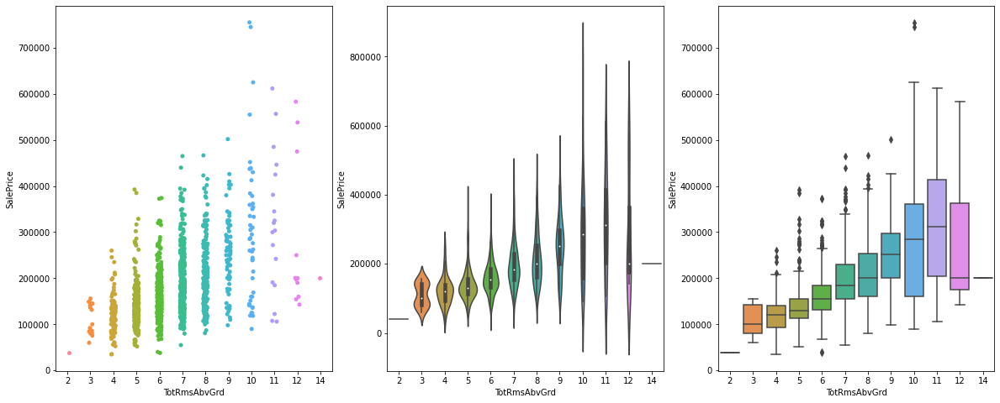

In [8]:
# TotRmsAbvGrd - SalePrice [Pearson = 0.50]

figure, ax = plt.subplots(1,3, figsize = (20,8))
sns.stripplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[0])
sns.violinplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[1])
sns.boxplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[2])
plt.show()

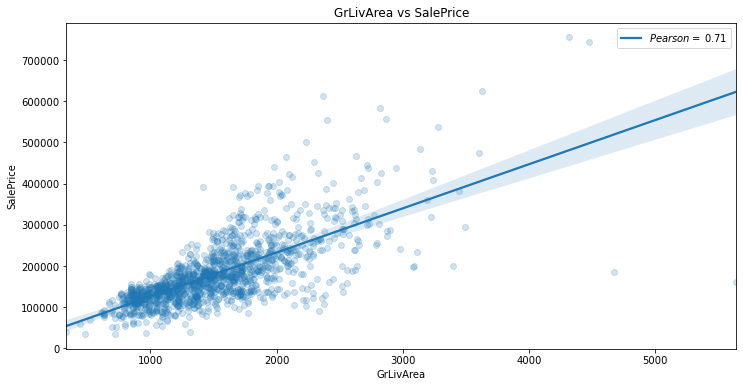

In [9]:
# GrLivArea vs SalePrice [corr = 0.71]

Pearson_GrLiv = 0.71
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'GrLivArea', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('GrLivArea vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_GrLiv)], loc = 'best')
plt.show()

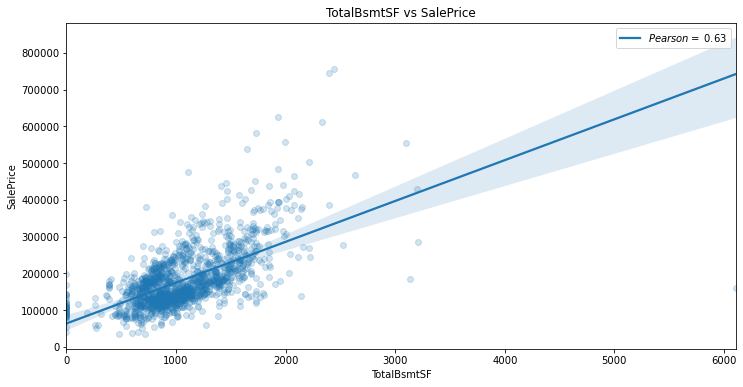

In [10]:
Pearson_TBSF = 0.63
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'TotalBsmtSF', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('TotalBsmtSF vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_TBSF)], loc = 'best')
plt.show()

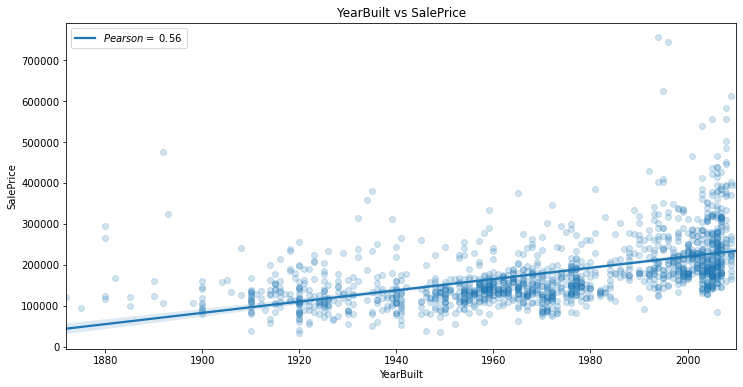

In [11]:
# YearBuilt vs SalePrice

Pearson_YrBlt = 0.56
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'YearBuilt', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('YearBuilt vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_YrBlt)], loc = 'best')
plt.show()

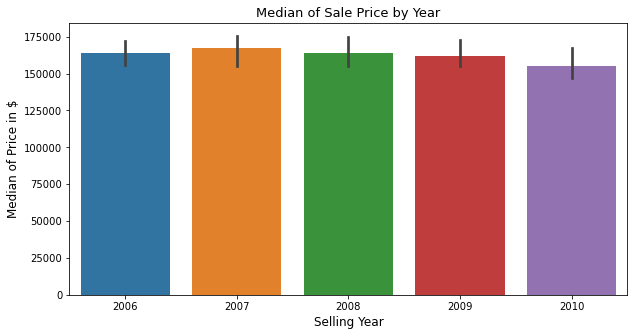

In [12]:
# Median of Sale Price by Year

plt.figure(figsize = (10,5))
sns.barplot(x='YrSold', y="SalePrice", data = data_w, estimator = np.median)
plt.title('Median of Sale Price by Year', fontsize = 13)
plt.xlabel('Selling Year', fontsize = 12)
plt.ylabel('Median of Price in $', fontsize = 12)
plt.show()

###  DATA PREPROCESSING

Now that we have some insights about data, we need to preprocess them for the modeling part. The main steps are:

- Looking at potential NaN
- Dealing with categorical features (e.g. Dummy coding)
- Normalization

N.B:

Usually, in a real-world project, the test data are not available until the end. For this reason, test data should contain the same type of data of the training set to preprocess them in the same way. Here, the test set is available. It contains some observations not present in the training dataset and,the use of dummy coding could raise several issues (I spent a lot of time figuring out why I was not able to make predictions on the test set). The easiest way to solve this problem (that is not applicable if test data are not available) is to concatenate Train and Test sets, preprocess, and divide them again.


### DEALING WITH OUTLIERS

In [13]:
# Checking outliers at 1%,5%,25%,50%,75%,90%,95%,99% and above
data_w.describe(percentiles=[.01,.05,.25,.5,.75,.90,.95,.98])

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
1%,15.590000,20.000000,21.000000,1680.000000,3.000000,3.000000,1899.180000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,61815.970000
5%,73.950000,20.000000,34.000000,3311.700000,4.000000,4.000000,1916.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2006.000000,88000.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
90%,1314.100000,120.000000,96.000000,14381.700000,8.000000,7.000000,2006.000000,2006.000000,335.000000,1065.500000,...,262.000000,130.000000,112.000000,0.000000,0.000000,0.000000,0.000000,10.000000,2010.000000,278000.000000


Let's see In LotArea 

[Text(0.5, 0, '')]

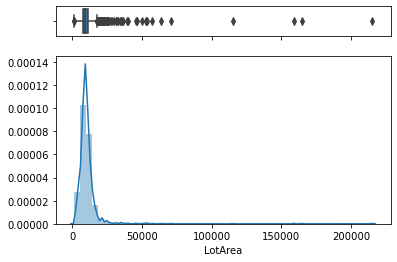

In [14]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
# Add a graph in each part
sns.boxplot(data_w["LotArea"], ax=ax_box)
sns.distplot(data_w["LotArea"], ax=ax_hist)
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

on both end we can clearly see outliers

[Text(0.5, 0, '')]

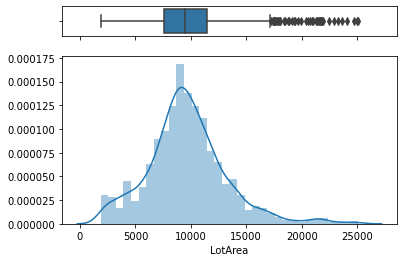

In [15]:
# Removing Outliers, we can clearly see that there is outliers at the end  , so let's remove outliers

outliers_range_upper = data_w['LotArea'].quantile(0.98)
# Removing values beyond 98% for LotFrontage
data_w = data_w[data_w["LotArea"] < outliers_range_upper]
outliers_range_lower = data_w['LotArea'].quantile(0.01)
# Removing values under 1% for LotFrontage
data_w = data_w[data_w["LotArea"] > outliers_range_lower]

#Again Plot the chart
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
# Add a graph in each part
sns.boxplot(data_w["LotArea"], ax=ax_box)
sns.distplot(data_w["LotArea"], ax=ax_hist)
# Remove x axis name for the boxplot
ax_box.set(xlabel='')


In [16]:
# Checking outliers at 1%,5%,25%,50%,75%,90%,95%,99% and above
data_w.describe(percentiles=[.01,.05,.25,.5,.75,.90,.95,.98])

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1413.000000,1413.000000,1167.000000,1413.000000,1413.000000,1413.000000,1413.000000,1413.000000,1406.000000,1413.000000,...,1413.000000,1413.000000,1413.000000,1413.000000,1413.000000,1413.000000,1413.000000,1413.000000,1413.000000,1413.000000
mean,730.530078,55.665251,70.066838,9657.678698,6.101911,5.576787,1971.352442,1984.959660,100.257468,432.626327,...,91.551309,46.498231,22.037509,3.523001,14.944091,2.148620,44.086341,6.342534,2007.814579,180350.581741
std,421.904676,40.636967,21.062897,3596.845120,1.375454,1.109743,30.488777,20.744887,175.329170,429.995577,...,120.918286,65.381270,60.145533,29.794557,55.548811,36.364409,503.803101,2.698260,1.326730,77744.950503
min,1.000000,20.000000,21.000000,1869.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
1%,15.120000,20.000000,24.000000,2223.120000,3.000000,3.000000,1898.240000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,61165.960000
5%,72.600000,20.000000,36.000000,3864.800000,4.000000,4.000000,1916.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2006.000000,89282.600000
25%,366.000000,20.000000,60.000000,7588.000000,5.000000,5.000000,1953.000000,1966.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130000.000000
50%,732.000000,50.000000,70.000000,9439.000000,6.000000,5.000000,1974.000000,1994.000000,0.000000,378.000000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1096.000000,70.000000,80.000000,11425.000000,7.000000,6.000000,2001.000000,2004.000000,160.750000,704.000000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,213000.000000
90%,1314.800000,120.000000,95.000000,13891.000000,8.000000,7.000000,2006.000000,2006.000000,320.000000,1044.800000,...,254.600000,130.000000,112.000000,0.000000,0.000000,0.000000,0.000000,10.000000,2010.000000,275900.000000


Value looks nice now

In [19]:
data_w.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1413 non-null   int64  
 1   MSSubClass     1413 non-null   int64  
 2   MSZoning       1413 non-null   object 
 3   LotFrontage    1167 non-null   float64
 4   LotArea        1413 non-null   int64  
 5   Street         1413 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1413 non-null   object 
 8   LandContour    1413 non-null   object 
 9   Utilities      1413 non-null   object 
 10  LotConfig      1413 non-null   object 
 11  LandSlope      1413 non-null   object 
 12  Neighborhood   1413 non-null   object 
 13  Condition1     1413 non-null   object 
 14  Condition2     1413 non-null   object 
 15  BldgType       1413 non-null   object 
 16  HouseStyle     1413 non-null   object 
 17  OverallQual    1413 non-null   int64  
 18  OverallC

In [20]:
# Separating Target and Features

target = data_w['SalePrice']
test_id = test['Id']
test = test.drop(['Id'],axis = 1)
data_w2 = data_w.drop(['SalePrice'], axis = 1)


# Concatenating train & test set

train_test = pd.concat([data_w2,test], axis=0, sort=False)

In [21]:
# Looking at NaN % within the data

nan = pd.DataFrame(train_test.isna().sum(), columns = ['NaN_sum'])
nan['feat'] = nan.index
nan['Perc(%)'] = (nan['NaN_sum']/1460)*100
nan = nan[nan['NaN_sum'] > 0]
nan = nan.sort_values(by = ['NaN_sum'])
nan['Usability'] = np.where(nan['Perc(%)'] > 20, 'Discard', 'Keep')
nan

,NaN_sum,feat,Perc(%),Usability
TotalBsmtSF,1,TotalBsmtSF,0.068493,Keep
GarageArea,1,GarageArea,0.068493,Keep
GarageCars,1,GarageCars,0.068493,Keep
KitchenQual,1,KitchenQual,0.068493,Keep
Electrical,1,Electrical,0.068493,Keep
BsmtUnfSF,1,BsmtUnfSF,0.068493,Keep
BsmtFinSF2,1,BsmtFinSF2,0.068493,Keep
BsmtFinSF1,1,BsmtFinSF1,0.068493,Keep
SaleType,1,SaleType,0.068493,Keep
Exterior2nd,1,Exterior2nd,0.068493,Keep


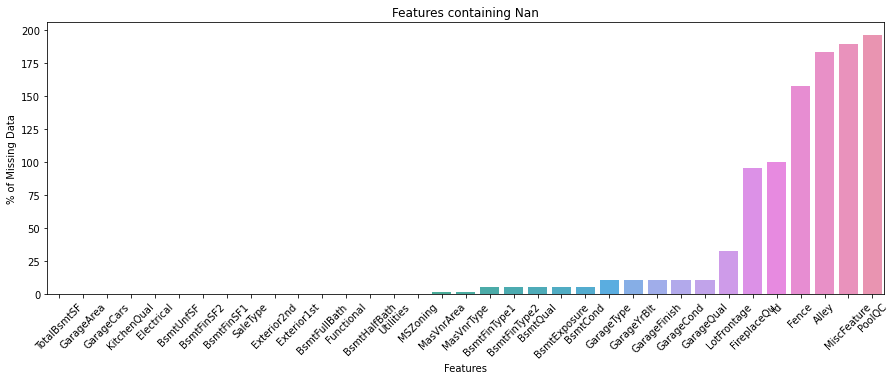

In [22]:
# Plotting Nan

plt.figure(figsize = (15,5))
sns.barplot(x = nan['feat'], y = nan['Perc(%)'])
plt.xticks(rotation=45)
plt.title('Features containing Nan')
plt.xlabel('Features')
plt.ylabel('% of Missing Data')
plt.show()

Are we sure that all these nans are real missing values? Looking at the given description file, we can see how the majority of these nans reflect the absence of something, and for this reason, they are not nans. We can impute them (for numerical features) or substitute them with data in the file:

In [23]:
# Converting non-numeric predictors stored as numbers into string

train_test['MSSubClass'] = train_test['MSSubClass'].apply(str)
train_test['YrSold'] = train_test['YrSold'].apply(str)
train_test['MoSold'] = train_test['MoSold'].apply(str)

# Filling Categorical NaN (That we know how to fill due to the description file )

train_test['Functional'] = train_test['Functional'].fillna('Typ')
train_test['Electrical'] = train_test['Electrical'].fillna("SBrkr")
train_test['KitchenQual'] = train_test['KitchenQual'].fillna("TA")
train_test['Exterior1st'] = train_test['Exterior1st'].fillna(train_test['Exterior1st'].mode()[0])
train_test['Exterior2nd'] = train_test['Exterior2nd'].fillna(train_test['Exterior2nd'].mode()[0])
train_test['SaleType'] = train_test['SaleType'].fillna(train_test['SaleType'].mode()[0])
train_test["PoolQC"] = train_test["PoolQC"].fillna("None")
train_test["Alley"] = train_test["Alley"].fillna("None")
train_test['FireplaceQu'] = train_test['FireplaceQu'].fillna("None")
train_test['Fence'] = train_test['Fence'].fillna("None")
train_test['MiscFeature'] = train_test['MiscFeature'].fillna("None")

for col in ('GarageArea', 'GarageCars'):
    train_test[col] = train_test[col].fillna(0)
        
for col in ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']:
    train_test[col] = train_test[col].fillna('None')
    
for col in ('BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2'):
    train_test[col] = train_test[col].fillna('None')
    
    # Checking the features with NaN remained out

for col in train_test:
    if train_test[col].isna().sum() > 0:
        print(train_test[col][0])

0    1.0
0    NaN
Name: Id, dtype: float64
0    RL
0    RH
Name: MSZoning, dtype: object
0    65.0
0    80.0
Name: LotFrontage, dtype: float64
0    AllPub
0    AllPub
Name: Utilities, dtype: object
0    BrkFace
0       None
Name: MasVnrType, dtype: object
0    196.0
0      0.0
Name: MasVnrArea, dtype: float64
0    706.0
0    468.0
Name: BsmtFinSF1, dtype: float64
0      0.0
0    144.0
Name: BsmtFinSF2, dtype: float64
0    150.0
0    270.0
Name: BsmtUnfSF, dtype: float64
0    856.0
0    882.0
Name: TotalBsmtSF, dtype: float64
0    1.0
0    0.0
Name: BsmtFullBath, dtype: float64
0    0.0
0    0.0
Name: BsmtHalfBath, dtype: float64
0    2003.0
0    1961.0
Name: GarageYrBlt, dtype: float64


Imputation for completing missing values using k-Nearest Neighbors.

Each sample’s missing values are imputed using the mean value from n_neighbors nearest neighbors found in the training set. Two samples are close if the features that neither is missing are close.

In [24]:
# Removing the useless variables

useless = ['GarageYrBlt','YearRemodAdd'] 
train_test = train_test.drop(useless, axis = 1)

# Imputing with KnnRegressor (we can also use different Imputers)

def impute_knn(df):
    ttn = train_test.select_dtypes(include=[np.number])
    ttc = train_test.select_dtypes(exclude=[np.number])

    cols_nan = ttn.columns[ttn.isna().any()].tolist()         # columns w/ nan 
    cols_no_nan = ttn.columns.difference(cols_nan).values     # columns w/n nan

    for col in cols_nan:
        imp_test = ttn[ttn[col].isna()]   # indicies which have missing data will become our test set
        imp_train = ttn.dropna()          # all indicies which which have no missing data 
        model = KNeighborsRegressor(n_neighbors=5)  # KNR Unsupervised Approach
        knr = model.fit(imp_train[cols_no_nan], imp_train[col])
        ttn.loc[ttn[col].isna(), col] = knr.predict(imp_test[cols_no_nan])
    
    return pd.concat([ttn,ttc],axis=1)

train_test = impute_knn(train_test)


objects = []
for i in train_test.columns:
    if train_test[i].dtype == object:
        objects.append(i)
train_test.update(train_test[objects].fillna('None'))

# # Checking NaN presence

for col in train_test:
    if train_test[col].isna().sum() > 0:
        print(train_test[col][0])

### FEATURE ENGINEERING

Let's create some new features combining the ones that we already have. These could help us to increase the performance of the model!

In [25]:
train_test["SqFtPerRoom"] = train_test["GrLivArea"] / (train_test["TotRmsAbvGrd"] +
                                                       train_test["FullBath"] +
                                                       train_test["HalfBath"] +
                                                       train_test["KitchenAbvGr"])

train_test['Total_Home_Quality'] = train_test['OverallQual'] + train_test['OverallCond']

train_test['Total_Bathrooms'] = (train_test['FullBath'] + (0.5 * train_test['HalfBath']) +
                               train_test['BsmtFullBath'] + (0.5 * train_test['BsmtHalfBath']))

train_test["HighQualSF"] = train_test["1stFlrSF"] + train_test["2ndFlrSF"]

# Converting non-numeric predictors stored as numbers into string

train_test['MSSubClass'] = train_test['MSSubClass'].apply(str)
train_test['YrSold'] = train_test['YrSold'].apply(str)
train_test['MoSold'] = train_test['MoSold'].apply(str)

# Creating dummy variables from categorical features

train_test_dummy = pd.get_dummies(train_test)

# Fetch all numeric features


numeric_features = train_test_dummy.dtypes[train_test_dummy.dtypes != object].index
skewed_features = train_test_dummy[numeric_features].apply(lambda x: skew(x)).sort_values(ascending=False)
high_skew = skewed_features[skewed_features > 0.5]
skew_index = high_skew.index

# Normalize skewed features using log_transformation
    
for i in skew_index:
    train_test_dummy[i] = np.log1p(train_test_dummy[i])

Now let's try to tranform our target distribution into a normal one. To do this we use a log transformation. We will use qq-plot to see the transformation effect.  

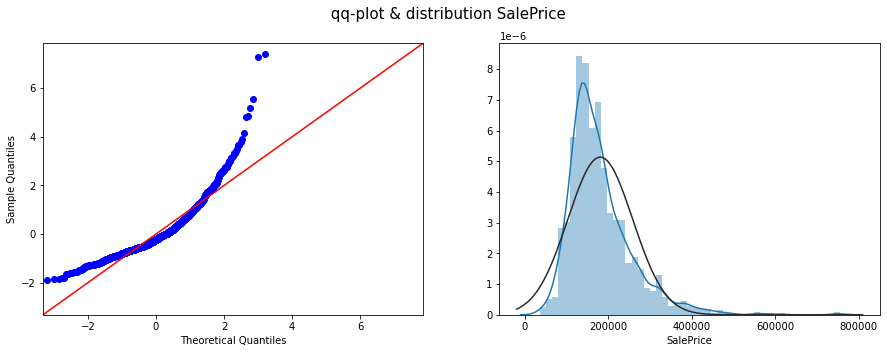

In [26]:
# SalePrice before transformation

fig, ax = plt.subplots(1,2, figsize= (15,5))
fig.suptitle(" qq-plot & distribution SalePrice ", fontsize= 15)

sm.qqplot(target, stats.t, distargs=(4,),fit=True, line="45", ax = ax[0])

sns.distplot(target, kde = True, hist=True, fit = norm, ax = ax[1])
plt.show()

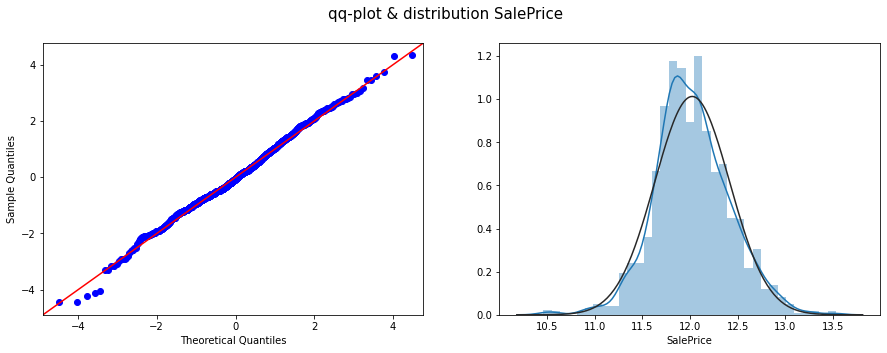

In [27]:
# SalePrice after transformation

target_log = np.log1p(target)

fig, ax = plt.subplots(1,2, figsize= (15,5))
fig.suptitle("qq-plot & distribution SalePrice ", fontsize= 15)

sm.qqplot(target_log, stats.t, distargs=(4,),fit=True, line="45", ax = ax[0])
sns.distplot(target_log, kde = True, hist=True, fit = norm, ax = ax[1])
plt.show()

### MODELING

In [28]:
# Train-Test separation

train = train_test_dummy[0:1413] #after outlier we have only 1413 record in train data
test = train_test_dummy[1413:]
test['Id'] = test_id

# Creation of the RMSE metric:
    
def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model):
    rmse = np.sqrt(-cross_val_score(model, train, target_log, scoring="neg_mean_squared_error", cv=kf))
    return (rmse)

In [29]:
# 10 Fold Cross validation

kf = KFold(n_splits=10, random_state=42, shuffle=True)

cv_scores = []
cv_std = []

baseline_models = ['Linear_Reg.','Bayesian_Ridge_Reg.','LGBM_Reg.','SVR',
                   'Dec_Tree_Reg.','Random_Forest_Reg.', 'XGB_Reg.',
                   'Grad_Boost_Reg.','Cat_Boost_Reg.','Stacked_Reg.']

# Linear Regression

lreg = LinearRegression()
score_lreg = cv_rmse(lreg)
cv_scores.append(score_lreg.mean())
cv_std.append(score_lreg.std())

# Bayesian Ridge Regression

brr = BayesianRidge(compute_score=True)
score_brr = cv_rmse(brr)
cv_scores.append(score_brr.mean())
cv_std.append(score_brr.std())

# Light Gradient Boost Regressor

l_gbm = LGBMRegressor(objective='regression')
score_l_gbm = cv_rmse(l_gbm)
cv_scores.append(score_l_gbm.mean())
cv_std.append(score_l_gbm.std())

# Support Vector Regression

svr = SVR()
score_svr = cv_rmse(svr)
cv_scores.append(score_svr.mean())
cv_std.append(score_svr.std())

# Decision Tree Regressor

dtr = DecisionTreeRegressor()
score_dtr = cv_rmse(dtr)
cv_scores.append(score_dtr.mean())
cv_std.append(score_dtr.std())

# Random Forest Regressor

rfr = RandomForestRegressor()
score_rfr = cv_rmse(rfr)
cv_scores.append(score_rfr.mean())
cv_std.append(score_rfr.std())

# XGB Regressor

xgb = xgb.XGBRegressor()
score_xgb = cv_rmse(xgb)
cv_scores.append(score_xgb.mean())
cv_std.append(score_xgb.std())

# Gradient Boost Regressor

gbr = GradientBoostingRegressor()
score_gbr = cv_rmse(gbr)
cv_scores.append(score_gbr.mean())
cv_std.append(score_gbr.std())

# Cat Boost Regressor

catb = CatBoostRegressor()
score_catb = cv_rmse(catb)
cv_scores.append(score_catb.mean())
cv_std.append(score_catb.std())

# Stacked Regressor

stack_gen = StackingRegressor(regressors=(CatBoostRegressor(),
                                          LinearRegression(),
                                          BayesianRidge(),
                                          GradientBoostingRegressor()),
                              meta_regressor = CatBoostRegressor(),
                              use_features_in_secondary = True)

score_stack_gen = cv_rmse(stack_gen)
cv_scores.append(score_stack_gen.mean())
cv_std.append(score_stack_gen.std())

final_cv_score = pd.DataFrame(baseline_models, columns = ['Regressors'])
final_cv_score['RMSE_mean'] = cv_scores
final_cv_score['RMSE_std'] = cv_std

Learning rate set to 0.040732
0:	learn: 0.3858972	total: 75.9ms	remaining: 1m 15s
1:	learn: 0.3755355	total: 95.6ms	remaining: 47.7s
2:	learn: 0.3656392	total: 105ms	remaining: 34.9s
3:	learn: 0.3559911	total: 115ms	remaining: 28.5s
4:	learn: 0.3474883	total: 124ms	remaining: 24.8s
5:	learn: 0.3385732	total: 137ms	remaining: 22.7s
6:	learn: 0.3311932	total: 145ms	remaining: 20.6s
7:	learn: 0.3230518	total: 156ms	remaining: 19.3s
8:	learn: 0.3156076	total: 165ms	remaining: 18.2s
9:	learn: 0.3083278	total: 174ms	remaining: 17.2s
10:	learn: 0.3010150	total: 186ms	remaining: 16.8s
11:	learn: 0.2939530	total: 198ms	remaining: 16.3s
12:	learn: 0.2875924	total: 211ms	remaining: 16.1s
13:	learn: 0.2813446	total: 221ms	remaining: 15.6s
14:	learn: 0.2751583	total: 231ms	remaining: 15.2s
15:	learn: 0.2698422	total: 242ms	remaining: 14.9s
16:	learn: 0.2642462	total: 252ms	remaining: 14.6s
17:	learn: 0.2586049	total: 265ms	remaining: 14.5s
18:	learn: 0.2532483	total: 280ms	remaining: 14.5s
19:	lear

161:	learn: 0.0996391	total: 1.78s	remaining: 9.2s
162:	learn: 0.0994723	total: 1.79s	remaining: 9.19s
163:	learn: 0.0993371	total: 1.8s	remaining: 9.18s
164:	learn: 0.0991636	total: 1.81s	remaining: 9.16s
165:	learn: 0.0990084	total: 1.82s	remaining: 9.14s
166:	learn: 0.0989225	total: 1.83s	remaining: 9.12s
167:	learn: 0.0987381	total: 1.84s	remaining: 9.11s
168:	learn: 0.0986175	total: 1.85s	remaining: 9.09s
169:	learn: 0.0984772	total: 1.86s	remaining: 9.08s
170:	learn: 0.0982258	total: 1.87s	remaining: 9.06s
171:	learn: 0.0980873	total: 1.88s	remaining: 9.04s
172:	learn: 0.0978153	total: 1.89s	remaining: 9.03s
173:	learn: 0.0977087	total: 1.9s	remaining: 9.01s
174:	learn: 0.0975289	total: 1.91s	remaining: 9.01s
175:	learn: 0.0974232	total: 1.92s	remaining: 8.99s
176:	learn: 0.0972722	total: 1.93s	remaining: 8.98s
177:	learn: 0.0971549	total: 1.94s	remaining: 8.97s
178:	learn: 0.0970254	total: 1.96s	remaining: 8.97s
179:	learn: 0.0968934	total: 1.97s	remaining: 8.96s
180:	learn: 0.0

335:	learn: 0.0754445	total: 3.54s	remaining: 7s
336:	learn: 0.0753621	total: 3.55s	remaining: 6.99s
337:	learn: 0.0752388	total: 3.56s	remaining: 6.98s
338:	learn: 0.0751228	total: 3.58s	remaining: 6.97s
339:	learn: 0.0750281	total: 3.59s	remaining: 6.96s
340:	learn: 0.0749202	total: 3.6s	remaining: 6.95s
341:	learn: 0.0748171	total: 3.61s	remaining: 6.94s
342:	learn: 0.0747050	total: 3.62s	remaining: 6.93s
343:	learn: 0.0746010	total: 3.63s	remaining: 6.91s
344:	learn: 0.0744864	total: 3.63s	remaining: 6.9s
345:	learn: 0.0743504	total: 3.64s	remaining: 6.89s
346:	learn: 0.0742564	total: 3.65s	remaining: 6.87s
347:	learn: 0.0741962	total: 3.66s	remaining: 6.86s
348:	learn: 0.0741423	total: 3.67s	remaining: 6.84s
349:	learn: 0.0740494	total: 3.68s	remaining: 6.83s
350:	learn: 0.0739306	total: 3.69s	remaining: 6.82s
351:	learn: 0.0738314	total: 3.7s	remaining: 6.8s
352:	learn: 0.0737902	total: 3.71s	remaining: 6.79s
353:	learn: 0.0736765	total: 3.72s	remaining: 6.78s
354:	learn: 0.07363

494:	learn: 0.0620878	total: 5.14s	remaining: 5.24s
495:	learn: 0.0619940	total: 5.15s	remaining: 5.23s
496:	learn: 0.0619841	total: 5.16s	remaining: 5.22s
497:	learn: 0.0619256	total: 5.17s	remaining: 5.21s
498:	learn: 0.0618765	total: 5.18s	remaining: 5.2s
499:	learn: 0.0617843	total: 5.19s	remaining: 5.19s
500:	learn: 0.0617299	total: 5.2s	remaining: 5.18s
501:	learn: 0.0616579	total: 5.22s	remaining: 5.18s
502:	learn: 0.0616045	total: 5.23s	remaining: 5.17s
503:	learn: 0.0615433	total: 5.24s	remaining: 5.16s
504:	learn: 0.0615348	total: 5.25s	remaining: 5.15s
505:	learn: 0.0613932	total: 5.26s	remaining: 5.14s
506:	learn: 0.0613535	total: 5.28s	remaining: 5.13s
507:	learn: 0.0613443	total: 5.28s	remaining: 5.12s
508:	learn: 0.0613373	total: 5.29s	remaining: 5.11s
509:	learn: 0.0613111	total: 5.3s	remaining: 5.09s
510:	learn: 0.0613036	total: 5.31s	remaining: 5.08s
511:	learn: 0.0612209	total: 5.32s	remaining: 5.07s
512:	learn: 0.0611139	total: 5.33s	remaining: 5.06s
513:	learn: 0.0

668:	learn: 0.0510168	total: 6.84s	remaining: 3.38s
669:	learn: 0.0509411	total: 6.85s	remaining: 3.37s
670:	learn: 0.0508795	total: 6.86s	remaining: 3.36s
671:	learn: 0.0508382	total: 6.87s	remaining: 3.35s
672:	learn: 0.0507722	total: 6.88s	remaining: 3.34s
673:	learn: 0.0506886	total: 6.89s	remaining: 3.33s
674:	learn: 0.0506352	total: 6.9s	remaining: 3.32s
675:	learn: 0.0505292	total: 6.91s	remaining: 3.31s
676:	learn: 0.0504513	total: 6.92s	remaining: 3.3s
677:	learn: 0.0503874	total: 6.92s	remaining: 3.29s
678:	learn: 0.0503322	total: 6.93s	remaining: 3.28s
679:	learn: 0.0502390	total: 6.94s	remaining: 3.27s
680:	learn: 0.0501764	total: 6.95s	remaining: 3.26s
681:	learn: 0.0501700	total: 6.96s	remaining: 3.25s
682:	learn: 0.0501247	total: 6.97s	remaining: 3.23s
683:	learn: 0.0500700	total: 6.98s	remaining: 3.22s
684:	learn: 0.0500507	total: 6.99s	remaining: 3.21s
685:	learn: 0.0500292	total: 7s	remaining: 3.2s
686:	learn: 0.0499654	total: 7.01s	remaining: 3.19s
687:	learn: 0.0498

835:	learn: 0.0423956	total: 8.43s	remaining: 1.65s
836:	learn: 0.0423518	total: 8.44s	remaining: 1.64s
837:	learn: 0.0423246	total: 8.45s	remaining: 1.63s
838:	learn: 0.0422704	total: 8.46s	remaining: 1.62s
839:	learn: 0.0422403	total: 8.47s	remaining: 1.61s
840:	learn: 0.0421984	total: 8.48s	remaining: 1.6s
841:	learn: 0.0421410	total: 8.49s	remaining: 1.59s
842:	learn: 0.0421000	total: 8.5s	remaining: 1.58s
843:	learn: 0.0420472	total: 8.51s	remaining: 1.57s
844:	learn: 0.0420157	total: 8.51s	remaining: 1.56s
845:	learn: 0.0419942	total: 8.52s	remaining: 1.55s
846:	learn: 0.0419346	total: 8.54s	remaining: 1.54s
847:	learn: 0.0418839	total: 8.55s	remaining: 1.53s
848:	learn: 0.0418515	total: 8.55s	remaining: 1.52s
849:	learn: 0.0417986	total: 8.56s	remaining: 1.51s
850:	learn: 0.0417852	total: 8.57s	remaining: 1.5s
851:	learn: 0.0417526	total: 8.58s	remaining: 1.49s
852:	learn: 0.0417037	total: 8.59s	remaining: 1.48s
853:	learn: 0.0416847	total: 8.6s	remaining: 1.47s
854:	learn: 0.04

Learning rate set to 0.040732
0:	learn: 0.3805553	total: 24.4ms	remaining: 24.4s
1:	learn: 0.3707974	total: 33.8ms	remaining: 16.8s
2:	learn: 0.3614459	total: 43ms	remaining: 14.3s
3:	learn: 0.3519446	total: 55.2ms	remaining: 13.7s
4:	learn: 0.3428066	total: 66.6ms	remaining: 13.3s
5:	learn: 0.3341999	total: 76.6ms	remaining: 12.7s
6:	learn: 0.3256689	total: 87.7ms	remaining: 12.4s
7:	learn: 0.3179629	total: 97ms	remaining: 12s
8:	learn: 0.3094546	total: 106ms	remaining: 11.7s
9:	learn: 0.3021243	total: 115ms	remaining: 11.4s
10:	learn: 0.2950115	total: 124ms	remaining: 11.2s
11:	learn: 0.2879272	total: 133ms	remaining: 11s
12:	learn: 0.2813267	total: 142ms	remaining: 10.8s
13:	learn: 0.2747149	total: 153ms	remaining: 10.8s
14:	learn: 0.2682304	total: 164ms	remaining: 10.7s
15:	learn: 0.2623965	total: 176ms	remaining: 10.8s
16:	learn: 0.2570429	total: 187ms	remaining: 10.8s
17:	learn: 0.2513141	total: 196ms	remaining: 10.7s
18:	learn: 0.2462706	total: 205ms	remaining: 10.6s
19:	learn: 

160:	learn: 0.0987002	total: 1.55s	remaining: 8.09s
161:	learn: 0.0985879	total: 1.56s	remaining: 8.09s
162:	learn: 0.0984437	total: 1.57s	remaining: 8.09s
163:	learn: 0.0982212	total: 1.58s	remaining: 8.08s
164:	learn: 0.0980427	total: 1.59s	remaining: 8.07s
165:	learn: 0.0977919	total: 1.6s	remaining: 8.06s
166:	learn: 0.0976637	total: 1.61s	remaining: 8.04s
167:	learn: 0.0974612	total: 1.62s	remaining: 8.03s
168:	learn: 0.0972333	total: 1.63s	remaining: 8.02s
169:	learn: 0.0970630	total: 1.64s	remaining: 8.01s
170:	learn: 0.0968803	total: 1.65s	remaining: 7.99s
171:	learn: 0.0967209	total: 1.66s	remaining: 7.98s
172:	learn: 0.0965438	total: 1.67s	remaining: 7.97s
173:	learn: 0.0964161	total: 1.68s	remaining: 7.95s
174:	learn: 0.0962541	total: 1.68s	remaining: 7.94s
175:	learn: 0.0961320	total: 1.69s	remaining: 7.93s
176:	learn: 0.0959326	total: 1.7s	remaining: 7.91s
177:	learn: 0.0957168	total: 1.71s	remaining: 7.9s
178:	learn: 0.0955389	total: 1.72s	remaining: 7.9s
179:	learn: 0.09

330:	learn: 0.0759884	total: 3.14s	remaining: 6.36s
331:	learn: 0.0758799	total: 3.16s	remaining: 6.35s
332:	learn: 0.0758107	total: 3.17s	remaining: 6.34s
333:	learn: 0.0757222	total: 3.18s	remaining: 6.34s
334:	learn: 0.0756279	total: 3.19s	remaining: 6.33s
335:	learn: 0.0755300	total: 3.19s	remaining: 6.32s
336:	learn: 0.0754758	total: 3.2s	remaining: 6.3s
337:	learn: 0.0753771	total: 3.21s	remaining: 6.29s
338:	learn: 0.0753060	total: 3.22s	remaining: 6.28s
339:	learn: 0.0752202	total: 3.23s	remaining: 6.27s
340:	learn: 0.0751687	total: 3.24s	remaining: 6.26s
341:	learn: 0.0750373	total: 3.25s	remaining: 6.25s
342:	learn: 0.0749575	total: 3.26s	remaining: 6.24s
343:	learn: 0.0748303	total: 3.27s	remaining: 6.23s
344:	learn: 0.0747978	total: 3.27s	remaining: 6.22s
345:	learn: 0.0746866	total: 3.28s	remaining: 6.21s
346:	learn: 0.0745802	total: 3.29s	remaining: 6.2s
347:	learn: 0.0744632	total: 3.3s	remaining: 6.18s
348:	learn: 0.0743552	total: 3.32s	remaining: 6.18s
349:	learn: 0.07

494:	learn: 0.0617873	total: 4.91s	remaining: 5.01s
495:	learn: 0.0616855	total: 4.92s	remaining: 5s
496:	learn: 0.0616327	total: 4.94s	remaining: 5s
497:	learn: 0.0615679	total: 4.96s	remaining: 4.99s
498:	learn: 0.0615107	total: 4.97s	remaining: 4.99s
499:	learn: 0.0614403	total: 4.98s	remaining: 4.98s
500:	learn: 0.0613768	total: 4.99s	remaining: 4.97s
501:	learn: 0.0612688	total: 5.01s	remaining: 4.97s
502:	learn: 0.0611998	total: 5.02s	remaining: 4.96s
503:	learn: 0.0611211	total: 5.04s	remaining: 4.96s
504:	learn: 0.0611057	total: 5.05s	remaining: 4.95s
505:	learn: 0.0610311	total: 5.06s	remaining: 4.94s
506:	learn: 0.0609719	total: 5.07s	remaining: 4.93s
507:	learn: 0.0609151	total: 5.08s	remaining: 4.92s
508:	learn: 0.0608745	total: 5.1s	remaining: 4.92s
509:	learn: 0.0607983	total: 5.12s	remaining: 4.92s
510:	learn: 0.0606953	total: 5.13s	remaining: 4.91s
511:	learn: 0.0606533	total: 5.14s	remaining: 4.9s
512:	learn: 0.0605452	total: 5.15s	remaining: 4.89s
513:	learn: 0.060526

653:	learn: 0.0518442	total: 6.92s	remaining: 3.66s
654:	learn: 0.0517837	total: 6.94s	remaining: 3.65s
655:	learn: 0.0517784	total: 7s	remaining: 3.67s
656:	learn: 0.0516701	total: 7.01s	remaining: 3.66s
657:	learn: 0.0516466	total: 7.03s	remaining: 3.65s
658:	learn: 0.0515748	total: 7.07s	remaining: 3.66s
659:	learn: 0.0514852	total: 7.09s	remaining: 3.65s
660:	learn: 0.0514135	total: 7.1s	remaining: 3.64s
661:	learn: 0.0513384	total: 7.16s	remaining: 3.66s
662:	learn: 0.0512773	total: 7.21s	remaining: 3.67s
663:	learn: 0.0512360	total: 7.24s	remaining: 3.66s
664:	learn: 0.0512081	total: 7.29s	remaining: 3.67s
665:	learn: 0.0511261	total: 7.31s	remaining: 3.67s
666:	learn: 0.0510532	total: 7.33s	remaining: 3.66s
667:	learn: 0.0510149	total: 7.37s	remaining: 3.66s
668:	learn: 0.0509466	total: 7.39s	remaining: 3.66s
669:	learn: 0.0509150	total: 7.42s	remaining: 3.65s
670:	learn: 0.0508411	total: 7.44s	remaining: 3.65s
671:	learn: 0.0508094	total: 7.49s	remaining: 3.66s
672:	learn: 0.05

821:	learn: 0.0430726	total: 9.55s	remaining: 2.07s
822:	learn: 0.0430145	total: 9.56s	remaining: 2.06s
823:	learn: 0.0430110	total: 9.57s	remaining: 2.04s
824:	learn: 0.0429349	total: 9.58s	remaining: 2.03s
825:	learn: 0.0428713	total: 9.59s	remaining: 2.02s
826:	learn: 0.0428222	total: 9.6s	remaining: 2.01s
827:	learn: 0.0427832	total: 9.61s	remaining: 2s
828:	learn: 0.0427337	total: 9.62s	remaining: 1.98s
829:	learn: 0.0426995	total: 9.63s	remaining: 1.97s
830:	learn: 0.0426684	total: 9.64s	remaining: 1.96s
831:	learn: 0.0426045	total: 9.65s	remaining: 1.95s
832:	learn: 0.0425806	total: 9.66s	remaining: 1.94s
833:	learn: 0.0425452	total: 9.67s	remaining: 1.92s
834:	learn: 0.0424872	total: 9.68s	remaining: 1.91s
835:	learn: 0.0424011	total: 9.69s	remaining: 1.9s
836:	learn: 0.0423511	total: 9.7s	remaining: 1.89s
837:	learn: 0.0423064	total: 9.71s	remaining: 1.88s
838:	learn: 0.0422642	total: 9.73s	remaining: 1.87s
839:	learn: 0.0422460	total: 9.73s	remaining: 1.85s
840:	learn: 0.0422

981:	learn: 0.0364511	total: 11.9s	remaining: 218ms
982:	learn: 0.0364052	total: 11.9s	remaining: 206ms
983:	learn: 0.0363504	total: 11.9s	remaining: 193ms
984:	learn: 0.0363170	total: 11.9s	remaining: 181ms
985:	learn: 0.0363139	total: 11.9s	remaining: 169ms
986:	learn: 0.0362885	total: 11.9s	remaining: 157ms
987:	learn: 0.0362717	total: 12s	remaining: 145ms
988:	learn: 0.0362201	total: 12s	remaining: 133ms
989:	learn: 0.0361660	total: 12s	remaining: 121ms
990:	learn: 0.0361499	total: 12s	remaining: 109ms
991:	learn: 0.0361066	total: 12s	remaining: 96.8ms
992:	learn: 0.0360596	total: 12s	remaining: 84.7ms
993:	learn: 0.0360222	total: 12s	remaining: 72.6ms
994:	learn: 0.0359903	total: 12s	remaining: 60.5ms
995:	learn: 0.0359505	total: 12.1s	remaining: 48.4ms
996:	learn: 0.0358868	total: 12.1s	remaining: 36.3ms
997:	learn: 0.0358237	total: 12.1s	remaining: 24.2ms
998:	learn: 0.0357972	total: 12.1s	remaining: 12.1ms
999:	learn: 0.0357894	total: 12.1s	remaining: 0us
Learning rate set to 0

148:	learn: 0.1018165	total: 1.78s	remaining: 10.2s
149:	learn: 0.1015503	total: 1.8s	remaining: 10.2s
150:	learn: 0.1013267	total: 1.81s	remaining: 10.2s
151:	learn: 0.1011041	total: 1.82s	remaining: 10.2s
152:	learn: 0.1008729	total: 1.83s	remaining: 10.1s
153:	learn: 0.1006989	total: 1.84s	remaining: 10.1s
154:	learn: 0.1004963	total: 1.86s	remaining: 10.1s
155:	learn: 0.1003280	total: 1.87s	remaining: 10.1s
156:	learn: 0.1001535	total: 1.88s	remaining: 10.1s
157:	learn: 0.0999067	total: 1.91s	remaining: 10.2s
158:	learn: 0.0997425	total: 1.92s	remaining: 10.2s
159:	learn: 0.0996067	total: 1.93s	remaining: 10.1s
160:	learn: 0.0994226	total: 1.95s	remaining: 10.1s
161:	learn: 0.0992054	total: 1.96s	remaining: 10.1s
162:	learn: 0.0990578	total: 1.97s	remaining: 10.1s
163:	learn: 0.0988632	total: 1.99s	remaining: 10.1s
164:	learn: 0.0987443	total: 2s	remaining: 10.1s
165:	learn: 0.0986462	total: 2.02s	remaining: 10.2s
166:	learn: 0.0984706	total: 2.05s	remaining: 10.2s
167:	learn: 0.09

310:	learn: 0.0801987	total: 4.09s	remaining: 9.05s
311:	learn: 0.0801114	total: 4.09s	remaining: 9.03s
312:	learn: 0.0799557	total: 4.11s	remaining: 9.01s
313:	learn: 0.0798928	total: 4.11s	remaining: 8.99s
314:	learn: 0.0798746	total: 4.12s	remaining: 8.97s
315:	learn: 0.0797004	total: 4.13s	remaining: 8.95s
316:	learn: 0.0795766	total: 4.14s	remaining: 8.92s
317:	learn: 0.0794398	total: 4.15s	remaining: 8.9s
318:	learn: 0.0793060	total: 4.16s	remaining: 8.88s
319:	learn: 0.0791648	total: 4.17s	remaining: 8.86s
320:	learn: 0.0790315	total: 4.18s	remaining: 8.84s
321:	learn: 0.0788749	total: 4.19s	remaining: 8.82s
322:	learn: 0.0786660	total: 4.2s	remaining: 8.8s
323:	learn: 0.0785595	total: 4.21s	remaining: 8.78s
324:	learn: 0.0784470	total: 4.22s	remaining: 8.76s
325:	learn: 0.0783391	total: 4.23s	remaining: 8.74s
326:	learn: 0.0782435	total: 4.24s	remaining: 8.72s
327:	learn: 0.0780931	total: 4.25s	remaining: 8.71s
328:	learn: 0.0780036	total: 4.26s	remaining: 8.69s
329:	learn: 0.0

472:	learn: 0.0641578	total: 5.85s	remaining: 6.52s
473:	learn: 0.0641046	total: 5.87s	remaining: 6.51s
474:	learn: 0.0640197	total: 5.88s	remaining: 6.5s
475:	learn: 0.0639260	total: 5.89s	remaining: 6.48s
476:	learn: 0.0638899	total: 5.9s	remaining: 6.47s
477:	learn: 0.0638485	total: 5.91s	remaining: 6.46s
478:	learn: 0.0637253	total: 5.92s	remaining: 6.44s
479:	learn: 0.0636297	total: 5.93s	remaining: 6.42s
480:	learn: 0.0634774	total: 5.94s	remaining: 6.41s
481:	learn: 0.0634061	total: 5.96s	remaining: 6.4s
482:	learn: 0.0633020	total: 5.96s	remaining: 6.38s
483:	learn: 0.0631845	total: 5.98s	remaining: 6.37s
484:	learn: 0.0631675	total: 5.99s	remaining: 6.36s
485:	learn: 0.0630871	total: 6s	remaining: 6.34s
486:	learn: 0.0630327	total: 6.01s	remaining: 6.33s
487:	learn: 0.0629471	total: 6.02s	remaining: 6.31s
488:	learn: 0.0628928	total: 6.03s	remaining: 6.3s
489:	learn: 0.0628149	total: 6.04s	remaining: 6.29s
490:	learn: 0.0627693	total: 6.05s	remaining: 6.27s
491:	learn: 0.06264

640:	learn: 0.0518354	total: 7.8s	remaining: 4.37s
641:	learn: 0.0518293	total: 7.81s	remaining: 4.36s
642:	learn: 0.0517769	total: 7.83s	remaining: 4.34s
643:	learn: 0.0516745	total: 7.84s	remaining: 4.33s
644:	learn: 0.0515868	total: 7.85s	remaining: 4.32s
645:	learn: 0.0515112	total: 7.86s	remaining: 4.31s
646:	learn: 0.0514693	total: 7.87s	remaining: 4.3s
647:	learn: 0.0513991	total: 7.89s	remaining: 4.28s
648:	learn: 0.0513703	total: 7.9s	remaining: 4.27s
649:	learn: 0.0513223	total: 7.91s	remaining: 4.26s
650:	learn: 0.0512683	total: 7.92s	remaining: 4.25s
651:	learn: 0.0512201	total: 7.94s	remaining: 4.24s
652:	learn: 0.0511729	total: 7.95s	remaining: 4.22s
653:	learn: 0.0510866	total: 7.96s	remaining: 4.21s
654:	learn: 0.0510051	total: 7.97s	remaining: 4.2s
655:	learn: 0.0509240	total: 7.99s	remaining: 4.19s
656:	learn: 0.0508740	total: 8s	remaining: 4.17s
657:	learn: 0.0508407	total: 8.01s	remaining: 4.16s
658:	learn: 0.0507811	total: 8.03s	remaining: 4.15s
659:	learn: 0.05072

813:	learn: 0.0432053	total: 9.95s	remaining: 2.27s
814:	learn: 0.0431563	total: 9.96s	remaining: 2.26s
815:	learn: 0.0430907	total: 9.97s	remaining: 2.25s
816:	learn: 0.0430635	total: 9.98s	remaining: 2.23s
817:	learn: 0.0430225	total: 9.99s	remaining: 2.22s
818:	learn: 0.0429968	total: 10s	remaining: 2.21s
819:	learn: 0.0429432	total: 10s	remaining: 2.2s
820:	learn: 0.0429198	total: 10s	remaining: 2.19s
821:	learn: 0.0428819	total: 10s	remaining: 2.17s
822:	learn: 0.0428239	total: 10.1s	remaining: 2.16s
823:	learn: 0.0427348	total: 10.1s	remaining: 2.15s
824:	learn: 0.0426785	total: 10.1s	remaining: 2.14s
825:	learn: 0.0426234	total: 10.1s	remaining: 2.13s
826:	learn: 0.0425478	total: 10.1s	remaining: 2.12s
827:	learn: 0.0425107	total: 10.1s	remaining: 2.1s
828:	learn: 0.0424608	total: 10.1s	remaining: 2.09s
829:	learn: 0.0424299	total: 10.2s	remaining: 2.08s
830:	learn: 0.0423798	total: 10.2s	remaining: 2.07s
831:	learn: 0.0423352	total: 10.2s	remaining: 2.06s
832:	learn: 0.0423115	

986:	learn: 0.0362132	total: 11.7s	remaining: 155ms
987:	learn: 0.0361717	total: 11.7s	remaining: 143ms
988:	learn: 0.0361330	total: 11.8s	remaining: 131ms
989:	learn: 0.0361035	total: 11.8s	remaining: 119ms
990:	learn: 0.0360682	total: 11.8s	remaining: 107ms
991:	learn: 0.0360540	total: 11.8s	remaining: 95.1ms
992:	learn: 0.0360321	total: 11.8s	remaining: 83.2ms
993:	learn: 0.0360033	total: 11.8s	remaining: 71.3ms
994:	learn: 0.0359648	total: 11.8s	remaining: 59.4ms
995:	learn: 0.0359253	total: 11.8s	remaining: 47.5ms
996:	learn: 0.0358665	total: 11.8s	remaining: 35.6ms
997:	learn: 0.0358370	total: 11.9s	remaining: 23.8ms
998:	learn: 0.0358005	total: 11.9s	remaining: 11.9ms
999:	learn: 0.0357747	total: 11.9s	remaining: 0us
Learning rate set to 0.040738
0:	learn: 0.3793209	total: 22ms	remaining: 22s
1:	learn: 0.3696886	total: 31.7ms	remaining: 15.8s
2:	learn: 0.3614056	total: 41.7ms	remaining: 13.9s
3:	learn: 0.3517302	total: 51.3ms	remaining: 12.8s
4:	learn: 0.3431636	total: 61.1ms	re

155:	learn: 0.0999578	total: 1.61s	remaining: 8.72s
156:	learn: 0.0996912	total: 1.62s	remaining: 8.71s
157:	learn: 0.0994229	total: 1.63s	remaining: 8.71s
158:	learn: 0.0992608	total: 1.64s	remaining: 8.69s
159:	learn: 0.0990821	total: 1.65s	remaining: 8.69s
160:	learn: 0.0989249	total: 1.67s	remaining: 8.68s
161:	learn: 0.0987281	total: 1.68s	remaining: 8.66s
162:	learn: 0.0985769	total: 1.69s	remaining: 8.67s
163:	learn: 0.0983791	total: 1.7s	remaining: 8.66s
164:	learn: 0.0981690	total: 1.71s	remaining: 8.66s
165:	learn: 0.0980174	total: 1.72s	remaining: 8.64s
166:	learn: 0.0978301	total: 1.73s	remaining: 8.64s
167:	learn: 0.0977106	total: 1.74s	remaining: 8.64s
168:	learn: 0.0975692	total: 1.76s	remaining: 8.65s
169:	learn: 0.0974286	total: 1.77s	remaining: 8.63s
170:	learn: 0.0972412	total: 1.78s	remaining: 8.63s
171:	learn: 0.0971298	total: 1.79s	remaining: 8.64s
172:	learn: 0.0968967	total: 1.8s	remaining: 8.63s
173:	learn: 0.0967171	total: 1.81s	remaining: 8.62s
174:	learn: 0.

324:	learn: 0.0773014	total: 3.77s	remaining: 7.84s
325:	learn: 0.0772245	total: 3.78s	remaining: 7.82s
326:	learn: 0.0771485	total: 3.79s	remaining: 7.81s
327:	learn: 0.0770347	total: 3.8s	remaining: 7.79s
328:	learn: 0.0769456	total: 3.81s	remaining: 7.78s
329:	learn: 0.0769018	total: 3.82s	remaining: 7.76s
330:	learn: 0.0768726	total: 3.83s	remaining: 7.74s
331:	learn: 0.0767690	total: 3.84s	remaining: 7.73s
332:	learn: 0.0766604	total: 3.85s	remaining: 7.71s
333:	learn: 0.0764954	total: 3.86s	remaining: 7.7s
334:	learn: 0.0764495	total: 3.87s	remaining: 7.68s
335:	learn: 0.0763276	total: 3.88s	remaining: 7.67s
336:	learn: 0.0762313	total: 3.89s	remaining: 7.65s
337:	learn: 0.0760942	total: 3.9s	remaining: 7.63s
338:	learn: 0.0759704	total: 3.91s	remaining: 7.62s
339:	learn: 0.0758513	total: 3.92s	remaining: 7.6s
340:	learn: 0.0758298	total: 3.92s	remaining: 7.58s
341:	learn: 0.0756883	total: 3.93s	remaining: 7.57s
342:	learn: 0.0755768	total: 3.94s	remaining: 7.56s
343:	learn: 0.07

485:	learn: 0.0635496	total: 5.36s	remaining: 5.67s
486:	learn: 0.0634969	total: 5.37s	remaining: 5.66s
487:	learn: 0.0634824	total: 5.38s	remaining: 5.65s
488:	learn: 0.0633860	total: 5.39s	remaining: 5.63s
489:	learn: 0.0633073	total: 5.4s	remaining: 5.62s
490:	learn: 0.0632872	total: 5.41s	remaining: 5.61s
491:	learn: 0.0631412	total: 5.42s	remaining: 5.59s
492:	learn: 0.0631250	total: 5.43s	remaining: 5.58s
493:	learn: 0.0630712	total: 5.44s	remaining: 5.57s
494:	learn: 0.0629784	total: 5.45s	remaining: 5.55s
495:	learn: 0.0629256	total: 5.45s	remaining: 5.54s
496:	learn: 0.0628467	total: 5.46s	remaining: 5.53s
497:	learn: 0.0627529	total: 5.47s	remaining: 5.52s
498:	learn: 0.0626085	total: 5.48s	remaining: 5.5s
499:	learn: 0.0625175	total: 5.49s	remaining: 5.49s
500:	learn: 0.0624822	total: 5.5s	remaining: 5.48s
501:	learn: 0.0624057	total: 5.51s	remaining: 5.47s
502:	learn: 0.0623206	total: 5.52s	remaining: 5.46s
503:	learn: 0.0622250	total: 5.53s	remaining: 5.45s
504:	learn: 0.0

657:	learn: 0.0521936	total: 7.14s	remaining: 3.71s
658:	learn: 0.0521336	total: 7.15s	remaining: 3.7s
659:	learn: 0.0520426	total: 7.16s	remaining: 3.69s
660:	learn: 0.0519438	total: 7.17s	remaining: 3.68s
661:	learn: 0.0519316	total: 7.19s	remaining: 3.67s
662:	learn: 0.0519228	total: 7.2s	remaining: 3.66s
663:	learn: 0.0518474	total: 7.21s	remaining: 3.65s
664:	learn: 0.0517495	total: 7.21s	remaining: 3.63s
665:	learn: 0.0517430	total: 7.22s	remaining: 3.62s
666:	learn: 0.0516459	total: 7.23s	remaining: 3.61s
667:	learn: 0.0516117	total: 7.24s	remaining: 3.6s
668:	learn: 0.0514955	total: 7.25s	remaining: 3.59s
669:	learn: 0.0513774	total: 7.26s	remaining: 3.58s
670:	learn: 0.0513665	total: 7.27s	remaining: 3.57s
671:	learn: 0.0513400	total: 7.28s	remaining: 3.55s
672:	learn: 0.0512912	total: 7.29s	remaining: 3.54s
673:	learn: 0.0512346	total: 7.3s	remaining: 3.53s
674:	learn: 0.0511675	total: 7.31s	remaining: 3.52s
675:	learn: 0.0510777	total: 7.32s	remaining: 3.51s
676:	learn: 0.05

828:	learn: 0.0435491	total: 9.1s	remaining: 1.88s
829:	learn: 0.0435044	total: 9.11s	remaining: 1.86s
830:	learn: 0.0434515	total: 9.12s	remaining: 1.85s
831:	learn: 0.0434070	total: 9.13s	remaining: 1.84s
832:	learn: 0.0433517	total: 9.14s	remaining: 1.83s
833:	learn: 0.0433212	total: 9.15s	remaining: 1.82s
834:	learn: 0.0432918	total: 9.16s	remaining: 1.81s
835:	learn: 0.0432768	total: 9.17s	remaining: 1.8s
836:	learn: 0.0432519	total: 9.19s	remaining: 1.79s
837:	learn: 0.0432322	total: 9.2s	remaining: 1.78s
838:	learn: 0.0432043	total: 9.21s	remaining: 1.77s
839:	learn: 0.0431557	total: 9.21s	remaining: 1.75s
840:	learn: 0.0430824	total: 9.23s	remaining: 1.74s
841:	learn: 0.0430584	total: 9.24s	remaining: 1.73s
842:	learn: 0.0430168	total: 9.25s	remaining: 1.72s
843:	learn: 0.0429585	total: 9.26s	remaining: 1.71s
844:	learn: 0.0428965	total: 9.28s	remaining: 1.7s
845:	learn: 0.0428246	total: 9.29s	remaining: 1.69s
846:	learn: 0.0427665	total: 9.29s	remaining: 1.68s
847:	learn: 0.04

994:	learn: 0.0369593	total: 10.9s	remaining: 54.6ms
995:	learn: 0.0369141	total: 10.9s	remaining: 43.7ms
996:	learn: 0.0368443	total: 10.9s	remaining: 32.8ms
997:	learn: 0.0367737	total: 10.9s	remaining: 21.9ms
998:	learn: 0.0367296	total: 10.9s	remaining: 10.9ms
999:	learn: 0.0367118	total: 10.9s	remaining: 0us
Learning rate set to 0.040738
0:	learn: 0.3831405	total: 21.5ms	remaining: 21.4s
1:	learn: 0.3731878	total: 31.8ms	remaining: 15.9s
2:	learn: 0.3635350	total: 41.3ms	remaining: 13.7s
3:	learn: 0.3542233	total: 51.2ms	remaining: 12.8s
4:	learn: 0.3465049	total: 63.2ms	remaining: 12.6s
5:	learn: 0.3372678	total: 74.5ms	remaining: 12.3s
6:	learn: 0.3300086	total: 84.5ms	remaining: 12s
7:	learn: 0.3216587	total: 94.3ms	remaining: 11.7s
8:	learn: 0.3137336	total: 104ms	remaining: 11.4s
9:	learn: 0.3068791	total: 113ms	remaining: 11.2s
10:	learn: 0.2997257	total: 122ms	remaining: 11s
11:	learn: 0.2932906	total: 132ms	remaining: 10.8s
12:	learn: 0.2866656	total: 141ms	remaining: 10.7

158:	learn: 0.0967244	total: 1.59s	remaining: 8.39s
159:	learn: 0.0966180	total: 1.59s	remaining: 8.38s
160:	learn: 0.0964201	total: 1.6s	remaining: 8.36s
161:	learn: 0.0962502	total: 1.61s	remaining: 8.35s
162:	learn: 0.0960951	total: 1.62s	remaining: 8.33s
163:	learn: 0.0959463	total: 1.63s	remaining: 8.32s
164:	learn: 0.0957703	total: 1.64s	remaining: 8.3s
165:	learn: 0.0955639	total: 1.65s	remaining: 8.3s
166:	learn: 0.0954196	total: 1.66s	remaining: 8.29s
167:	learn: 0.0952374	total: 1.67s	remaining: 8.29s
168:	learn: 0.0949985	total: 1.69s	remaining: 8.29s
169:	learn: 0.0947403	total: 1.7s	remaining: 8.29s
170:	learn: 0.0945787	total: 1.71s	remaining: 8.27s
171:	learn: 0.0944482	total: 1.72s	remaining: 8.28s
172:	learn: 0.0942572	total: 1.73s	remaining: 8.26s
173:	learn: 0.0941050	total: 1.74s	remaining: 8.25s
174:	learn: 0.0939247	total: 1.75s	remaining: 8.24s
175:	learn: 0.0937320	total: 1.76s	remaining: 8.23s
176:	learn: 0.0935533	total: 1.77s	remaining: 8.22s
177:	learn: 0.09

325:	learn: 0.0738123	total: 3.17s	remaining: 6.56s
326:	learn: 0.0737841	total: 3.18s	remaining: 6.55s
327:	learn: 0.0737035	total: 3.19s	remaining: 6.54s
328:	learn: 0.0736474	total: 3.2s	remaining: 6.52s
329:	learn: 0.0735564	total: 3.21s	remaining: 6.51s
330:	learn: 0.0734828	total: 3.22s	remaining: 6.5s
331:	learn: 0.0733635	total: 3.23s	remaining: 6.49s
332:	learn: 0.0732507	total: 3.23s	remaining: 6.48s
333:	learn: 0.0731020	total: 3.25s	remaining: 6.48s
334:	learn: 0.0730655	total: 3.26s	remaining: 6.47s
335:	learn: 0.0730311	total: 3.27s	remaining: 6.46s
336:	learn: 0.0729348	total: 3.28s	remaining: 6.45s
337:	learn: 0.0728452	total: 3.29s	remaining: 6.44s
338:	learn: 0.0728159	total: 3.29s	remaining: 6.42s
339:	learn: 0.0726688	total: 3.3s	remaining: 6.42s
340:	learn: 0.0726503	total: 3.31s	remaining: 6.4s
341:	learn: 0.0725559	total: 3.32s	remaining: 6.39s
342:	learn: 0.0724576	total: 3.33s	remaining: 6.38s
343:	learn: 0.0724011	total: 3.34s	remaining: 6.37s
344:	learn: 0.07

495:	learn: 0.0606315	total: 4.77s	remaining: 4.85s
496:	learn: 0.0606225	total: 4.78s	remaining: 4.83s
497:	learn: 0.0605362	total: 4.79s	remaining: 4.83s
498:	learn: 0.0604125	total: 4.8s	remaining: 4.82s
499:	learn: 0.0603568	total: 4.8s	remaining: 4.8s
500:	learn: 0.0602992	total: 4.81s	remaining: 4.79s
501:	learn: 0.0602371	total: 4.82s	remaining: 4.79s
502:	learn: 0.0602307	total: 4.83s	remaining: 4.78s
503:	learn: 0.0601309	total: 4.84s	remaining: 4.76s
504:	learn: 0.0601084	total: 4.85s	remaining: 4.75s
505:	learn: 0.0601018	total: 4.86s	remaining: 4.75s
506:	learn: 0.0599814	total: 4.87s	remaining: 4.73s
507:	learn: 0.0599295	total: 4.88s	remaining: 4.72s
508:	learn: 0.0598435	total: 4.89s	remaining: 4.71s
509:	learn: 0.0597902	total: 4.9s	remaining: 4.7s
510:	learn: 0.0596898	total: 4.91s	remaining: 4.69s
511:	learn: 0.0595941	total: 4.92s	remaining: 4.68s
512:	learn: 0.0595131	total: 4.93s	remaining: 4.68s
513:	learn: 0.0595070	total: 4.94s	remaining: 4.67s
514:	learn: 0.059

655:	learn: 0.0510914	total: 6.34s	remaining: 3.32s
656:	learn: 0.0509977	total: 6.35s	remaining: 3.31s
657:	learn: 0.0509536	total: 6.36s	remaining: 3.3s
658:	learn: 0.0509262	total: 6.37s	remaining: 3.29s
659:	learn: 0.0508410	total: 6.38s	remaining: 3.29s
660:	learn: 0.0508368	total: 6.39s	remaining: 3.27s
661:	learn: 0.0507393	total: 6.4s	remaining: 3.27s
662:	learn: 0.0506558	total: 6.41s	remaining: 3.26s
663:	learn: 0.0506080	total: 6.42s	remaining: 3.25s
664:	learn: 0.0505406	total: 6.43s	remaining: 3.24s
665:	learn: 0.0505346	total: 6.43s	remaining: 3.23s
666:	learn: 0.0504623	total: 6.45s	remaining: 3.22s
667:	learn: 0.0504248	total: 6.46s	remaining: 3.21s
668:	learn: 0.0503819	total: 6.46s	remaining: 3.2s
669:	learn: 0.0503344	total: 6.48s	remaining: 3.19s
670:	learn: 0.0502493	total: 6.49s	remaining: 3.18s
671:	learn: 0.0501273	total: 6.5s	remaining: 3.17s
672:	learn: 0.0500951	total: 6.51s	remaining: 3.16s
673:	learn: 0.0500394	total: 6.52s	remaining: 3.15s
674:	learn: 0.04

823:	learn: 0.0431321	total: 8.06s	remaining: 1.72s
824:	learn: 0.0431224	total: 8.07s	remaining: 1.71s
825:	learn: 0.0431196	total: 8.08s	remaining: 1.7s
826:	learn: 0.0430638	total: 8.1s	remaining: 1.69s
827:	learn: 0.0430570	total: 8.11s	remaining: 1.68s
828:	learn: 0.0429748	total: 8.11s	remaining: 1.67s
829:	learn: 0.0429186	total: 8.12s	remaining: 1.66s
830:	learn: 0.0428730	total: 8.13s	remaining: 1.65s
831:	learn: 0.0428705	total: 8.14s	remaining: 1.64s
832:	learn: 0.0428670	total: 8.15s	remaining: 1.63s
833:	learn: 0.0428117	total: 8.17s	remaining: 1.63s
834:	learn: 0.0427295	total: 8.18s	remaining: 1.62s
835:	learn: 0.0427243	total: 8.19s	remaining: 1.61s
836:	learn: 0.0426611	total: 8.2s	remaining: 1.6s
837:	learn: 0.0426323	total: 8.21s	remaining: 1.59s
838:	learn: 0.0426103	total: 8.22s	remaining: 1.58s
839:	learn: 0.0425743	total: 8.23s	remaining: 1.57s
840:	learn: 0.0425043	total: 8.24s	remaining: 1.56s
841:	learn: 0.0424813	total: 8.25s	remaining: 1.55s
842:	learn: 0.04

986:	learn: 0.0365466	total: 9.83s	remaining: 130ms
987:	learn: 0.0364920	total: 9.84s	remaining: 120ms
988:	learn: 0.0364532	total: 9.85s	remaining: 110ms
989:	learn: 0.0363960	total: 9.86s	remaining: 99.6ms
990:	learn: 0.0363884	total: 9.87s	remaining: 89.7ms
991:	learn: 0.0363551	total: 9.88s	remaining: 79.7ms
992:	learn: 0.0363188	total: 9.89s	remaining: 69.7ms
993:	learn: 0.0362691	total: 9.9s	remaining: 59.8ms
994:	learn: 0.0362144	total: 9.91s	remaining: 49.8ms
995:	learn: 0.0361498	total: 9.92s	remaining: 39.8ms
996:	learn: 0.0361233	total: 9.93s	remaining: 29.9ms
997:	learn: 0.0360858	total: 9.94s	remaining: 19.9ms
998:	learn: 0.0360414	total: 9.95s	remaining: 9.96ms
999:	learn: 0.0359889	total: 9.96s	remaining: 0us
Learning rate set to 0.040738
0:	learn: 0.3803136	total: 11.3ms	remaining: 11.3s
1:	learn: 0.3704812	total: 20.7ms	remaining: 10.3s
2:	learn: 0.3602440	total: 30.1ms	remaining: 9.99s
3:	learn: 0.3509924	total: 39.5ms	remaining: 9.84s
4:	learn: 0.3426451	total: 48.7

146:	learn: 0.0999206	total: 1.42s	remaining: 8.25s
147:	learn: 0.0997868	total: 1.43s	remaining: 8.23s
148:	learn: 0.0995690	total: 1.44s	remaining: 8.22s
149:	learn: 0.0993762	total: 1.45s	remaining: 8.21s
150:	learn: 0.0991702	total: 1.46s	remaining: 8.19s
151:	learn: 0.0990343	total: 1.47s	remaining: 8.18s
152:	learn: 0.0988226	total: 1.48s	remaining: 8.17s
153:	learn: 0.0987274	total: 1.48s	remaining: 8.16s
154:	learn: 0.0985763	total: 1.49s	remaining: 8.14s
155:	learn: 0.0984375	total: 1.5s	remaining: 8.13s
156:	learn: 0.0982626	total: 1.51s	remaining: 8.14s
157:	learn: 0.0981547	total: 1.53s	remaining: 8.16s
158:	learn: 0.0980495	total: 1.54s	remaining: 8.15s
159:	learn: 0.0978664	total: 1.55s	remaining: 8.16s
160:	learn: 0.0976159	total: 1.57s	remaining: 8.16s
161:	learn: 0.0973698	total: 1.58s	remaining: 8.15s
162:	learn: 0.0971783	total: 1.58s	remaining: 8.14s
163:	learn: 0.0969992	total: 1.6s	remaining: 8.14s
164:	learn: 0.0968463	total: 1.61s	remaining: 8.15s
165:	learn: 0.

307:	learn: 0.0771668	total: 3.19s	remaining: 7.16s
308:	learn: 0.0770391	total: 3.2s	remaining: 7.15s
309:	learn: 0.0769431	total: 3.21s	remaining: 7.14s
310:	learn: 0.0767825	total: 3.22s	remaining: 7.13s
311:	learn: 0.0766204	total: 3.23s	remaining: 7.12s
312:	learn: 0.0765047	total: 3.24s	remaining: 7.11s
313:	learn: 0.0763875	total: 3.25s	remaining: 7.1s
314:	learn: 0.0762347	total: 3.26s	remaining: 7.08s
315:	learn: 0.0761353	total: 3.27s	remaining: 7.07s
316:	learn: 0.0759995	total: 3.28s	remaining: 7.07s
317:	learn: 0.0758276	total: 3.29s	remaining: 7.06s
318:	learn: 0.0757440	total: 3.3s	remaining: 7.05s
319:	learn: 0.0756479	total: 3.31s	remaining: 7.04s
320:	learn: 0.0755512	total: 3.33s	remaining: 7.04s
321:	learn: 0.0754814	total: 3.34s	remaining: 7.03s
322:	learn: 0.0754162	total: 3.35s	remaining: 7.02s
323:	learn: 0.0753202	total: 3.36s	remaining: 7.02s
324:	learn: 0.0752185	total: 3.37s	remaining: 7.01s
325:	learn: 0.0750555	total: 3.38s	remaining: 7s
326:	learn: 0.0749

473:	learn: 0.0619459	total: 5.13s	remaining: 5.7s
474:	learn: 0.0618474	total: 5.17s	remaining: 5.71s
475:	learn: 0.0617432	total: 5.18s	remaining: 5.7s
476:	learn: 0.0616648	total: 5.19s	remaining: 5.69s
477:	learn: 0.0615436	total: 5.2s	remaining: 5.68s
478:	learn: 0.0614485	total: 5.21s	remaining: 5.67s
479:	learn: 0.0613689	total: 5.23s	remaining: 5.66s
480:	learn: 0.0613404	total: 5.24s	remaining: 5.66s
481:	learn: 0.0612733	total: 5.26s	remaining: 5.65s
482:	learn: 0.0612096	total: 5.27s	remaining: 5.64s
483:	learn: 0.0611251	total: 5.28s	remaining: 5.63s
484:	learn: 0.0611038	total: 5.29s	remaining: 5.62s
485:	learn: 0.0610292	total: 5.3s	remaining: 5.61s
486:	learn: 0.0609474	total: 5.32s	remaining: 5.6s
487:	learn: 0.0609001	total: 5.33s	remaining: 5.59s
488:	learn: 0.0608182	total: 5.34s	remaining: 5.58s
489:	learn: 0.0607323	total: 5.35s	remaining: 5.57s
490:	learn: 0.0606777	total: 5.36s	remaining: 5.56s
491:	learn: 0.0606035	total: 5.37s	remaining: 5.55s
492:	learn: 0.060

645:	learn: 0.0500100	total: 7.07s	remaining: 3.87s
646:	learn: 0.0499388	total: 7.08s	remaining: 3.86s
647:	learn: 0.0498723	total: 7.09s	remaining: 3.85s
648:	learn: 0.0498051	total: 7.1s	remaining: 3.84s
649:	learn: 0.0497251	total: 7.11s	remaining: 3.83s
650:	learn: 0.0496854	total: 7.12s	remaining: 3.82s
651:	learn: 0.0495875	total: 7.13s	remaining: 3.81s
652:	learn: 0.0495204	total: 7.14s	remaining: 3.79s
653:	learn: 0.0494407	total: 7.15s	remaining: 3.78s
654:	learn: 0.0493781	total: 7.16s	remaining: 3.77s
655:	learn: 0.0492872	total: 7.17s	remaining: 3.76s
656:	learn: 0.0492451	total: 7.18s	remaining: 3.75s
657:	learn: 0.0491497	total: 7.19s	remaining: 3.74s
658:	learn: 0.0490774	total: 7.2s	remaining: 3.73s
659:	learn: 0.0490386	total: 7.21s	remaining: 3.72s
660:	learn: 0.0489438	total: 7.23s	remaining: 3.71s
661:	learn: 0.0488793	total: 7.24s	remaining: 3.69s
662:	learn: 0.0488112	total: 7.25s	remaining: 3.68s
663:	learn: 0.0487977	total: 7.26s	remaining: 3.67s
664:	learn: 0.

812:	learn: 0.0415871	total: 8.83s	remaining: 2.03s
813:	learn: 0.0415374	total: 8.85s	remaining: 2.02s
814:	learn: 0.0415345	total: 8.86s	remaining: 2.01s
815:	learn: 0.0414709	total: 8.87s	remaining: 2s
816:	learn: 0.0413987	total: 8.88s	remaining: 1.99s
817:	learn: 0.0413172	total: 8.89s	remaining: 1.98s
818:	learn: 0.0412875	total: 8.9s	remaining: 1.97s
819:	learn: 0.0412527	total: 8.91s	remaining: 1.96s
820:	learn: 0.0411925	total: 8.93s	remaining: 1.95s
821:	learn: 0.0411407	total: 8.94s	remaining: 1.94s
822:	learn: 0.0410931	total: 8.95s	remaining: 1.92s
823:	learn: 0.0410733	total: 8.96s	remaining: 1.91s
824:	learn: 0.0410617	total: 8.96s	remaining: 1.9s
825:	learn: 0.0410070	total: 8.98s	remaining: 1.89s
826:	learn: 0.0409449	total: 8.99s	remaining: 1.88s
827:	learn: 0.0408695	total: 8.99s	remaining: 1.87s
828:	learn: 0.0408395	total: 9.01s	remaining: 1.86s
829:	learn: 0.0408346	total: 9.02s	remaining: 1.85s
830:	learn: 0.0407911	total: 9.03s	remaining: 1.83s
831:	learn: 0.040

986:	learn: 0.0345690	total: 10.6s	remaining: 140ms
987:	learn: 0.0345355	total: 10.6s	remaining: 129ms
988:	learn: 0.0345234	total: 10.6s	remaining: 118ms
989:	learn: 0.0344903	total: 10.6s	remaining: 108ms
990:	learn: 0.0344449	total: 10.7s	remaining: 96.7ms
991:	learn: 0.0343897	total: 10.7s	remaining: 86ms
992:	learn: 0.0343432	total: 10.7s	remaining: 75.2ms
993:	learn: 0.0343057	total: 10.7s	remaining: 64.5ms
994:	learn: 0.0342893	total: 10.7s	remaining: 53.7ms
995:	learn: 0.0342866	total: 10.7s	remaining: 43ms
996:	learn: 0.0342843	total: 10.7s	remaining: 32.2ms
997:	learn: 0.0342466	total: 10.7s	remaining: 21.5ms
998:	learn: 0.0342198	total: 10.7s	remaining: 10.7ms
999:	learn: 0.0341931	total: 10.7s	remaining: 0us
Learning rate set to 0.040738
0:	learn: 0.3860288	total: 23.6ms	remaining: 23.6s
1:	learn: 0.3760231	total: 33.5ms	remaining: 16.7s
2:	learn: 0.3674163	total: 43.1ms	remaining: 14.3s
3:	learn: 0.3579531	total: 52.3ms	remaining: 13s
4:	learn: 0.3494030	total: 61.9ms	rem

162:	learn: 0.0987546	total: 1.59s	remaining: 8.15s
163:	learn: 0.0985943	total: 1.6s	remaining: 8.14s
164:	learn: 0.0983278	total: 1.61s	remaining: 8.13s
165:	learn: 0.0981143	total: 1.62s	remaining: 8.12s
166:	learn: 0.0979629	total: 1.63s	remaining: 8.11s
167:	learn: 0.0977586	total: 1.64s	remaining: 8.1s
168:	learn: 0.0975167	total: 1.65s	remaining: 8.09s
169:	learn: 0.0974154	total: 1.65s	remaining: 8.08s
170:	learn: 0.0972324	total: 1.67s	remaining: 8.07s
171:	learn: 0.0970413	total: 1.67s	remaining: 8.06s
172:	learn: 0.0969006	total: 1.68s	remaining: 8.05s
173:	learn: 0.0967147	total: 1.7s	remaining: 8.05s
174:	learn: 0.0964969	total: 1.7s	remaining: 8.03s
175:	learn: 0.0963454	total: 1.71s	remaining: 8.02s
176:	learn: 0.0961441	total: 1.72s	remaining: 8.01s
177:	learn: 0.0959906	total: 1.73s	remaining: 8s
178:	learn: 0.0958184	total: 1.74s	remaining: 7.98s
179:	learn: 0.0956328	total: 1.75s	remaining: 7.97s
180:	learn: 0.0954858	total: 1.76s	remaining: 7.96s
181:	learn: 0.09529

327:	learn: 0.0761115	total: 3.19s	remaining: 6.53s
328:	learn: 0.0759413	total: 3.19s	remaining: 6.52s
329:	learn: 0.0758694	total: 3.2s	remaining: 6.51s
330:	learn: 0.0757451	total: 3.21s	remaining: 6.5s
331:	learn: 0.0757178	total: 3.22s	remaining: 6.49s
332:	learn: 0.0756289	total: 3.23s	remaining: 6.47s
333:	learn: 0.0755047	total: 3.24s	remaining: 6.46s
334:	learn: 0.0754046	total: 3.25s	remaining: 6.45s
335:	learn: 0.0752651	total: 3.26s	remaining: 6.44s
336:	learn: 0.0751578	total: 3.27s	remaining: 6.43s
337:	learn: 0.0751157	total: 3.28s	remaining: 6.42s
338:	learn: 0.0750174	total: 3.29s	remaining: 6.41s
339:	learn: 0.0749402	total: 3.3s	remaining: 6.4s
340:	learn: 0.0748325	total: 3.31s	remaining: 6.39s
341:	learn: 0.0748167	total: 3.32s	remaining: 6.38s
342:	learn: 0.0746776	total: 3.33s	remaining: 6.37s
343:	learn: 0.0745470	total: 3.33s	remaining: 6.36s
344:	learn: 0.0744565	total: 3.34s	remaining: 6.35s
345:	learn: 0.0744179	total: 3.35s	remaining: 6.34s
346:	learn: 0.07

494:	learn: 0.0611606	total: 4.78s	remaining: 4.87s
495:	learn: 0.0611428	total: 4.79s	remaining: 4.86s
496:	learn: 0.0611028	total: 4.8s	remaining: 4.85s
497:	learn: 0.0610291	total: 4.8s	remaining: 4.84s
498:	learn: 0.0609334	total: 4.81s	remaining: 4.83s
499:	learn: 0.0609179	total: 4.82s	remaining: 4.82s
500:	learn: 0.0608607	total: 4.83s	remaining: 4.81s
501:	learn: 0.0607476	total: 4.84s	remaining: 4.8s
502:	learn: 0.0606642	total: 4.85s	remaining: 4.79s
503:	learn: 0.0606543	total: 4.86s	remaining: 4.78s
504:	learn: 0.0605620	total: 4.87s	remaining: 4.77s
505:	learn: 0.0604864	total: 4.88s	remaining: 4.76s
506:	learn: 0.0604057	total: 4.89s	remaining: 4.75s
507:	learn: 0.0602905	total: 4.9s	remaining: 4.74s
508:	learn: 0.0601919	total: 4.91s	remaining: 4.73s
509:	learn: 0.0600768	total: 4.92s	remaining: 4.72s
510:	learn: 0.0600062	total: 4.93s	remaining: 4.71s
511:	learn: 0.0599530	total: 4.93s	remaining: 4.7s
512:	learn: 0.0599423	total: 4.94s	remaining: 4.69s
513:	learn: 0.059

667:	learn: 0.0504299	total: 6.55s	remaining: 3.25s
668:	learn: 0.0503852	total: 6.56s	remaining: 3.25s
669:	learn: 0.0502936	total: 6.57s	remaining: 3.23s
670:	learn: 0.0502628	total: 6.58s	remaining: 3.23s
671:	learn: 0.0502134	total: 6.59s	remaining: 3.22s
672:	learn: 0.0501595	total: 6.6s	remaining: 3.21s
673:	learn: 0.0500995	total: 6.61s	remaining: 3.2s
674:	learn: 0.0500249	total: 6.62s	remaining: 3.19s
675:	learn: 0.0499896	total: 6.63s	remaining: 3.18s
676:	learn: 0.0499392	total: 6.64s	remaining: 3.17s
677:	learn: 0.0498921	total: 6.66s	remaining: 3.16s
678:	learn: 0.0498424	total: 6.67s	remaining: 3.15s
679:	learn: 0.0497556	total: 6.68s	remaining: 3.14s
680:	learn: 0.0496790	total: 6.69s	remaining: 3.13s
681:	learn: 0.0496106	total: 6.71s	remaining: 3.13s
682:	learn: 0.0495435	total: 6.72s	remaining: 3.12s
683:	learn: 0.0495042	total: 6.73s	remaining: 3.11s
684:	learn: 0.0494509	total: 6.74s	remaining: 3.1s
685:	learn: 0.0493666	total: 6.75s	remaining: 3.09s
686:	learn: 0.0

834:	learn: 0.0418124	total: 8.31s	remaining: 1.64s
835:	learn: 0.0417695	total: 8.32s	remaining: 1.63s
836:	learn: 0.0417396	total: 8.33s	remaining: 1.62s
837:	learn: 0.0417001	total: 8.34s	remaining: 1.61s
838:	learn: 0.0416458	total: 8.35s	remaining: 1.6s
839:	learn: 0.0416146	total: 8.36s	remaining: 1.59s
840:	learn: 0.0415305	total: 8.38s	remaining: 1.58s
841:	learn: 0.0414863	total: 8.39s	remaining: 1.57s
842:	learn: 0.0414367	total: 8.4s	remaining: 1.56s
843:	learn: 0.0414234	total: 8.41s	remaining: 1.55s
844:	learn: 0.0413772	total: 8.42s	remaining: 1.54s
845:	learn: 0.0413126	total: 8.43s	remaining: 1.53s
846:	learn: 0.0412527	total: 8.44s	remaining: 1.52s
847:	learn: 0.0412407	total: 8.45s	remaining: 1.51s
848:	learn: 0.0412012	total: 8.46s	remaining: 1.5s
849:	learn: 0.0411388	total: 8.47s	remaining: 1.49s
850:	learn: 0.0410938	total: 8.48s	remaining: 1.48s
851:	learn: 0.0410483	total: 8.49s	remaining: 1.47s
852:	learn: 0.0409867	total: 8.5s	remaining: 1.47s
853:	learn: 0.04

992:	learn: 0.0351561	total: 9.91s	remaining: 69.9ms
993:	learn: 0.0351528	total: 9.92s	remaining: 59.9ms
994:	learn: 0.0351178	total: 9.93s	remaining: 49.9ms
995:	learn: 0.0350560	total: 9.94s	remaining: 39.9ms
996:	learn: 0.0350181	total: 9.95s	remaining: 29.9ms
997:	learn: 0.0349774	total: 9.96s	remaining: 20ms
998:	learn: 0.0349743	total: 9.96s	remaining: 9.97ms
999:	learn: 0.0349343	total: 9.97s	remaining: 0us
Learning rate set to 0.040738
0:	learn: 0.3830000	total: 11.6ms	remaining: 11.6s
1:	learn: 0.3728753	total: 21.3ms	remaining: 10.6s
2:	learn: 0.3636041	total: 31.4ms	remaining: 10.4s
3:	learn: 0.3541759	total: 41ms	remaining: 10.2s
4:	learn: 0.3449135	total: 50.6ms	remaining: 10.1s
5:	learn: 0.3360309	total: 60.3ms	remaining: 9.98s
6:	learn: 0.3285288	total: 66.8ms	remaining: 9.48s
7:	learn: 0.3204009	total: 76.8ms	remaining: 9.52s
8:	learn: 0.3130325	total: 86.4ms	remaining: 9.51s
9:	learn: 0.3061951	total: 96.1ms	remaining: 9.52s
10:	learn: 0.2989167	total: 105ms	remaining

164:	learn: 0.0970550	total: 1.59s	remaining: 8.06s
165:	learn: 0.0968881	total: 1.6s	remaining: 8.05s
166:	learn: 0.0967163	total: 1.61s	remaining: 8.04s
167:	learn: 0.0965202	total: 1.62s	remaining: 8.02s
168:	learn: 0.0963434	total: 1.63s	remaining: 8.01s
169:	learn: 0.0961437	total: 1.64s	remaining: 8s
170:	learn: 0.0959586	total: 1.65s	remaining: 7.99s
171:	learn: 0.0958168	total: 1.66s	remaining: 7.97s
172:	learn: 0.0956437	total: 1.67s	remaining: 7.96s
173:	learn: 0.0953986	total: 1.68s	remaining: 7.95s
174:	learn: 0.0952085	total: 1.68s	remaining: 7.94s
175:	learn: 0.0950774	total: 1.69s	remaining: 7.93s
176:	learn: 0.0949148	total: 1.7s	remaining: 7.92s
177:	learn: 0.0946931	total: 1.71s	remaining: 7.91s
178:	learn: 0.0945764	total: 1.72s	remaining: 7.89s
179:	learn: 0.0943874	total: 1.73s	remaining: 7.88s
180:	learn: 0.0941870	total: 1.74s	remaining: 7.87s
181:	learn: 0.0940406	total: 1.75s	remaining: 7.86s
182:	learn: 0.0939032	total: 1.76s	remaining: 7.85s
183:	learn: 0.093

329:	learn: 0.0735045	total: 3.19s	remaining: 6.47s
330:	learn: 0.0733779	total: 3.2s	remaining: 6.46s
331:	learn: 0.0732331	total: 3.21s	remaining: 6.45s
332:	learn: 0.0731866	total: 3.22s	remaining: 6.44s
333:	learn: 0.0730953	total: 3.23s	remaining: 6.43s
334:	learn: 0.0729686	total: 3.24s	remaining: 6.42s
335:	learn: 0.0728702	total: 3.25s	remaining: 6.42s
336:	learn: 0.0727490	total: 3.26s	remaining: 6.41s
337:	learn: 0.0726467	total: 3.27s	remaining: 6.4s
338:	learn: 0.0725029	total: 3.27s	remaining: 6.39s
339:	learn: 0.0723934	total: 3.29s	remaining: 6.38s
340:	learn: 0.0722957	total: 3.29s	remaining: 6.37s
341:	learn: 0.0721820	total: 3.31s	remaining: 6.36s
342:	learn: 0.0720863	total: 3.31s	remaining: 6.35s
343:	learn: 0.0719460	total: 3.33s	remaining: 6.34s
344:	learn: 0.0717832	total: 3.33s	remaining: 6.33s
345:	learn: 0.0716781	total: 3.34s	remaining: 6.32s
346:	learn: 0.0715784	total: 3.36s	remaining: 6.32s
347:	learn: 0.0714773	total: 3.37s	remaining: 6.31s
348:	learn: 0.

491:	learn: 0.0587598	total: 4.76s	remaining: 4.92s
492:	learn: 0.0586574	total: 4.77s	remaining: 4.91s
493:	learn: 0.0585843	total: 4.78s	remaining: 4.9s
494:	learn: 0.0585650	total: 4.79s	remaining: 4.89s
495:	learn: 0.0585030	total: 4.8s	remaining: 4.88s
496:	learn: 0.0584110	total: 4.81s	remaining: 4.87s
497:	learn: 0.0583128	total: 4.82s	remaining: 4.86s
498:	learn: 0.0582153	total: 4.83s	remaining: 4.85s
499:	learn: 0.0582001	total: 4.84s	remaining: 4.84s
500:	learn: 0.0581058	total: 4.85s	remaining: 4.83s
501:	learn: 0.0580008	total: 4.86s	remaining: 4.82s
502:	learn: 0.0579502	total: 4.87s	remaining: 4.81s
503:	learn: 0.0578698	total: 4.88s	remaining: 4.8s
504:	learn: 0.0578067	total: 4.89s	remaining: 4.79s
505:	learn: 0.0577962	total: 4.9s	remaining: 4.78s
506:	learn: 0.0577125	total: 4.91s	remaining: 4.77s
507:	learn: 0.0576610	total: 4.92s	remaining: 4.76s
508:	learn: 0.0575909	total: 4.93s	remaining: 4.75s
509:	learn: 0.0575148	total: 4.94s	remaining: 4.74s
510:	learn: 0.05

659:	learn: 0.0480079	total: 6.36s	remaining: 3.27s
660:	learn: 0.0479072	total: 6.37s	remaining: 3.27s
661:	learn: 0.0478764	total: 6.38s	remaining: 3.25s
662:	learn: 0.0478059	total: 6.38s	remaining: 3.25s
663:	learn: 0.0477736	total: 6.39s	remaining: 3.24s
664:	learn: 0.0477321	total: 6.4s	remaining: 3.23s
665:	learn: 0.0476459	total: 6.41s	remaining: 3.22s
666:	learn: 0.0476257	total: 6.42s	remaining: 3.21s
667:	learn: 0.0475689	total: 6.43s	remaining: 3.2s
668:	learn: 0.0475156	total: 6.45s	remaining: 3.19s
669:	learn: 0.0474812	total: 6.45s	remaining: 3.18s
670:	learn: 0.0474736	total: 6.46s	remaining: 3.17s
671:	learn: 0.0474159	total: 6.47s	remaining: 3.16s
672:	learn: 0.0473712	total: 6.48s	remaining: 3.15s
673:	learn: 0.0472767	total: 6.5s	remaining: 3.14s
674:	learn: 0.0472159	total: 6.5s	remaining: 3.13s
675:	learn: 0.0472092	total: 6.51s	remaining: 3.12s
676:	learn: 0.0471592	total: 6.52s	remaining: 3.11s
677:	learn: 0.0471537	total: 6.53s	remaining: 3.1s
678:	learn: 0.047

824:	learn: 0.0397947	total: 7.95s	remaining: 1.69s
825:	learn: 0.0397875	total: 7.96s	remaining: 1.68s
826:	learn: 0.0397526	total: 7.97s	remaining: 1.67s
827:	learn: 0.0397060	total: 7.98s	remaining: 1.66s
828:	learn: 0.0396750	total: 7.99s	remaining: 1.65s
829:	learn: 0.0396480	total: 8s	remaining: 1.64s
830:	learn: 0.0396131	total: 8.01s	remaining: 1.63s
831:	learn: 0.0395796	total: 8.01s	remaining: 1.62s
832:	learn: 0.0395258	total: 8.02s	remaining: 1.61s
833:	learn: 0.0395208	total: 8.03s	remaining: 1.6s
834:	learn: 0.0394583	total: 8.04s	remaining: 1.59s
835:	learn: 0.0394097	total: 8.05s	remaining: 1.58s
836:	learn: 0.0393616	total: 8.06s	remaining: 1.57s
837:	learn: 0.0392922	total: 8.07s	remaining: 1.56s
838:	learn: 0.0392888	total: 8.08s	remaining: 1.55s
839:	learn: 0.0392670	total: 8.09s	remaining: 1.54s
840:	learn: 0.0392123	total: 8.1s	remaining: 1.53s
841:	learn: 0.0391561	total: 8.11s	remaining: 1.52s
842:	learn: 0.0391099	total: 8.12s	remaining: 1.51s
843:	learn: 0.039

986:	learn: 0.0333629	total: 9.5s	remaining: 125ms
987:	learn: 0.0333466	total: 9.51s	remaining: 115ms
988:	learn: 0.0333039	total: 9.52s	remaining: 106ms
989:	learn: 0.0332989	total: 9.52s	remaining: 96.2ms
990:	learn: 0.0332710	total: 9.53s	remaining: 86.6ms
991:	learn: 0.0332247	total: 9.54s	remaining: 77ms
992:	learn: 0.0331800	total: 9.55s	remaining: 67.3ms
993:	learn: 0.0331336	total: 9.56s	remaining: 57.7ms
994:	learn: 0.0330905	total: 9.57s	remaining: 48.1ms
995:	learn: 0.0330429	total: 9.58s	remaining: 38.5ms
996:	learn: 0.0329799	total: 9.59s	remaining: 28.9ms
997:	learn: 0.0329394	total: 9.6s	remaining: 19.2ms
998:	learn: 0.0328962	total: 9.61s	remaining: 9.62ms
999:	learn: 0.0328709	total: 9.62s	remaining: 0us
Learning rate set to 0.040738
0:	learn: 0.3865995	total: 14.3ms	remaining: 14.3s
1:	learn: 0.3760637	total: 24.7ms	remaining: 12.3s
2:	learn: 0.3658222	total: 35.4ms	remaining: 11.8s
3:	learn: 0.3559730	total: 46.4ms	remaining: 11.5s
4:	learn: 0.3469053	total: 56ms	re

154:	learn: 0.0995997	total: 1.63s	remaining: 8.89s
155:	learn: 0.0994288	total: 1.64s	remaining: 8.89s
156:	learn: 0.0992869	total: 1.66s	remaining: 8.89s
157:	learn: 0.0990625	total: 1.67s	remaining: 8.88s
158:	learn: 0.0988971	total: 1.68s	remaining: 8.88s
159:	learn: 0.0987160	total: 1.69s	remaining: 8.87s
160:	learn: 0.0984812	total: 1.7s	remaining: 8.85s
161:	learn: 0.0982136	total: 1.71s	remaining: 8.85s
162:	learn: 0.0980060	total: 1.72s	remaining: 8.83s
163:	learn: 0.0978606	total: 1.73s	remaining: 8.81s
164:	learn: 0.0976969	total: 1.74s	remaining: 8.82s
165:	learn: 0.0975481	total: 1.75s	remaining: 8.8s
166:	learn: 0.0974561	total: 1.76s	remaining: 8.78s
167:	learn: 0.0972363	total: 1.77s	remaining: 8.77s
168:	learn: 0.0970681	total: 1.78s	remaining: 8.76s
169:	learn: 0.0968190	total: 1.79s	remaining: 8.74s
170:	learn: 0.0966189	total: 1.8s	remaining: 8.73s
171:	learn: 0.0963558	total: 1.81s	remaining: 8.72s
172:	learn: 0.0962066	total: 1.82s	remaining: 8.71s
173:	learn: 0.0

326:	learn: 0.0748318	total: 3.39s	remaining: 6.97s
327:	learn: 0.0747631	total: 3.4s	remaining: 6.96s
328:	learn: 0.0746707	total: 3.41s	remaining: 6.95s
329:	learn: 0.0745232	total: 3.42s	remaining: 6.94s
330:	learn: 0.0744197	total: 3.43s	remaining: 6.93s
331:	learn: 0.0742940	total: 3.44s	remaining: 6.92s
332:	learn: 0.0742202	total: 3.45s	remaining: 6.91s
333:	learn: 0.0741715	total: 3.46s	remaining: 6.9s
334:	learn: 0.0741333	total: 3.47s	remaining: 6.89s
335:	learn: 0.0740696	total: 3.48s	remaining: 6.88s
336:	learn: 0.0740445	total: 3.49s	remaining: 6.87s
337:	learn: 0.0738837	total: 3.5s	remaining: 6.85s
338:	learn: 0.0737779	total: 3.51s	remaining: 6.85s
339:	learn: 0.0736714	total: 3.52s	remaining: 6.84s
340:	learn: 0.0735273	total: 3.53s	remaining: 6.83s
341:	learn: 0.0734443	total: 3.54s	remaining: 6.81s
342:	learn: 0.0733675	total: 3.55s	remaining: 6.8s
343:	learn: 0.0733015	total: 3.56s	remaining: 6.79s
344:	learn: 0.0731875	total: 3.57s	remaining: 6.78s
345:	learn: 0.07

490:	learn: 0.0624970	total: 4.94s	remaining: 5.12s
491:	learn: 0.0624082	total: 4.95s	remaining: 5.11s
492:	learn: 0.0623318	total: 4.96s	remaining: 5.1s
493:	learn: 0.0622365	total: 4.97s	remaining: 5.09s
494:	learn: 0.0621579	total: 4.98s	remaining: 5.08s
495:	learn: 0.0620734	total: 4.99s	remaining: 5.07s
496:	learn: 0.0619574	total: 5s	remaining: 5.06s
497:	learn: 0.0618132	total: 5.01s	remaining: 5.05s
498:	learn: 0.0618038	total: 5.03s	remaining: 5.04s
499:	learn: 0.0617573	total: 5.04s	remaining: 5.04s
500:	learn: 0.0616683	total: 5.05s	remaining: 5.03s
501:	learn: 0.0616588	total: 5.06s	remaining: 5.02s
502:	learn: 0.0615900	total: 5.07s	remaining: 5.01s
503:	learn: 0.0615790	total: 5.08s	remaining: 5s
504:	learn: 0.0614496	total: 5.09s	remaining: 4.99s
505:	learn: 0.0614408	total: 5.1s	remaining: 4.98s
506:	learn: 0.0613068	total: 5.11s	remaining: 4.97s
507:	learn: 0.0612081	total: 5.12s	remaining: 4.96s
508:	learn: 0.0610883	total: 5.13s	remaining: 4.95s
509:	learn: 0.060991

657:	learn: 0.0512518	total: 6.53s	remaining: 3.39s
658:	learn: 0.0511945	total: 6.54s	remaining: 3.38s
659:	learn: 0.0511231	total: 6.55s	remaining: 3.37s
660:	learn: 0.0510751	total: 6.56s	remaining: 3.36s
661:	learn: 0.0510083	total: 6.57s	remaining: 3.35s
662:	learn: 0.0509225	total: 6.58s	remaining: 3.34s
663:	learn: 0.0508585	total: 6.59s	remaining: 3.33s
664:	learn: 0.0508539	total: 6.59s	remaining: 3.32s
665:	learn: 0.0507528	total: 6.6s	remaining: 3.31s
666:	learn: 0.0506995	total: 6.61s	remaining: 3.3s
667:	learn: 0.0506325	total: 6.62s	remaining: 3.29s
668:	learn: 0.0505408	total: 6.63s	remaining: 3.28s
669:	learn: 0.0504839	total: 6.64s	remaining: 3.27s
670:	learn: 0.0504302	total: 6.65s	remaining: 3.26s
671:	learn: 0.0503790	total: 6.66s	remaining: 3.25s
672:	learn: 0.0503130	total: 6.67s	remaining: 3.24s
673:	learn: 0.0502350	total: 6.68s	remaining: 3.23s
674:	learn: 0.0502276	total: 6.69s	remaining: 3.22s
675:	learn: 0.0501675	total: 6.7s	remaining: 3.21s
676:	learn: 0.0

823:	learn: 0.0429280	total: 8.11s	remaining: 1.73s
824:	learn: 0.0428722	total: 8.11s	remaining: 1.72s
825:	learn: 0.0428291	total: 8.12s	remaining: 1.71s
826:	learn: 0.0428028	total: 8.13s	remaining: 1.7s
827:	learn: 0.0427995	total: 8.14s	remaining: 1.69s
828:	learn: 0.0427655	total: 8.15s	remaining: 1.68s
829:	learn: 0.0426860	total: 8.16s	remaining: 1.67s
830:	learn: 0.0426502	total: 8.17s	remaining: 1.66s
831:	learn: 0.0426247	total: 8.18s	remaining: 1.65s
832:	learn: 0.0425662	total: 8.19s	remaining: 1.64s
833:	learn: 0.0425632	total: 8.2s	remaining: 1.63s
834:	learn: 0.0425268	total: 8.21s	remaining: 1.62s
835:	learn: 0.0424931	total: 8.22s	remaining: 1.61s
836:	learn: 0.0424289	total: 8.23s	remaining: 1.6s
837:	learn: 0.0424006	total: 8.23s	remaining: 1.59s
838:	learn: 0.0423429	total: 8.24s	remaining: 1.58s
839:	learn: 0.0422795	total: 8.25s	remaining: 1.57s
840:	learn: 0.0422450	total: 8.26s	remaining: 1.56s
841:	learn: 0.0422066	total: 8.27s	remaining: 1.55s
842:	learn: 0.0

991:	learn: 0.0369202	total: 9.71s	remaining: 78.3ms
992:	learn: 0.0368853	total: 9.71s	remaining: 68.5ms
993:	learn: 0.0368824	total: 9.72s	remaining: 58.7ms
994:	learn: 0.0368803	total: 9.73s	remaining: 48.9ms
995:	learn: 0.0368316	total: 9.74s	remaining: 39.1ms
996:	learn: 0.0367943	total: 9.75s	remaining: 29.3ms
997:	learn: 0.0367701	total: 9.76s	remaining: 19.6ms
998:	learn: 0.0366964	total: 9.77s	remaining: 9.78ms
999:	learn: 0.0366937	total: 9.78s	remaining: 0us
Learning rate set to 0.040738
0:	learn: 0.3823059	total: 11.9ms	remaining: 11.9s
1:	learn: 0.3718184	total: 21.8ms	remaining: 10.9s
2:	learn: 0.3624117	total: 31.4ms	remaining: 10.4s
3:	learn: 0.3532334	total: 40.7ms	remaining: 10.1s
4:	learn: 0.3453068	total: 50.1ms	remaining: 9.98s
5:	learn: 0.3365346	total: 59.7ms	remaining: 9.88s
6:	learn: 0.3289247	total: 69.1ms	remaining: 9.81s
7:	learn: 0.3212178	total: 78.8ms	remaining: 9.77s
8:	learn: 0.3139683	total: 88.2ms	remaining: 9.71s
9:	learn: 0.3065098	total: 97.8ms	rem

151:	learn: 0.1011529	total: 1.43s	remaining: 7.95s
152:	learn: 0.1009077	total: 1.43s	remaining: 7.94s
153:	learn: 0.1007419	total: 1.44s	remaining: 7.93s
154:	learn: 0.1005458	total: 1.45s	remaining: 7.92s
155:	learn: 0.1003546	total: 1.46s	remaining: 7.91s
156:	learn: 0.1001795	total: 1.47s	remaining: 7.9s
157:	learn: 0.0999646	total: 1.48s	remaining: 7.89s
158:	learn: 0.0997614	total: 1.49s	remaining: 7.88s
159:	learn: 0.0995741	total: 1.5s	remaining: 7.87s
160:	learn: 0.0994265	total: 1.51s	remaining: 7.87s
161:	learn: 0.0992480	total: 1.52s	remaining: 7.87s
162:	learn: 0.0990804	total: 1.53s	remaining: 7.87s
163:	learn: 0.0988526	total: 1.54s	remaining: 7.86s
164:	learn: 0.0985764	total: 1.55s	remaining: 7.85s
165:	learn: 0.0984016	total: 1.56s	remaining: 7.84s
166:	learn: 0.0981280	total: 1.57s	remaining: 7.83s
167:	learn: 0.0979899	total: 1.58s	remaining: 7.82s
168:	learn: 0.0977811	total: 1.59s	remaining: 7.81s
169:	learn: 0.0976445	total: 1.6s	remaining: 7.8s
170:	learn: 0.09

321:	learn: 0.0762022	total: 3.02s	remaining: 6.35s
322:	learn: 0.0761020	total: 3.02s	remaining: 6.34s
323:	learn: 0.0759908	total: 3.03s	remaining: 6.33s
324:	learn: 0.0759353	total: 3.04s	remaining: 6.32s
325:	learn: 0.0758065	total: 3.05s	remaining: 6.31s
326:	learn: 0.0756998	total: 3.06s	remaining: 6.3s
327:	learn: 0.0756142	total: 3.07s	remaining: 6.29s
328:	learn: 0.0755300	total: 3.08s	remaining: 6.28s
329:	learn: 0.0753978	total: 3.09s	remaining: 6.27s
330:	learn: 0.0752941	total: 3.1s	remaining: 6.26s
331:	learn: 0.0751864	total: 3.11s	remaining: 6.26s
332:	learn: 0.0751105	total: 3.12s	remaining: 6.25s
333:	learn: 0.0750737	total: 3.13s	remaining: 6.24s
334:	learn: 0.0749737	total: 3.14s	remaining: 6.23s
335:	learn: 0.0748489	total: 3.15s	remaining: 6.22s
336:	learn: 0.0747566	total: 3.15s	remaining: 6.21s
337:	learn: 0.0746586	total: 3.16s	remaining: 6.2s
338:	learn: 0.0744907	total: 3.17s	remaining: 6.19s
339:	learn: 0.0743865	total: 3.18s	remaining: 6.18s
340:	learn: 0.0

491:	learn: 0.0610715	total: 4.61s	remaining: 4.76s
492:	learn: 0.0610490	total: 4.62s	remaining: 4.75s
493:	learn: 0.0610396	total: 4.63s	remaining: 4.74s
494:	learn: 0.0609349	total: 4.64s	remaining: 4.73s
495:	learn: 0.0608720	total: 4.64s	remaining: 4.72s
496:	learn: 0.0607941	total: 4.65s	remaining: 4.71s
497:	learn: 0.0606960	total: 4.66s	remaining: 4.7s
498:	learn: 0.0605834	total: 4.67s	remaining: 4.69s
499:	learn: 0.0605728	total: 4.68s	remaining: 4.68s
500:	learn: 0.0604773	total: 4.69s	remaining: 4.67s
501:	learn: 0.0603711	total: 4.7s	remaining: 4.66s
502:	learn: 0.0602237	total: 4.72s	remaining: 4.66s
503:	learn: 0.0601349	total: 4.73s	remaining: 4.65s
504:	learn: 0.0600572	total: 4.74s	remaining: 4.64s
505:	learn: 0.0599829	total: 4.75s	remaining: 4.64s
506:	learn: 0.0599126	total: 4.76s	remaining: 4.63s
507:	learn: 0.0597927	total: 4.77s	remaining: 4.62s
508:	learn: 0.0597073	total: 4.78s	remaining: 4.62s
509:	learn: 0.0596381	total: 4.79s	remaining: 4.61s
510:	learn: 0.

662:	learn: 0.0503726	total: 6.38s	remaining: 3.24s
663:	learn: 0.0503067	total: 6.39s	remaining: 3.23s
664:	learn: 0.0502544	total: 6.4s	remaining: 3.22s
665:	learn: 0.0502091	total: 6.41s	remaining: 3.21s
666:	learn: 0.0501377	total: 6.42s	remaining: 3.2s
667:	learn: 0.0500863	total: 6.43s	remaining: 3.19s
668:	learn: 0.0500504	total: 6.44s	remaining: 3.19s
669:	learn: 0.0499828	total: 6.45s	remaining: 3.18s
670:	learn: 0.0499646	total: 6.46s	remaining: 3.17s
671:	learn: 0.0499263	total: 6.47s	remaining: 3.16s
672:	learn: 0.0498328	total: 6.49s	remaining: 3.15s
673:	learn: 0.0497645	total: 6.5s	remaining: 3.14s
674:	learn: 0.0496906	total: 6.51s	remaining: 3.13s
675:	learn: 0.0496296	total: 6.52s	remaining: 3.13s
676:	learn: 0.0495667	total: 6.53s	remaining: 3.12s
677:	learn: 0.0495449	total: 6.54s	remaining: 3.11s
678:	learn: 0.0495402	total: 6.55s	remaining: 3.1s
679:	learn: 0.0494711	total: 6.56s	remaining: 3.09s
680:	learn: 0.0494048	total: 6.57s	remaining: 3.08s
681:	learn: 0.04

829:	learn: 0.0414531	total: 8.11s	remaining: 1.66s
830:	learn: 0.0413912	total: 8.12s	remaining: 1.65s
831:	learn: 0.0413230	total: 8.13s	remaining: 1.64s
832:	learn: 0.0412702	total: 8.14s	remaining: 1.63s
833:	learn: 0.0412563	total: 8.15s	remaining: 1.62s
834:	learn: 0.0411879	total: 8.15s	remaining: 1.61s
835:	learn: 0.0411412	total: 8.16s	remaining: 1.6s
836:	learn: 0.0411101	total: 8.18s	remaining: 1.59s
837:	learn: 0.0410598	total: 8.19s	remaining: 1.58s
838:	learn: 0.0410277	total: 8.2s	remaining: 1.57s
839:	learn: 0.0409870	total: 8.21s	remaining: 1.56s
840:	learn: 0.0409547	total: 8.22s	remaining: 1.55s
841:	learn: 0.0409202	total: 8.23s	remaining: 1.54s
842:	learn: 0.0409154	total: 8.24s	remaining: 1.53s
843:	learn: 0.0408894	total: 8.25s	remaining: 1.52s
844:	learn: 0.0408430	total: 8.26s	remaining: 1.51s
845:	learn: 0.0407953	total: 8.27s	remaining: 1.5s
846:	learn: 0.0407530	total: 8.28s	remaining: 1.5s
847:	learn: 0.0407130	total: 8.29s	remaining: 1.49s
848:	learn: 0.04

Learning rate set to 0.040732
0:	learn: 0.3858972	total: 11.6ms	remaining: 11.6s
1:	learn: 0.3755355	total: 21.3ms	remaining: 10.6s
2:	learn: 0.3656392	total: 31.2ms	remaining: 10.4s
3:	learn: 0.3559911	total: 40.8ms	remaining: 10.1s
4:	learn: 0.3474883	total: 50.5ms	remaining: 10s
5:	learn: 0.3385732	total: 60.4ms	remaining: 10s
6:	learn: 0.3311932	total: 66.6ms	remaining: 9.45s
7:	learn: 0.3230518	total: 76.3ms	remaining: 9.46s
8:	learn: 0.3156076	total: 85.9ms	remaining: 9.46s
9:	learn: 0.3083278	total: 95.7ms	remaining: 9.47s
10:	learn: 0.3010150	total: 105ms	remaining: 9.44s
11:	learn: 0.2939530	total: 115ms	remaining: 9.44s
12:	learn: 0.2875924	total: 125ms	remaining: 9.46s
13:	learn: 0.2813446	total: 134ms	remaining: 9.45s
14:	learn: 0.2751583	total: 144ms	remaining: 9.45s
15:	learn: 0.2698422	total: 154ms	remaining: 9.47s
16:	learn: 0.2642462	total: 164ms	remaining: 9.47s
17:	learn: 0.2586049	total: 174ms	remaining: 9.52s
18:	learn: 0.2532483	total: 185ms	remaining: 9.54s
19:	l

165:	learn: 0.0990084	total: 1.62s	remaining: 8.14s
166:	learn: 0.0989225	total: 1.63s	remaining: 8.14s
167:	learn: 0.0987381	total: 1.64s	remaining: 8.13s
168:	learn: 0.0986175	total: 1.65s	remaining: 8.12s
169:	learn: 0.0984772	total: 1.66s	remaining: 8.12s
170:	learn: 0.0982258	total: 1.67s	remaining: 8.11s
171:	learn: 0.0980873	total: 1.68s	remaining: 8.1s
172:	learn: 0.0978153	total: 1.69s	remaining: 8.09s
173:	learn: 0.0977087	total: 1.7s	remaining: 8.08s
174:	learn: 0.0975289	total: 1.71s	remaining: 8.07s
175:	learn: 0.0974232	total: 1.72s	remaining: 8.06s
176:	learn: 0.0972722	total: 1.73s	remaining: 8.05s
177:	learn: 0.0971549	total: 1.74s	remaining: 8.04s
178:	learn: 0.0970254	total: 1.75s	remaining: 8.03s
179:	learn: 0.0968934	total: 1.76s	remaining: 8.02s
180:	learn: 0.0967062	total: 1.77s	remaining: 8.01s
181:	learn: 0.0965275	total: 1.78s	remaining: 8s
182:	learn: 0.0963613	total: 1.79s	remaining: 7.99s
183:	learn: 0.0962042	total: 1.8s	remaining: 7.98s
184:	learn: 0.0960

327:	learn: 0.0763219	total: 3.2s	remaining: 6.56s
328:	learn: 0.0761870	total: 3.21s	remaining: 6.55s
329:	learn: 0.0760620	total: 3.22s	remaining: 6.54s
330:	learn: 0.0759992	total: 3.23s	remaining: 6.53s
331:	learn: 0.0759057	total: 3.24s	remaining: 6.52s
332:	learn: 0.0757295	total: 3.25s	remaining: 6.51s
333:	learn: 0.0756091	total: 3.26s	remaining: 6.5s
334:	learn: 0.0755338	total: 3.27s	remaining: 6.49s
335:	learn: 0.0754445	total: 3.29s	remaining: 6.5s
336:	learn: 0.0753621	total: 3.31s	remaining: 6.51s
337:	learn: 0.0752388	total: 3.32s	remaining: 6.5s
338:	learn: 0.0751228	total: 3.33s	remaining: 6.49s
339:	learn: 0.0750281	total: 3.34s	remaining: 6.49s
340:	learn: 0.0749202	total: 3.35s	remaining: 6.49s
341:	learn: 0.0748171	total: 3.37s	remaining: 6.47s
342:	learn: 0.0747050	total: 3.38s	remaining: 6.48s
343:	learn: 0.0746010	total: 3.39s	remaining: 6.47s
344:	learn: 0.0744864	total: 3.41s	remaining: 6.48s
345:	learn: 0.0743504	total: 3.42s	remaining: 6.47s
346:	learn: 0.07

498:	learn: 0.0618765	total: 4.92s	remaining: 4.94s
499:	learn: 0.0617843	total: 4.93s	remaining: 4.93s
500:	learn: 0.0617299	total: 4.94s	remaining: 4.92s
501:	learn: 0.0616579	total: 4.95s	remaining: 4.91s
502:	learn: 0.0616045	total: 4.96s	remaining: 4.9s
503:	learn: 0.0615433	total: 4.97s	remaining: 4.89s
504:	learn: 0.0615348	total: 4.98s	remaining: 4.88s
505:	learn: 0.0613932	total: 4.99s	remaining: 4.87s
506:	learn: 0.0613535	total: 5s	remaining: 4.86s
507:	learn: 0.0613443	total: 5.01s	remaining: 4.85s
508:	learn: 0.0613373	total: 5.02s	remaining: 4.84s
509:	learn: 0.0613111	total: 5.03s	remaining: 4.83s
510:	learn: 0.0613036	total: 5.04s	remaining: 4.82s
511:	learn: 0.0612209	total: 5.05s	remaining: 4.81s
512:	learn: 0.0611139	total: 5.06s	remaining: 4.8s
513:	learn: 0.0611040	total: 5.07s	remaining: 4.79s
514:	learn: 0.0610284	total: 5.08s	remaining: 4.79s
515:	learn: 0.0609550	total: 5.09s	remaining: 4.78s
516:	learn: 0.0609405	total: 5.1s	remaining: 4.77s
517:	learn: 0.0608

672:	learn: 0.0507722	total: 6.65s	remaining: 3.23s
673:	learn: 0.0506886	total: 6.66s	remaining: 3.22s
674:	learn: 0.0506352	total: 6.67s	remaining: 3.21s
675:	learn: 0.0505292	total: 6.67s	remaining: 3.2s
676:	learn: 0.0504513	total: 6.68s	remaining: 3.19s
677:	learn: 0.0503874	total: 6.69s	remaining: 3.18s
678:	learn: 0.0503322	total: 6.7s	remaining: 3.17s
679:	learn: 0.0502390	total: 6.71s	remaining: 3.16s
680:	learn: 0.0501764	total: 6.72s	remaining: 3.15s
681:	learn: 0.0501700	total: 6.73s	remaining: 3.14s
682:	learn: 0.0501247	total: 6.74s	remaining: 3.13s
683:	learn: 0.0500700	total: 6.75s	remaining: 3.12s
684:	learn: 0.0500507	total: 6.76s	remaining: 3.11s
685:	learn: 0.0500292	total: 6.77s	remaining: 3.1s
686:	learn: 0.0499654	total: 6.78s	remaining: 3.09s
687:	learn: 0.0498821	total: 6.79s	remaining: 3.08s
688:	learn: 0.0498312	total: 6.8s	remaining: 3.07s
689:	learn: 0.0497763	total: 6.81s	remaining: 3.06s
690:	learn: 0.0496939	total: 6.82s	remaining: 3.05s
691:	learn: 0.04

834:	learn: 0.0424313	total: 8.24s	remaining: 1.63s
835:	learn: 0.0423956	total: 8.25s	remaining: 1.62s
836:	learn: 0.0423518	total: 8.26s	remaining: 1.61s
837:	learn: 0.0423246	total: 8.27s	remaining: 1.6s
838:	learn: 0.0422704	total: 8.28s	remaining: 1.59s
839:	learn: 0.0422403	total: 8.29s	remaining: 1.58s
840:	learn: 0.0421984	total: 8.3s	remaining: 1.57s
841:	learn: 0.0421410	total: 8.31s	remaining: 1.56s
842:	learn: 0.0421000	total: 8.32s	remaining: 1.55s
843:	learn: 0.0420472	total: 8.33s	remaining: 1.54s
844:	learn: 0.0420157	total: 8.34s	remaining: 1.53s
845:	learn: 0.0419942	total: 8.35s	remaining: 1.52s
846:	learn: 0.0419346	total: 8.36s	remaining: 1.51s
847:	learn: 0.0418839	total: 8.37s	remaining: 1.5s
848:	learn: 0.0418515	total: 8.38s	remaining: 1.49s
849:	learn: 0.0417986	total: 8.38s	remaining: 1.48s
850:	learn: 0.0417852	total: 8.39s	remaining: 1.47s
851:	learn: 0.0417526	total: 8.4s	remaining: 1.46s
852:	learn: 0.0417037	total: 8.41s	remaining: 1.45s
853:	learn: 0.04

Learning rate set to 0.040732
0:	learn: 0.3838227	total: 13.3ms	remaining: 13.3s
1:	learn: 0.3714764	total: 23.7ms	remaining: 11.8s
2:	learn: 0.3597365	total: 35.9ms	remaining: 11.9s
3:	learn: 0.3484792	total: 47ms	remaining: 11.7s
4:	learn: 0.3373689	total: 57.2ms	remaining: 11.4s
5:	learn: 0.3268870	total: 67.2ms	remaining: 11.1s
6:	learn: 0.3167338	total: 78.1ms	remaining: 11.1s
7:	learn: 0.3068612	total: 88.6ms	remaining: 11s
8:	learn: 0.2983708	total: 98.6ms	remaining: 10.9s
9:	learn: 0.2890610	total: 110ms	remaining: 10.9s
10:	learn: 0.2795392	total: 120ms	remaining: 10.8s
11:	learn: 0.2713988	total: 130ms	remaining: 10.7s
12:	learn: 0.2630070	total: 145ms	remaining: 11s
13:	learn: 0.2550152	total: 158ms	remaining: 11.1s
14:	learn: 0.2481743	total: 168ms	remaining: 11.1s
15:	learn: 0.2403084	total: 180ms	remaining: 11.1s
16:	learn: 0.2338985	total: 191ms	remaining: 11s
17:	learn: 0.2273419	total: 201ms	remaining: 11s
18:	learn: 0.2206074	total: 211ms	remaining: 10.9s
19:	learn: 0

164:	learn: 0.0551754	total: 1.78s	remaining: 8.99s
165:	learn: 0.0550672	total: 1.79s	remaining: 8.98s
166:	learn: 0.0549692	total: 1.8s	remaining: 8.96s
167:	learn: 0.0548278	total: 1.81s	remaining: 8.95s
168:	learn: 0.0547171	total: 1.82s	remaining: 8.94s
169:	learn: 0.0545745	total: 1.83s	remaining: 8.93s
170:	learn: 0.0545051	total: 1.84s	remaining: 8.94s
171:	learn: 0.0543713	total: 1.85s	remaining: 8.93s
172:	learn: 0.0542593	total: 1.87s	remaining: 8.93s
173:	learn: 0.0541067	total: 1.88s	remaining: 8.93s
174:	learn: 0.0539791	total: 1.89s	remaining: 8.93s
175:	learn: 0.0538917	total: 1.9s	remaining: 8.92s
176:	learn: 0.0538662	total: 1.92s	remaining: 8.91s
177:	learn: 0.0537587	total: 1.93s	remaining: 8.9s
178:	learn: 0.0537004	total: 1.94s	remaining: 8.89s
179:	learn: 0.0536620	total: 1.95s	remaining: 8.89s
180:	learn: 0.0536022	total: 1.96s	remaining: 8.89s
181:	learn: 0.0534825	total: 1.98s	remaining: 8.88s
182:	learn: 0.0533969	total: 1.99s	remaining: 8.87s
183:	learn: 0.0

333:	learn: 0.0397128	total: 3.75s	remaining: 7.47s
334:	learn: 0.0396482	total: 3.76s	remaining: 7.46s
335:	learn: 0.0395895	total: 3.77s	remaining: 7.45s
336:	learn: 0.0395819	total: 3.78s	remaining: 7.44s
337:	learn: 0.0395276	total: 3.79s	remaining: 7.43s
338:	learn: 0.0394304	total: 3.8s	remaining: 7.42s
339:	learn: 0.0394238	total: 3.81s	remaining: 7.4s
340:	learn: 0.0393544	total: 3.82s	remaining: 7.39s
341:	learn: 0.0392727	total: 3.84s	remaining: 7.38s
342:	learn: 0.0391409	total: 3.85s	remaining: 7.37s
343:	learn: 0.0390484	total: 3.86s	remaining: 7.35s
344:	learn: 0.0389260	total: 3.87s	remaining: 7.34s
345:	learn: 0.0388806	total: 3.88s	remaining: 7.33s
346:	learn: 0.0387979	total: 3.89s	remaining: 7.32s
347:	learn: 0.0387054	total: 3.9s	remaining: 7.3s
348:	learn: 0.0386450	total: 3.91s	remaining: 7.29s
349:	learn: 0.0385924	total: 3.92s	remaining: 7.28s
350:	learn: 0.0385147	total: 3.93s	remaining: 7.27s
351:	learn: 0.0384408	total: 3.95s	remaining: 7.27s
352:	learn: 0.03

504:	learn: 0.0298371	total: 5.71s	remaining: 5.6s
505:	learn: 0.0297970	total: 5.72s	remaining: 5.59s
506:	learn: 0.0297388	total: 5.73s	remaining: 5.58s
507:	learn: 0.0297040	total: 5.74s	remaining: 5.56s
508:	learn: 0.0296460	total: 5.75s	remaining: 5.55s
509:	learn: 0.0296224	total: 5.76s	remaining: 5.54s
510:	learn: 0.0295514	total: 5.78s	remaining: 5.53s
511:	learn: 0.0294882	total: 5.79s	remaining: 5.52s
512:	learn: 0.0294451	total: 5.8s	remaining: 5.5s
513:	learn: 0.0294000	total: 5.81s	remaining: 5.49s
514:	learn: 0.0293433	total: 5.82s	remaining: 5.48s
515:	learn: 0.0292753	total: 5.84s	remaining: 5.48s
516:	learn: 0.0292222	total: 5.85s	remaining: 5.47s
517:	learn: 0.0291826	total: 5.86s	remaining: 5.46s
518:	learn: 0.0291189	total: 5.87s	remaining: 5.44s
519:	learn: 0.0290846	total: 5.88s	remaining: 5.43s
520:	learn: 0.0290508	total: 5.9s	remaining: 5.42s
521:	learn: 0.0290245	total: 5.91s	remaining: 5.41s
522:	learn: 0.0289698	total: 5.92s	remaining: 5.4s
523:	learn: 0.028

666:	learn: 0.0241120	total: 7.47s	remaining: 3.73s
667:	learn: 0.0240799	total: 7.49s	remaining: 3.72s
668:	learn: 0.0240394	total: 7.5s	remaining: 3.71s
669:	learn: 0.0240108	total: 7.51s	remaining: 3.7s
670:	learn: 0.0239764	total: 7.52s	remaining: 3.69s
671:	learn: 0.0239583	total: 7.53s	remaining: 3.67s
672:	learn: 0.0239397	total: 7.54s	remaining: 3.66s
673:	learn: 0.0239081	total: 7.55s	remaining: 3.65s
674:	learn: 0.0238724	total: 7.56s	remaining: 3.64s
675:	learn: 0.0238286	total: 7.57s	remaining: 3.63s
676:	learn: 0.0237976	total: 7.58s	remaining: 3.62s
677:	learn: 0.0237599	total: 7.59s	remaining: 3.6s
678:	learn: 0.0237175	total: 7.6s	remaining: 3.59s
679:	learn: 0.0236830	total: 7.61s	remaining: 3.58s
680:	learn: 0.0236500	total: 7.62s	remaining: 3.57s
681:	learn: 0.0236073	total: 7.63s	remaining: 3.56s
682:	learn: 0.0235866	total: 7.65s	remaining: 3.55s
683:	learn: 0.0235484	total: 7.66s	remaining: 3.54s
684:	learn: 0.0235232	total: 7.67s	remaining: 3.53s
685:	learn: 0.02

833:	learn: 0.0198416	total: 9.26s	remaining: 1.84s
834:	learn: 0.0198110	total: 9.27s	remaining: 1.83s
835:	learn: 0.0197856	total: 9.28s	remaining: 1.82s
836:	learn: 0.0197801	total: 9.29s	remaining: 1.81s
837:	learn: 0.0197610	total: 9.3s	remaining: 1.8s
838:	learn: 0.0197378	total: 9.31s	remaining: 1.79s
839:	learn: 0.0197084	total: 9.32s	remaining: 1.77s
840:	learn: 0.0196794	total: 9.33s	remaining: 1.76s
841:	learn: 0.0196548	total: 9.34s	remaining: 1.75s
842:	learn: 0.0196167	total: 9.35s	remaining: 1.74s
843:	learn: 0.0195897	total: 9.37s	remaining: 1.73s
844:	learn: 0.0195868	total: 9.38s	remaining: 1.72s
845:	learn: 0.0195554	total: 9.39s	remaining: 1.71s
846:	learn: 0.0195270	total: 9.4s	remaining: 1.7s
847:	learn: 0.0195037	total: 9.41s	remaining: 1.69s
848:	learn: 0.0194777	total: 9.42s	remaining: 1.68s
849:	learn: 0.0194544	total: 9.43s	remaining: 1.66s
850:	learn: 0.0194267	total: 9.44s	remaining: 1.65s
851:	learn: 0.0194052	total: 9.45s	remaining: 1.64s
852:	learn: 0.01

999:	learn: 0.0165273	total: 11s	remaining: 0us
Learning rate set to 0.040732
0:	learn: 0.3805553	total: 11.9ms	remaining: 11.9s
1:	learn: 0.3707974	total: 21.6ms	remaining: 10.8s
2:	learn: 0.3614459	total: 32.5ms	remaining: 10.8s
3:	learn: 0.3519446	total: 42.3ms	remaining: 10.5s
4:	learn: 0.3428066	total: 52ms	remaining: 10.4s
5:	learn: 0.3341999	total: 62.7ms	remaining: 10.4s
6:	learn: 0.3256689	total: 72.3ms	remaining: 10.3s
7:	learn: 0.3179629	total: 82.5ms	remaining: 10.2s
8:	learn: 0.3094546	total: 93ms	remaining: 10.2s
9:	learn: 0.3021243	total: 103ms	remaining: 10.2s
10:	learn: 0.2950115	total: 113ms	remaining: 10.1s
11:	learn: 0.2879272	total: 122ms	remaining: 10.1s
12:	learn: 0.2813267	total: 132ms	remaining: 10s
13:	learn: 0.2747149	total: 142ms	remaining: 9.98s
14:	learn: 0.2682304	total: 151ms	remaining: 9.95s
15:	learn: 0.2623965	total: 162ms	remaining: 9.95s
16:	learn: 0.2570429	total: 171ms	remaining: 9.91s
17:	learn: 0.2513141	total: 183ms	remaining: 9.97s
18:	learn: 

167:	learn: 0.0974612	total: 1.77s	remaining: 8.76s
168:	learn: 0.0972333	total: 1.78s	remaining: 8.74s
169:	learn: 0.0970630	total: 1.79s	remaining: 8.73s
170:	learn: 0.0968803	total: 1.8s	remaining: 8.73s
171:	learn: 0.0967209	total: 1.81s	remaining: 8.72s
172:	learn: 0.0965438	total: 1.82s	remaining: 8.72s
173:	learn: 0.0964161	total: 1.83s	remaining: 8.71s
174:	learn: 0.0962541	total: 1.84s	remaining: 8.69s
175:	learn: 0.0961320	total: 1.85s	remaining: 8.69s
176:	learn: 0.0959326	total: 1.87s	remaining: 8.7s
177:	learn: 0.0957168	total: 1.89s	remaining: 8.71s
178:	learn: 0.0955389	total: 1.9s	remaining: 8.7s
179:	learn: 0.0954119	total: 1.91s	remaining: 8.69s
180:	learn: 0.0952348	total: 1.92s	remaining: 8.67s
181:	learn: 0.0950981	total: 1.93s	remaining: 8.66s
182:	learn: 0.0949846	total: 1.94s	remaining: 8.65s
183:	learn: 0.0948156	total: 1.95s	remaining: 8.64s
184:	learn: 0.0947326	total: 1.96s	remaining: 8.63s
185:	learn: 0.0946156	total: 1.97s	remaining: 8.62s
186:	learn: 0.09

335:	learn: 0.0755300	total: 3.53s	remaining: 6.98s
336:	learn: 0.0754758	total: 3.54s	remaining: 6.97s
337:	learn: 0.0753771	total: 3.55s	remaining: 6.96s
338:	learn: 0.0753060	total: 3.56s	remaining: 6.94s
339:	learn: 0.0752202	total: 3.57s	remaining: 6.93s
340:	learn: 0.0751687	total: 3.58s	remaining: 6.92s
341:	learn: 0.0750373	total: 3.59s	remaining: 6.91s
342:	learn: 0.0749575	total: 3.6s	remaining: 6.9s
343:	learn: 0.0748303	total: 3.61s	remaining: 6.89s
344:	learn: 0.0747978	total: 3.62s	remaining: 6.88s
345:	learn: 0.0746866	total: 3.63s	remaining: 6.86s
346:	learn: 0.0745802	total: 3.64s	remaining: 6.86s
347:	learn: 0.0744632	total: 3.65s	remaining: 6.84s
348:	learn: 0.0743552	total: 3.66s	remaining: 6.83s
349:	learn: 0.0742729	total: 3.67s	remaining: 6.82s
350:	learn: 0.0741757	total: 3.68s	remaining: 6.81s
351:	learn: 0.0740946	total: 3.69s	remaining: 6.8s
352:	learn: 0.0739841	total: 3.71s	remaining: 6.8s
353:	learn: 0.0738583	total: 3.72s	remaining: 6.79s
354:	learn: 0.07

496:	learn: 0.0616327	total: 5.12s	remaining: 5.18s
497:	learn: 0.0615679	total: 5.13s	remaining: 5.17s
498:	learn: 0.0615107	total: 5.14s	remaining: 5.16s
499:	learn: 0.0614403	total: 5.15s	remaining: 5.15s
500:	learn: 0.0613768	total: 5.16s	remaining: 5.14s
501:	learn: 0.0612688	total: 5.17s	remaining: 5.13s
502:	learn: 0.0611998	total: 5.18s	remaining: 5.12s
503:	learn: 0.0611211	total: 5.19s	remaining: 5.1s
504:	learn: 0.0611057	total: 5.2s	remaining: 5.09s
505:	learn: 0.0610311	total: 5.2s	remaining: 5.08s
506:	learn: 0.0609719	total: 5.21s	remaining: 5.07s
507:	learn: 0.0609151	total: 5.22s	remaining: 5.06s
508:	learn: 0.0608745	total: 5.23s	remaining: 5.05s
509:	learn: 0.0607983	total: 5.24s	remaining: 5.04s
510:	learn: 0.0606953	total: 5.25s	remaining: 5.03s
511:	learn: 0.0606533	total: 5.26s	remaining: 5.01s
512:	learn: 0.0605452	total: 5.27s	remaining: 5s
513:	learn: 0.0605263	total: 5.28s	remaining: 4.99s
514:	learn: 0.0604166	total: 5.29s	remaining: 4.98s
515:	learn: 0.0603

655:	learn: 0.0517784	total: 6.71s	remaining: 3.52s
656:	learn: 0.0516701	total: 6.71s	remaining: 3.5s
657:	learn: 0.0516466	total: 6.72s	remaining: 3.5s
658:	learn: 0.0515748	total: 6.73s	remaining: 3.48s
659:	learn: 0.0514852	total: 6.74s	remaining: 3.47s
660:	learn: 0.0514135	total: 6.75s	remaining: 3.46s
661:	learn: 0.0513384	total: 6.76s	remaining: 3.45s
662:	learn: 0.0512773	total: 6.77s	remaining: 3.44s
663:	learn: 0.0512360	total: 6.78s	remaining: 3.43s
664:	learn: 0.0512081	total: 6.79s	remaining: 3.42s
665:	learn: 0.0511261	total: 6.8s	remaining: 3.41s
666:	learn: 0.0510532	total: 6.82s	remaining: 3.4s
667:	learn: 0.0510149	total: 6.83s	remaining: 3.39s
668:	learn: 0.0509466	total: 6.83s	remaining: 3.38s
669:	learn: 0.0509150	total: 6.84s	remaining: 3.37s
670:	learn: 0.0508411	total: 6.85s	remaining: 3.36s
671:	learn: 0.0508094	total: 6.86s	remaining: 3.35s
672:	learn: 0.0507544	total: 6.87s	remaining: 3.34s
673:	learn: 0.0506995	total: 6.88s	remaining: 3.33s
674:	learn: 0.05

830:	learn: 0.0426684	total: 8.43s	remaining: 1.71s
831:	learn: 0.0426045	total: 8.44s	remaining: 1.7s
832:	learn: 0.0425806	total: 8.45s	remaining: 1.69s
833:	learn: 0.0425452	total: 8.45s	remaining: 1.68s
834:	learn: 0.0424872	total: 8.46s	remaining: 1.67s
835:	learn: 0.0424011	total: 8.47s	remaining: 1.66s
836:	learn: 0.0423511	total: 8.48s	remaining: 1.65s
837:	learn: 0.0423064	total: 8.49s	remaining: 1.64s
838:	learn: 0.0422642	total: 8.5s	remaining: 1.63s
839:	learn: 0.0422460	total: 8.51s	remaining: 1.62s
840:	learn: 0.0422421	total: 8.52s	remaining: 1.61s
841:	learn: 0.0422239	total: 8.53s	remaining: 1.6s
842:	learn: 0.0421937	total: 8.54s	remaining: 1.59s
843:	learn: 0.0421580	total: 8.55s	remaining: 1.58s
844:	learn: 0.0421140	total: 8.56s	remaining: 1.57s
845:	learn: 0.0420489	total: 8.57s	remaining: 1.56s
846:	learn: 0.0419896	total: 8.58s	remaining: 1.55s
847:	learn: 0.0419832	total: 8.59s	remaining: 1.54s
848:	learn: 0.0419656	total: 8.6s	remaining: 1.53s
849:	learn: 0.04

988:	learn: 0.0362201	total: 9.97s	remaining: 111ms
989:	learn: 0.0361660	total: 9.98s	remaining: 101ms
990:	learn: 0.0361499	total: 9.99s	remaining: 90.7ms
991:	learn: 0.0361066	total: 10s	remaining: 80.6ms
992:	learn: 0.0360596	total: 10s	remaining: 70.6ms
993:	learn: 0.0360222	total: 10s	remaining: 60.5ms
994:	learn: 0.0359903	total: 10s	remaining: 50.4ms
995:	learn: 0.0359505	total: 10s	remaining: 40.3ms
996:	learn: 0.0358868	total: 10s	remaining: 30.2ms
997:	learn: 0.0358237	total: 10.1s	remaining: 20.2ms
998:	learn: 0.0357972	total: 10.1s	remaining: 10.1ms
999:	learn: 0.0357894	total: 10.1s	remaining: 0us
Learning rate set to 0.040732
0:	learn: 0.3785048	total: 12.5ms	remaining: 12.5s
1:	learn: 0.3655331	total: 22.8ms	remaining: 11.4s
2:	learn: 0.3535031	total: 33.4ms	remaining: 11.1s
3:	learn: 0.3430312	total: 43.3ms	remaining: 10.8s
4:	learn: 0.3321628	total: 53.7ms	remaining: 10.7s
5:	learn: 0.3222286	total: 64.2ms	remaining: 10.6s
6:	learn: 0.3116909	total: 74.3ms	remaining: 

152:	learn: 0.0563654	total: 1.6s	remaining: 8.88s
153:	learn: 0.0562940	total: 1.61s	remaining: 8.87s
154:	learn: 0.0561708	total: 1.62s	remaining: 8.86s
155:	learn: 0.0561115	total: 1.63s	remaining: 8.84s
156:	learn: 0.0559258	total: 1.64s	remaining: 8.83s
157:	learn: 0.0558673	total: 1.65s	remaining: 8.82s
158:	learn: 0.0557993	total: 1.67s	remaining: 8.81s
159:	learn: 0.0556803	total: 1.68s	remaining: 8.8s
160:	learn: 0.0555579	total: 1.69s	remaining: 8.79s
161:	learn: 0.0554499	total: 1.7s	remaining: 8.78s
162:	learn: 0.0553200	total: 1.71s	remaining: 8.77s
163:	learn: 0.0552185	total: 1.72s	remaining: 8.76s
164:	learn: 0.0550754	total: 1.73s	remaining: 8.75s
165:	learn: 0.0549853	total: 1.74s	remaining: 8.74s
166:	learn: 0.0548871	total: 1.75s	remaining: 8.72s
167:	learn: 0.0548509	total: 1.76s	remaining: 8.71s
168:	learn: 0.0547815	total: 1.77s	remaining: 8.7s
169:	learn: 0.0546342	total: 1.78s	remaining: 8.69s
170:	learn: 0.0545070	total: 1.79s	remaining: 8.68s
171:	learn: 0.05

314:	learn: 0.0410214	total: 3.41s	remaining: 7.42s
315:	learn: 0.0409393	total: 3.43s	remaining: 7.42s
316:	learn: 0.0408760	total: 3.44s	remaining: 7.41s
317:	learn: 0.0407519	total: 3.45s	remaining: 7.4s
318:	learn: 0.0406645	total: 3.46s	remaining: 7.39s
319:	learn: 0.0405778	total: 3.47s	remaining: 7.38s
320:	learn: 0.0404899	total: 3.48s	remaining: 7.37s
321:	learn: 0.0404322	total: 3.5s	remaining: 7.36s
322:	learn: 0.0403458	total: 3.51s	remaining: 7.35s
323:	learn: 0.0402455	total: 3.52s	remaining: 7.34s
324:	learn: 0.0401288	total: 3.53s	remaining: 7.33s
325:	learn: 0.0399984	total: 3.55s	remaining: 7.33s
326:	learn: 0.0399136	total: 3.56s	remaining: 7.33s
327:	learn: 0.0398541	total: 3.58s	remaining: 7.32s
328:	learn: 0.0397654	total: 3.59s	remaining: 7.32s
329:	learn: 0.0397152	total: 3.6s	remaining: 7.3s
330:	learn: 0.0396376	total: 3.61s	remaining: 7.3s
331:	learn: 0.0396057	total: 3.62s	remaining: 7.29s
332:	learn: 0.0395443	total: 3.63s	remaining: 7.28s
333:	learn: 0.039

482:	learn: 0.0309466	total: 5.55s	remaining: 5.95s
483:	learn: 0.0308936	total: 5.57s	remaining: 5.93s
484:	learn: 0.0308617	total: 5.58s	remaining: 5.92s
485:	learn: 0.0307994	total: 5.59s	remaining: 5.91s
486:	learn: 0.0307329	total: 5.6s	remaining: 5.9s
487:	learn: 0.0307055	total: 5.62s	remaining: 5.89s
488:	learn: 0.0306805	total: 5.63s	remaining: 5.88s
489:	learn: 0.0305993	total: 5.64s	remaining: 5.87s
490:	learn: 0.0305667	total: 5.65s	remaining: 5.86s
491:	learn: 0.0305163	total: 5.66s	remaining: 5.85s
492:	learn: 0.0304470	total: 5.67s	remaining: 5.84s
493:	learn: 0.0304197	total: 5.69s	remaining: 5.83s
494:	learn: 0.0303724	total: 5.7s	remaining: 5.82s
495:	learn: 0.0303282	total: 5.71s	remaining: 5.8s
496:	learn: 0.0302750	total: 5.72s	remaining: 5.79s
497:	learn: 0.0302711	total: 5.74s	remaining: 5.78s
498:	learn: 0.0302389	total: 5.75s	remaining: 5.77s
499:	learn: 0.0301998	total: 5.76s	remaining: 5.76s
500:	learn: 0.0301507	total: 5.77s	remaining: 5.75s
501:	learn: 0.03

655:	learn: 0.0244980	total: 7.5s	remaining: 3.93s
656:	learn: 0.0244570	total: 7.51s	remaining: 3.92s
657:	learn: 0.0244303	total: 7.52s	remaining: 3.91s
658:	learn: 0.0244031	total: 7.53s	remaining: 3.9s
659:	learn: 0.0243797	total: 7.54s	remaining: 3.89s
660:	learn: 0.0243661	total: 7.56s	remaining: 3.88s
661:	learn: 0.0243285	total: 7.57s	remaining: 3.86s
662:	learn: 0.0242995	total: 7.58s	remaining: 3.85s
663:	learn: 0.0242772	total: 7.59s	remaining: 3.84s
664:	learn: 0.0242581	total: 7.6s	remaining: 3.83s
665:	learn: 0.0242244	total: 7.61s	remaining: 3.82s
666:	learn: 0.0242105	total: 7.62s	remaining: 3.81s
667:	learn: 0.0241702	total: 7.63s	remaining: 3.79s
668:	learn: 0.0241318	total: 7.64s	remaining: 3.78s
669:	learn: 0.0241184	total: 7.66s	remaining: 3.77s
670:	learn: 0.0240933	total: 7.67s	remaining: 3.76s
671:	learn: 0.0240520	total: 7.68s	remaining: 3.75s
672:	learn: 0.0240243	total: 7.69s	remaining: 3.74s
673:	learn: 0.0240133	total: 7.7s	remaining: 3.73s
674:	learn: 0.02

828:	learn: 0.0200926	total: 9.46s	remaining: 1.95s
829:	learn: 0.0200647	total: 9.47s	remaining: 1.94s
830:	learn: 0.0200505	total: 9.48s	remaining: 1.93s
831:	learn: 0.0200158	total: 9.49s	remaining: 1.92s
832:	learn: 0.0199939	total: 9.51s	remaining: 1.91s
833:	learn: 0.0199896	total: 9.52s	remaining: 1.89s
834:	learn: 0.0199689	total: 9.53s	remaining: 1.88s
835:	learn: 0.0199507	total: 9.54s	remaining: 1.87s
836:	learn: 0.0199224	total: 9.55s	remaining: 1.86s
837:	learn: 0.0198917	total: 9.56s	remaining: 1.85s
838:	learn: 0.0198735	total: 9.57s	remaining: 1.84s
839:	learn: 0.0198443	total: 9.58s	remaining: 1.82s
840:	learn: 0.0198152	total: 9.59s	remaining: 1.81s
841:	learn: 0.0198000	total: 9.61s	remaining: 1.8s
842:	learn: 0.0197706	total: 9.63s	remaining: 1.79s
843:	learn: 0.0197404	total: 9.64s	remaining: 1.78s
844:	learn: 0.0197181	total: 9.65s	remaining: 1.77s
845:	learn: 0.0196849	total: 9.67s	remaining: 1.76s
846:	learn: 0.0196780	total: 9.68s	remaining: 1.75s
847:	learn: 0

Learning rate set to 0.040732
0:	learn: 0.3889088	total: 31.3ms	remaining: 31.3s
1:	learn: 0.3787106	total: 43.9ms	remaining: 21.9s
2:	learn: 0.3689480	total: 55.6ms	remaining: 18.5s
3:	learn: 0.3590415	total: 64.8ms	remaining: 16.1s
4:	learn: 0.3498590	total: 74.2ms	remaining: 14.8s
5:	learn: 0.3407079	total: 83.6ms	remaining: 13.9s
6:	learn: 0.3323963	total: 92.8ms	remaining: 13.2s
7:	learn: 0.3240317	total: 102ms	remaining: 12.7s
8:	learn: 0.3168234	total: 111ms	remaining: 12.2s
9:	learn: 0.3086840	total: 120ms	remaining: 11.9s
10:	learn: 0.3017007	total: 129ms	remaining: 11.6s
11:	learn: 0.2946373	total: 139ms	remaining: 11.4s
12:	learn: 0.2876766	total: 148ms	remaining: 11.2s
13:	learn: 0.2820683	total: 157ms	remaining: 11.1s
14:	learn: 0.2753534	total: 169ms	remaining: 11.1s
15:	learn: 0.2696181	total: 181ms	remaining: 11.1s
16:	learn: 0.2644181	total: 193ms	remaining: 11.1s
17:	learn: 0.2591507	total: 202ms	remaining: 11s
18:	learn: 0.2541449	total: 212ms	remaining: 11s
19:	lear

162:	learn: 0.0990578	total: 1.72s	remaining: 8.85s
163:	learn: 0.0988632	total: 1.74s	remaining: 8.87s
164:	learn: 0.0987443	total: 1.75s	remaining: 8.87s
165:	learn: 0.0986462	total: 1.76s	remaining: 8.86s
166:	learn: 0.0984706	total: 1.77s	remaining: 8.84s
167:	learn: 0.0982539	total: 1.78s	remaining: 8.83s
168:	learn: 0.0980703	total: 1.79s	remaining: 8.81s
169:	learn: 0.0978816	total: 1.8s	remaining: 8.79s
170:	learn: 0.0977051	total: 1.81s	remaining: 8.78s
171:	learn: 0.0975581	total: 1.82s	remaining: 8.76s
172:	learn: 0.0974123	total: 1.83s	remaining: 8.74s
173:	learn: 0.0973619	total: 1.84s	remaining: 8.72s
174:	learn: 0.0972361	total: 1.84s	remaining: 8.7s
175:	learn: 0.0971005	total: 1.85s	remaining: 8.68s
176:	learn: 0.0969285	total: 1.86s	remaining: 8.67s
177:	learn: 0.0968766	total: 1.87s	remaining: 8.65s
178:	learn: 0.0966004	total: 1.88s	remaining: 8.63s
179:	learn: 0.0964596	total: 1.89s	remaining: 8.63s
180:	learn: 0.0963771	total: 1.9s	remaining: 8.62s
181:	learn: 0.0

328:	learn: 0.0780036	total: 3.46s	remaining: 7.05s
329:	learn: 0.0778157	total: 3.47s	remaining: 7.04s
330:	learn: 0.0776686	total: 3.48s	remaining: 7.03s
331:	learn: 0.0775973	total: 3.49s	remaining: 7.02s
332:	learn: 0.0774698	total: 3.5s	remaining: 7.01s
333:	learn: 0.0773108	total: 3.51s	remaining: 7s
334:	learn: 0.0771805	total: 3.52s	remaining: 6.99s
335:	learn: 0.0770932	total: 3.53s	remaining: 6.98s
336:	learn: 0.0769960	total: 3.54s	remaining: 6.96s
337:	learn: 0.0768853	total: 3.55s	remaining: 6.95s
338:	learn: 0.0766881	total: 3.56s	remaining: 6.94s
339:	learn: 0.0765964	total: 3.57s	remaining: 6.92s
340:	learn: 0.0764327	total: 3.58s	remaining: 6.91s
341:	learn: 0.0763082	total: 3.58s	remaining: 6.9s
342:	learn: 0.0761115	total: 3.59s	remaining: 6.88s
343:	learn: 0.0760415	total: 3.6s	remaining: 6.87s
344:	learn: 0.0759916	total: 3.61s	remaining: 6.86s
345:	learn: 0.0759271	total: 3.62s	remaining: 6.84s
346:	learn: 0.0758079	total: 3.63s	remaining: 6.84s
347:	learn: 0.0756

487:	learn: 0.0629471	total: 5s	remaining: 5.25s
488:	learn: 0.0628928	total: 5.02s	remaining: 5.24s
489:	learn: 0.0628149	total: 5.03s	remaining: 5.23s
490:	learn: 0.0627693	total: 5.04s	remaining: 5.22s
491:	learn: 0.0626466	total: 5.05s	remaining: 5.21s
492:	learn: 0.0625737	total: 5.06s	remaining: 5.2s
493:	learn: 0.0624989	total: 5.07s	remaining: 5.19s
494:	learn: 0.0624449	total: 5.08s	remaining: 5.18s
495:	learn: 0.0622982	total: 5.09s	remaining: 5.17s
496:	learn: 0.0622353	total: 5.1s	remaining: 5.16s
497:	learn: 0.0621507	total: 5.11s	remaining: 5.15s
498:	learn: 0.0620385	total: 5.12s	remaining: 5.14s
499:	learn: 0.0619445	total: 5.13s	remaining: 5.13s
500:	learn: 0.0618164	total: 5.14s	remaining: 5.12s
501:	learn: 0.0617209	total: 5.15s	remaining: 5.11s
502:	learn: 0.0616545	total: 5.16s	remaining: 5.09s
503:	learn: 0.0616139	total: 5.17s	remaining: 5.09s
504:	learn: 0.0615452	total: 5.18s	remaining: 5.08s
505:	learn: 0.0614586	total: 5.19s	remaining: 5.07s
506:	learn: 0.061

646:	learn: 0.0514693	total: 6.95s	remaining: 3.79s
647:	learn: 0.0513991	total: 6.96s	remaining: 3.78s
648:	learn: 0.0513703	total: 6.98s	remaining: 3.77s
649:	learn: 0.0513223	total: 6.99s	remaining: 3.76s
650:	learn: 0.0512683	total: 7s	remaining: 3.75s
651:	learn: 0.0512201	total: 7.01s	remaining: 3.74s
652:	learn: 0.0511729	total: 7.03s	remaining: 3.73s
653:	learn: 0.0510866	total: 7.04s	remaining: 3.72s
654:	learn: 0.0510051	total: 7.05s	remaining: 3.71s
655:	learn: 0.0509240	total: 7.06s	remaining: 3.7s
656:	learn: 0.0508740	total: 7.07s	remaining: 3.69s
657:	learn: 0.0508407	total: 7.09s	remaining: 3.69s
658:	learn: 0.0507811	total: 7.1s	remaining: 3.68s
659:	learn: 0.0507232	total: 7.12s	remaining: 3.67s
660:	learn: 0.0506729	total: 7.13s	remaining: 3.66s
661:	learn: 0.0506057	total: 7.14s	remaining: 3.65s
662:	learn: 0.0505052	total: 7.16s	remaining: 3.64s
663:	learn: 0.0504311	total: 7.17s	remaining: 3.63s
664:	learn: 0.0503526	total: 7.18s	remaining: 3.62s
665:	learn: 0.050

820:	learn: 0.0429198	total: 9.1s	remaining: 1.98s
821:	learn: 0.0428819	total: 9.11s	remaining: 1.97s
822:	learn: 0.0428239	total: 9.12s	remaining: 1.96s
823:	learn: 0.0427348	total: 9.13s	remaining: 1.95s
824:	learn: 0.0426785	total: 9.14s	remaining: 1.94s
825:	learn: 0.0426234	total: 9.15s	remaining: 1.93s
826:	learn: 0.0425478	total: 9.16s	remaining: 1.92s
827:	learn: 0.0425107	total: 9.17s	remaining: 1.91s
828:	learn: 0.0424608	total: 9.18s	remaining: 1.89s
829:	learn: 0.0424299	total: 9.2s	remaining: 1.88s
830:	learn: 0.0423798	total: 9.2s	remaining: 1.87s
831:	learn: 0.0423352	total: 9.21s	remaining: 1.86s
832:	learn: 0.0423115	total: 9.22s	remaining: 1.85s
833:	learn: 0.0422790	total: 9.23s	remaining: 1.84s
834:	learn: 0.0421892	total: 9.24s	remaining: 1.83s
835:	learn: 0.0421707	total: 9.26s	remaining: 1.81s
836:	learn: 0.0421307	total: 9.26s	remaining: 1.8s
837:	learn: 0.0420994	total: 9.28s	remaining: 1.79s
838:	learn: 0.0420749	total: 9.28s	remaining: 1.78s
839:	learn: 0.04

988:	learn: 0.0361330	total: 10.9s	remaining: 121ms
989:	learn: 0.0361035	total: 10.9s	remaining: 110ms
990:	learn: 0.0360682	total: 10.9s	remaining: 98.8ms
991:	learn: 0.0360540	total: 10.9s	remaining: 87.8ms
992:	learn: 0.0360321	total: 10.9s	remaining: 76.8ms
993:	learn: 0.0360033	total: 10.9s	remaining: 65.9ms
994:	learn: 0.0359648	total: 10.9s	remaining: 54.9ms
995:	learn: 0.0359253	total: 10.9s	remaining: 43.9ms
996:	learn: 0.0358665	total: 10.9s	remaining: 32.9ms
997:	learn: 0.0358370	total: 11s	remaining: 21.9ms
998:	learn: 0.0358005	total: 11s	remaining: 11ms
999:	learn: 0.0357747	total: 11s	remaining: 0us
Learning rate set to 0.040732
0:	learn: 0.3869348	total: 12.8ms	remaining: 12.7s
1:	learn: 0.3743583	total: 23.8ms	remaining: 11.9s
2:	learn: 0.3627039	total: 37.5ms	remaining: 12.5s
3:	learn: 0.3515250	total: 49.8ms	remaining: 12.4s
4:	learn: 0.3407342	total: 60.2ms	remaining: 12s
5:	learn: 0.3303920	total: 71.1ms	remaining: 11.8s
6:	learn: 0.3194603	total: 82.1ms	remaining

162:	learn: 0.0553613	total: 1.79s	remaining: 9.18s
163:	learn: 0.0553146	total: 1.8s	remaining: 9.18s
164:	learn: 0.0551296	total: 1.82s	remaining: 9.19s
165:	learn: 0.0549955	total: 1.83s	remaining: 9.19s
166:	learn: 0.0549032	total: 1.84s	remaining: 9.18s
167:	learn: 0.0547795	total: 1.85s	remaining: 9.17s
168:	learn: 0.0546839	total: 1.86s	remaining: 9.16s
169:	learn: 0.0545330	total: 1.87s	remaining: 9.15s
170:	learn: 0.0544254	total: 1.89s	remaining: 9.15s
171:	learn: 0.0543631	total: 1.9s	remaining: 9.13s
172:	learn: 0.0542736	total: 1.91s	remaining: 9.13s
173:	learn: 0.0542139	total: 1.92s	remaining: 9.12s
174:	learn: 0.0541365	total: 1.93s	remaining: 9.12s
175:	learn: 0.0540705	total: 1.95s	remaining: 9.11s
176:	learn: 0.0539925	total: 1.96s	remaining: 9.1s
177:	learn: 0.0538666	total: 1.97s	remaining: 9.1s
178:	learn: 0.0537737	total: 1.98s	remaining: 9.09s
179:	learn: 0.0536813	total: 1.99s	remaining: 9.07s
180:	learn: 0.0535600	total: 2s	remaining: 9.06s
181:	learn: 0.05344

334:	learn: 0.0387373	total: 3.75s	remaining: 7.45s
335:	learn: 0.0386991	total: 3.76s	remaining: 7.43s
336:	learn: 0.0386285	total: 3.77s	remaining: 7.42s
337:	learn: 0.0385445	total: 3.79s	remaining: 7.41s
338:	learn: 0.0384507	total: 3.8s	remaining: 7.4s
339:	learn: 0.0383815	total: 3.81s	remaining: 7.39s
340:	learn: 0.0383331	total: 3.82s	remaining: 7.38s
341:	learn: 0.0382519	total: 3.84s	remaining: 7.38s
342:	learn: 0.0381950	total: 3.85s	remaining: 7.38s
343:	learn: 0.0381085	total: 3.87s	remaining: 7.37s
344:	learn: 0.0380539	total: 3.88s	remaining: 7.37s
345:	learn: 0.0379791	total: 3.89s	remaining: 7.35s
346:	learn: 0.0379088	total: 3.9s	remaining: 7.34s
347:	learn: 0.0378344	total: 3.91s	remaining: 7.33s
348:	learn: 0.0377714	total: 3.92s	remaining: 7.32s
349:	learn: 0.0376836	total: 3.94s	remaining: 7.31s
350:	learn: 0.0375816	total: 3.95s	remaining: 7.3s
351:	learn: 0.0375163	total: 3.96s	remaining: 7.29s
352:	learn: 0.0374636	total: 3.97s	remaining: 7.28s
353:	learn: 0.03

496:	learn: 0.0297138	total: 5.53s	remaining: 5.6s
497:	learn: 0.0297066	total: 5.55s	remaining: 5.59s
498:	learn: 0.0296628	total: 5.56s	remaining: 5.58s
499:	learn: 0.0296274	total: 5.57s	remaining: 5.57s
500:	learn: 0.0295804	total: 5.58s	remaining: 5.56s
501:	learn: 0.0295360	total: 5.59s	remaining: 5.55s
502:	learn: 0.0294996	total: 5.6s	remaining: 5.54s
503:	learn: 0.0294452	total: 5.61s	remaining: 5.52s
504:	learn: 0.0294288	total: 5.62s	remaining: 5.51s
505:	learn: 0.0293796	total: 5.63s	remaining: 5.5s
506:	learn: 0.0293018	total: 5.64s	remaining: 5.49s
507:	learn: 0.0292557	total: 5.65s	remaining: 5.47s
508:	learn: 0.0292182	total: 5.66s	remaining: 5.46s
509:	learn: 0.0291890	total: 5.67s	remaining: 5.45s
510:	learn: 0.0291281	total: 5.68s	remaining: 5.44s
511:	learn: 0.0290764	total: 5.7s	remaining: 5.43s
512:	learn: 0.0290314	total: 5.71s	remaining: 5.42s
513:	learn: 0.0290159	total: 5.72s	remaining: 5.41s
514:	learn: 0.0289723	total: 5.74s	remaining: 5.4s
515:	learn: 0.028

657:	learn: 0.0238852	total: 7.32s	remaining: 3.8s
658:	learn: 0.0238553	total: 7.33s	remaining: 3.79s
659:	learn: 0.0238339	total: 7.35s	remaining: 3.78s
660:	learn: 0.0238094	total: 7.36s	remaining: 3.77s
661:	learn: 0.0237831	total: 7.37s	remaining: 3.76s
662:	learn: 0.0237427	total: 7.38s	remaining: 3.75s
663:	learn: 0.0236977	total: 7.39s	remaining: 3.74s
664:	learn: 0.0236649	total: 7.4s	remaining: 3.73s
665:	learn: 0.0236308	total: 7.41s	remaining: 3.72s
666:	learn: 0.0236054	total: 7.42s	remaining: 3.71s
667:	learn: 0.0235772	total: 7.43s	remaining: 3.69s
668:	learn: 0.0235312	total: 7.45s	remaining: 3.68s
669:	learn: 0.0234842	total: 7.46s	remaining: 3.67s
670:	learn: 0.0234622	total: 7.47s	remaining: 3.66s
671:	learn: 0.0234243	total: 7.48s	remaining: 3.65s
672:	learn: 0.0233851	total: 7.49s	remaining: 3.64s
673:	learn: 0.0233576	total: 7.51s	remaining: 3.63s
674:	learn: 0.0233293	total: 7.52s	remaining: 3.62s
675:	learn: 0.0232948	total: 7.53s	remaining: 3.61s
676:	learn: 0.

817:	learn: 0.0196031	total: 9.28s	remaining: 2.06s
818:	learn: 0.0195766	total: 9.3s	remaining: 2.05s
819:	learn: 0.0195582	total: 9.31s	remaining: 2.04s
820:	learn: 0.0195378	total: 9.32s	remaining: 2.03s
821:	learn: 0.0195190	total: 9.33s	remaining: 2.02s
822:	learn: 0.0194873	total: 9.35s	remaining: 2.01s
823:	learn: 0.0194553	total: 9.36s	remaining: 2s
824:	learn: 0.0194533	total: 9.37s	remaining: 1.99s
825:	learn: 0.0194341	total: 9.38s	remaining: 1.98s
826:	learn: 0.0194160	total: 9.4s	remaining: 1.97s
827:	learn: 0.0194049	total: 9.41s	remaining: 1.95s
828:	learn: 0.0193717	total: 9.42s	remaining: 1.94s
829:	learn: 0.0193523	total: 9.43s	remaining: 1.93s
830:	learn: 0.0193504	total: 9.44s	remaining: 1.92s
831:	learn: 0.0193223	total: 9.46s	remaining: 1.91s
832:	learn: 0.0192990	total: 9.47s	remaining: 1.9s
833:	learn: 0.0192772	total: 9.48s	remaining: 1.89s
834:	learn: 0.0192577	total: 9.5s	remaining: 1.88s
835:	learn: 0.0192285	total: 9.52s	remaining: 1.87s
836:	learn: 0.01920

982:	learn: 0.0163123	total: 11.2s	remaining: 194ms
983:	learn: 0.0162869	total: 11.2s	remaining: 183ms
984:	learn: 0.0162707	total: 11.3s	remaining: 171ms
985:	learn: 0.0162605	total: 11.3s	remaining: 160ms
986:	learn: 0.0162481	total: 11.3s	remaining: 149ms
987:	learn: 0.0162336	total: 11.3s	remaining: 137ms
988:	learn: 0.0162233	total: 11.3s	remaining: 126ms
989:	learn: 0.0162059	total: 11.3s	remaining: 114ms
990:	learn: 0.0161904	total: 11.3s	remaining: 103ms
991:	learn: 0.0161820	total: 11.3s	remaining: 91.4ms
992:	learn: 0.0161698	total: 11.3s	remaining: 80ms
993:	learn: 0.0161546	total: 11.4s	remaining: 68.5ms
994:	learn: 0.0161356	total: 11.4s	remaining: 57.1ms
995:	learn: 0.0161292	total: 11.4s	remaining: 45.7ms
996:	learn: 0.0161264	total: 11.4s	remaining: 34.3ms
997:	learn: 0.0161075	total: 11.4s	remaining: 22.8ms
998:	learn: 0.0160827	total: 11.4s	remaining: 11.4ms
999:	learn: 0.0160669	total: 11.4s	remaining: 0us
Learning rate set to 0.040738
0:	learn: 0.3793209	total: 11.

146:	learn: 0.1016893	total: 1.42s	remaining: 8.24s
147:	learn: 0.1014633	total: 1.43s	remaining: 8.24s
148:	learn: 0.1012994	total: 1.44s	remaining: 8.25s
149:	learn: 0.1011002	total: 1.45s	remaining: 8.24s
150:	learn: 0.1009506	total: 1.46s	remaining: 8.23s
151:	learn: 0.1007831	total: 1.47s	remaining: 8.22s
152:	learn: 0.1005910	total: 1.48s	remaining: 8.21s
153:	learn: 0.1002932	total: 1.49s	remaining: 8.2s
154:	learn: 0.1000960	total: 1.5s	remaining: 8.18s
155:	learn: 0.0999578	total: 1.51s	remaining: 8.17s
156:	learn: 0.0996912	total: 1.52s	remaining: 8.15s
157:	learn: 0.0994229	total: 1.53s	remaining: 8.15s
158:	learn: 0.0992608	total: 1.54s	remaining: 8.16s
159:	learn: 0.0990821	total: 1.55s	remaining: 8.15s
160:	learn: 0.0989249	total: 1.56s	remaining: 8.14s
161:	learn: 0.0987281	total: 1.57s	remaining: 8.13s
162:	learn: 0.0985769	total: 1.58s	remaining: 8.13s
163:	learn: 0.0983791	total: 1.59s	remaining: 8.13s
164:	learn: 0.0981690	total: 1.61s	remaining: 8.14s
165:	learn: 0.

317:	learn: 0.0779842	total: 3.18s	remaining: 6.82s
318:	learn: 0.0779143	total: 3.19s	remaining: 6.81s
319:	learn: 0.0778645	total: 3.2s	remaining: 6.8s
320:	learn: 0.0777542	total: 3.21s	remaining: 6.79s
321:	learn: 0.0776367	total: 3.22s	remaining: 6.78s
322:	learn: 0.0775315	total: 3.23s	remaining: 6.77s
323:	learn: 0.0774481	total: 3.24s	remaining: 6.76s
324:	learn: 0.0773014	total: 3.25s	remaining: 6.75s
325:	learn: 0.0772245	total: 3.26s	remaining: 6.74s
326:	learn: 0.0771485	total: 3.27s	remaining: 6.73s
327:	learn: 0.0770347	total: 3.28s	remaining: 6.72s
328:	learn: 0.0769456	total: 3.29s	remaining: 6.71s
329:	learn: 0.0769018	total: 3.3s	remaining: 6.7s
330:	learn: 0.0768726	total: 3.31s	remaining: 6.7s
331:	learn: 0.0767690	total: 3.32s	remaining: 6.69s
332:	learn: 0.0766604	total: 3.34s	remaining: 6.68s
333:	learn: 0.0764954	total: 3.35s	remaining: 6.67s
334:	learn: 0.0764495	total: 3.36s	remaining: 6.66s
335:	learn: 0.0763276	total: 3.37s	remaining: 6.66s
336:	learn: 0.076

477:	learn: 0.0640175	total: 4.91s	remaining: 5.36s
478:	learn: 0.0639588	total: 4.92s	remaining: 5.35s
479:	learn: 0.0638768	total: 4.93s	remaining: 5.34s
480:	learn: 0.0638590	total: 4.94s	remaining: 5.33s
481:	learn: 0.0638153	total: 4.95s	remaining: 5.32s
482:	learn: 0.0637771	total: 4.96s	remaining: 5.31s
483:	learn: 0.0637025	total: 4.97s	remaining: 5.3s
484:	learn: 0.0636085	total: 4.99s	remaining: 5.29s
485:	learn: 0.0635496	total: 5s	remaining: 5.28s
486:	learn: 0.0634969	total: 5.01s	remaining: 5.28s
487:	learn: 0.0634824	total: 5.02s	remaining: 5.27s
488:	learn: 0.0633860	total: 5.04s	remaining: 5.26s
489:	learn: 0.0633073	total: 5.05s	remaining: 5.25s
490:	learn: 0.0632872	total: 5.06s	remaining: 5.24s
491:	learn: 0.0631412	total: 5.07s	remaining: 5.23s
492:	learn: 0.0631250	total: 5.08s	remaining: 5.23s
493:	learn: 0.0630712	total: 5.11s	remaining: 5.23s
494:	learn: 0.0629784	total: 5.12s	remaining: 5.22s
495:	learn: 0.0629256	total: 5.13s	remaining: 5.21s
496:	learn: 0.06

649:	learn: 0.0526601	total: 6.87s	remaining: 3.7s
650:	learn: 0.0526453	total: 6.88s	remaining: 3.69s
651:	learn: 0.0525951	total: 6.89s	remaining: 3.68s
652:	learn: 0.0525153	total: 6.9s	remaining: 3.67s
653:	learn: 0.0524397	total: 6.91s	remaining: 3.65s
654:	learn: 0.0523565	total: 6.92s	remaining: 3.64s
655:	learn: 0.0523100	total: 6.93s	remaining: 3.63s
656:	learn: 0.0522272	total: 6.94s	remaining: 3.62s
657:	learn: 0.0521936	total: 6.95s	remaining: 3.61s
658:	learn: 0.0521336	total: 6.96s	remaining: 3.6s
659:	learn: 0.0520426	total: 6.96s	remaining: 3.59s
660:	learn: 0.0519438	total: 6.97s	remaining: 3.58s
661:	learn: 0.0519316	total: 6.98s	remaining: 3.56s
662:	learn: 0.0519228	total: 6.99s	remaining: 3.55s
663:	learn: 0.0518474	total: 7s	remaining: 3.54s
664:	learn: 0.0517495	total: 7.01s	remaining: 3.53s
665:	learn: 0.0517430	total: 7.02s	remaining: 3.52s
666:	learn: 0.0516459	total: 7.03s	remaining: 3.51s
667:	learn: 0.0516117	total: 7.04s	remaining: 3.5s
668:	learn: 0.05149

810:	learn: 0.0443988	total: 8.44s	remaining: 1.97s
811:	learn: 0.0443456	total: 8.45s	remaining: 1.96s
812:	learn: 0.0442844	total: 8.46s	remaining: 1.95s
813:	learn: 0.0442374	total: 8.47s	remaining: 1.94s
814:	learn: 0.0441970	total: 8.48s	remaining: 1.93s
815:	learn: 0.0441258	total: 8.49s	remaining: 1.92s
816:	learn: 0.0440540	total: 8.5s	remaining: 1.9s
817:	learn: 0.0440411	total: 8.51s	remaining: 1.89s
818:	learn: 0.0439754	total: 8.52s	remaining: 1.88s
819:	learn: 0.0439081	total: 8.54s	remaining: 1.87s
820:	learn: 0.0439024	total: 8.55s	remaining: 1.86s
821:	learn: 0.0438488	total: 8.56s	remaining: 1.85s
822:	learn: 0.0437922	total: 8.57s	remaining: 1.84s
823:	learn: 0.0437238	total: 8.58s	remaining: 1.83s
824:	learn: 0.0437168	total: 8.59s	remaining: 1.82s
825:	learn: 0.0436697	total: 8.6s	remaining: 1.81s
826:	learn: 0.0435990	total: 8.61s	remaining: 1.8s
827:	learn: 0.0435692	total: 8.62s	remaining: 1.79s
828:	learn: 0.0435491	total: 8.63s	remaining: 1.78s
829:	learn: 0.04

979:	learn: 0.0375074	total: 10.2s	remaining: 209ms
980:	learn: 0.0374405	total: 10.2s	remaining: 198ms
981:	learn: 0.0374196	total: 10.2s	remaining: 188ms
982:	learn: 0.0373911	total: 10.2s	remaining: 177ms
983:	learn: 0.0373450	total: 10.3s	remaining: 167ms
984:	learn: 0.0373327	total: 10.3s	remaining: 156ms
985:	learn: 0.0373160	total: 10.3s	remaining: 146ms
986:	learn: 0.0372888	total: 10.3s	remaining: 136ms
987:	learn: 0.0372319	total: 10.3s	remaining: 125ms
988:	learn: 0.0371772	total: 10.3s	remaining: 115ms
989:	learn: 0.0371532	total: 10.3s	remaining: 104ms
990:	learn: 0.0371163	total: 10.3s	remaining: 94ms
991:	learn: 0.0370714	total: 10.4s	remaining: 83.6ms
992:	learn: 0.0370252	total: 10.4s	remaining: 73.1ms
993:	learn: 0.0369898	total: 10.4s	remaining: 62.7ms
994:	learn: 0.0369593	total: 10.4s	remaining: 52.3ms
995:	learn: 0.0369141	total: 10.4s	remaining: 41.8ms
996:	learn: 0.0368443	total: 10.4s	remaining: 31.4ms
997:	learn: 0.0367737	total: 10.5s	remaining: 20.9ms
998:	l

143:	learn: 0.0580026	total: 1.58s	remaining: 9.42s
144:	learn: 0.0578557	total: 1.6s	remaining: 9.41s
145:	learn: 0.0577658	total: 1.61s	remaining: 9.4s
146:	learn: 0.0576861	total: 1.62s	remaining: 9.38s
147:	learn: 0.0575771	total: 1.63s	remaining: 9.37s
148:	learn: 0.0575054	total: 1.64s	remaining: 9.35s
149:	learn: 0.0574520	total: 1.65s	remaining: 9.33s
150:	learn: 0.0572934	total: 1.66s	remaining: 9.32s
151:	learn: 0.0572449	total: 1.67s	remaining: 9.3s
152:	learn: 0.0571403	total: 1.68s	remaining: 9.29s
153:	learn: 0.0570730	total: 1.69s	remaining: 9.27s
154:	learn: 0.0569946	total: 1.7s	remaining: 9.26s
155:	learn: 0.0568499	total: 1.71s	remaining: 9.24s
156:	learn: 0.0566758	total: 1.72s	remaining: 9.23s
157:	learn: 0.0566227	total: 1.73s	remaining: 9.21s
158:	learn: 0.0565406	total: 1.74s	remaining: 9.2s
159:	learn: 0.0564006	total: 1.78s	remaining: 9.33s
160:	learn: 0.0563152	total: 1.79s	remaining: 9.34s
161:	learn: 0.0561939	total: 1.81s	remaining: 9.34s
162:	learn: 0.056

317:	learn: 0.0417237	total: 3.53s	remaining: 7.56s
318:	learn: 0.0417106	total: 3.54s	remaining: 7.55s
319:	learn: 0.0416492	total: 3.55s	remaining: 7.54s
320:	learn: 0.0415476	total: 3.56s	remaining: 7.52s
321:	learn: 0.0414747	total: 3.57s	remaining: 7.51s
322:	learn: 0.0413797	total: 3.58s	remaining: 7.5s
323:	learn: 0.0413098	total: 3.59s	remaining: 7.48s
324:	learn: 0.0412357	total: 3.6s	remaining: 7.47s
325:	learn: 0.0411526	total: 3.61s	remaining: 7.46s
326:	learn: 0.0410623	total: 3.62s	remaining: 7.44s
327:	learn: 0.0409442	total: 3.63s	remaining: 7.43s
328:	learn: 0.0408347	total: 3.64s	remaining: 7.42s
329:	learn: 0.0407480	total: 3.65s	remaining: 7.41s
330:	learn: 0.0406952	total: 3.66s	remaining: 7.39s
331:	learn: 0.0406876	total: 3.67s	remaining: 7.38s
332:	learn: 0.0406585	total: 3.68s	remaining: 7.37s
333:	learn: 0.0405894	total: 3.69s	remaining: 7.35s
334:	learn: 0.0404606	total: 3.7s	remaining: 7.34s
335:	learn: 0.0403388	total: 3.71s	remaining: 7.33s
336:	learn: 0.0

480:	learn: 0.0318870	total: 5.31s	remaining: 5.73s
481:	learn: 0.0318260	total: 5.32s	remaining: 5.71s
482:	learn: 0.0317895	total: 5.33s	remaining: 5.7s
483:	learn: 0.0317526	total: 5.34s	remaining: 5.69s
484:	learn: 0.0316927	total: 5.35s	remaining: 5.68s
485:	learn: 0.0316362	total: 5.36s	remaining: 5.67s
486:	learn: 0.0315798	total: 5.37s	remaining: 5.65s
487:	learn: 0.0315288	total: 5.38s	remaining: 5.64s
488:	learn: 0.0314540	total: 5.39s	remaining: 5.63s
489:	learn: 0.0314149	total: 5.4s	remaining: 5.62s
490:	learn: 0.0313459	total: 5.41s	remaining: 5.61s
491:	learn: 0.0312955	total: 5.42s	remaining: 5.59s
492:	learn: 0.0312561	total: 5.43s	remaining: 5.58s
493:	learn: 0.0312114	total: 5.44s	remaining: 5.57s
494:	learn: 0.0311732	total: 5.45s	remaining: 5.56s
495:	learn: 0.0311038	total: 5.46s	remaining: 5.55s
496:	learn: 0.0310798	total: 5.47s	remaining: 5.54s
497:	learn: 0.0310129	total: 5.48s	remaining: 5.53s
498:	learn: 0.0309826	total: 5.49s	remaining: 5.51s
499:	learn: 0.

646:	learn: 0.0253838	total: 7.05s	remaining: 3.85s
647:	learn: 0.0253426	total: 7.06s	remaining: 3.84s
648:	learn: 0.0252962	total: 7.07s	remaining: 3.83s
649:	learn: 0.0252603	total: 7.08s	remaining: 3.81s
650:	learn: 0.0252326	total: 7.09s	remaining: 3.8s
651:	learn: 0.0252079	total: 7.1s	remaining: 3.79s
652:	learn: 0.0251751	total: 7.11s	remaining: 3.78s
653:	learn: 0.0251538	total: 7.12s	remaining: 3.77s
654:	learn: 0.0251408	total: 7.13s	remaining: 3.76s
655:	learn: 0.0251213	total: 7.14s	remaining: 3.75s
656:	learn: 0.0250764	total: 7.15s	remaining: 3.73s
657:	learn: 0.0250478	total: 7.16s	remaining: 3.72s
658:	learn: 0.0250099	total: 7.17s	remaining: 3.71s
659:	learn: 0.0249610	total: 7.18s	remaining: 3.7s
660:	learn: 0.0249142	total: 7.19s	remaining: 3.69s
661:	learn: 0.0248876	total: 7.2s	remaining: 3.68s
662:	learn: 0.0248608	total: 7.21s	remaining: 3.67s
663:	learn: 0.0248560	total: 7.23s	remaining: 3.66s
664:	learn: 0.0248221	total: 7.24s	remaining: 3.65s
665:	learn: 0.02

819:	learn: 0.0208549	total: 8.84s	remaining: 1.94s
820:	learn: 0.0208385	total: 8.85s	remaining: 1.93s
821:	learn: 0.0208127	total: 8.86s	remaining: 1.92s
822:	learn: 0.0207931	total: 8.87s	remaining: 1.91s
823:	learn: 0.0207600	total: 8.88s	remaining: 1.9s
824:	learn: 0.0207390	total: 8.89s	remaining: 1.89s
825:	learn: 0.0207119	total: 8.9s	remaining: 1.87s
826:	learn: 0.0206734	total: 8.91s	remaining: 1.86s
827:	learn: 0.0206534	total: 8.92s	remaining: 1.85s
828:	learn: 0.0206210	total: 8.93s	remaining: 1.84s
829:	learn: 0.0205962	total: 8.94s	remaining: 1.83s
830:	learn: 0.0205723	total: 8.95s	remaining: 1.82s
831:	learn: 0.0205396	total: 8.96s	remaining: 1.81s
832:	learn: 0.0205085	total: 8.97s	remaining: 1.8s
833:	learn: 0.0204995	total: 8.98s	remaining: 1.79s
834:	learn: 0.0204793	total: 8.99s	remaining: 1.77s
835:	learn: 0.0204629	total: 9s	remaining: 1.76s
836:	learn: 0.0204273	total: 9.01s	remaining: 1.75s
837:	learn: 0.0203941	total: 9.02s	remaining: 1.74s
838:	learn: 0.0203

984:	learn: 0.0176803	total: 10.6s	remaining: 162ms
985:	learn: 0.0176671	total: 10.6s	remaining: 151ms
986:	learn: 0.0176660	total: 10.6s	remaining: 140ms
987:	learn: 0.0176494	total: 10.6s	remaining: 129ms
988:	learn: 0.0176459	total: 10.7s	remaining: 118ms
989:	learn: 0.0176193	total: 10.7s	remaining: 108ms
990:	learn: 0.0176062	total: 10.7s	remaining: 96.9ms
991:	learn: 0.0175946	total: 10.7s	remaining: 86.2ms
992:	learn: 0.0175827	total: 10.7s	remaining: 75.4ms
993:	learn: 0.0175818	total: 10.7s	remaining: 64.6ms
994:	learn: 0.0175644	total: 10.7s	remaining: 53.9ms
995:	learn: 0.0175538	total: 10.7s	remaining: 43.1ms
996:	learn: 0.0175388	total: 10.7s	remaining: 32.3ms
997:	learn: 0.0175154	total: 10.8s	remaining: 21.5ms
998:	learn: 0.0174965	total: 10.8s	remaining: 10.8ms
999:	learn: 0.0174849	total: 10.8s	remaining: 0us
Learning rate set to 0.040738
0:	learn: 0.3831405	total: 27.9ms	remaining: 27.9s
1:	learn: 0.3731878	total: 37.5ms	remaining: 18.7s
2:	learn: 0.3635350	total: 47

157:	learn: 0.0968631	total: 1.58s	remaining: 8.42s
158:	learn: 0.0967244	total: 1.59s	remaining: 8.41s
159:	learn: 0.0966180	total: 1.6s	remaining: 8.4s
160:	learn: 0.0964201	total: 1.61s	remaining: 8.39s
161:	learn: 0.0962502	total: 1.62s	remaining: 8.38s
162:	learn: 0.0960951	total: 1.63s	remaining: 8.37s
163:	learn: 0.0959463	total: 1.64s	remaining: 8.36s
164:	learn: 0.0957703	total: 1.65s	remaining: 8.34s
165:	learn: 0.0955639	total: 1.66s	remaining: 8.33s
166:	learn: 0.0954196	total: 1.67s	remaining: 8.33s
167:	learn: 0.0952374	total: 1.68s	remaining: 8.33s
168:	learn: 0.0949985	total: 1.69s	remaining: 8.33s
169:	learn: 0.0947403	total: 1.7s	remaining: 8.31s
170:	learn: 0.0945787	total: 1.71s	remaining: 8.3s
171:	learn: 0.0944482	total: 1.72s	remaining: 8.29s
172:	learn: 0.0942572	total: 1.73s	remaining: 8.27s
173:	learn: 0.0941050	total: 1.74s	remaining: 8.26s
174:	learn: 0.0939247	total: 1.75s	remaining: 8.25s
175:	learn: 0.0937320	total: 1.76s	remaining: 8.24s
176:	learn: 0.09

329:	learn: 0.0735564	total: 3.36s	remaining: 6.83s
330:	learn: 0.0734828	total: 3.37s	remaining: 6.82s
331:	learn: 0.0733635	total: 3.38s	remaining: 6.8s
332:	learn: 0.0732507	total: 3.39s	remaining: 6.79s
333:	learn: 0.0731020	total: 3.4s	remaining: 6.78s
334:	learn: 0.0730655	total: 3.41s	remaining: 6.77s
335:	learn: 0.0730311	total: 3.42s	remaining: 6.76s
336:	learn: 0.0729348	total: 3.43s	remaining: 6.75s
337:	learn: 0.0728452	total: 3.44s	remaining: 6.74s
338:	learn: 0.0728159	total: 3.45s	remaining: 6.72s
339:	learn: 0.0726688	total: 3.46s	remaining: 6.71s
340:	learn: 0.0726503	total: 3.47s	remaining: 6.7s
341:	learn: 0.0725559	total: 3.48s	remaining: 6.69s
342:	learn: 0.0724576	total: 3.49s	remaining: 6.68s
343:	learn: 0.0724011	total: 3.5s	remaining: 6.67s
344:	learn: 0.0723661	total: 3.51s	remaining: 6.66s
345:	learn: 0.0722555	total: 3.52s	remaining: 6.65s
346:	learn: 0.0721510	total: 3.53s	remaining: 6.64s
347:	learn: 0.0719638	total: 3.54s	remaining: 6.63s
348:	learn: 0.07

497:	learn: 0.0605362	total: 4.95s	remaining: 4.99s
498:	learn: 0.0604125	total: 4.96s	remaining: 4.98s
499:	learn: 0.0603568	total: 4.97s	remaining: 4.97s
500:	learn: 0.0602992	total: 4.98s	remaining: 4.96s
501:	learn: 0.0602371	total: 4.99s	remaining: 4.95s
502:	learn: 0.0602307	total: 5s	remaining: 4.94s
503:	learn: 0.0601309	total: 5.01s	remaining: 4.93s
504:	learn: 0.0601084	total: 5.02s	remaining: 4.92s
505:	learn: 0.0601018	total: 5.03s	remaining: 4.91s
506:	learn: 0.0599814	total: 5.04s	remaining: 4.9s
507:	learn: 0.0599295	total: 5.05s	remaining: 4.89s
508:	learn: 0.0598435	total: 5.06s	remaining: 4.88s
509:	learn: 0.0597902	total: 5.07s	remaining: 4.87s
510:	learn: 0.0596898	total: 5.08s	remaining: 4.86s
511:	learn: 0.0595941	total: 5.08s	remaining: 4.85s
512:	learn: 0.0595131	total: 5.09s	remaining: 4.84s
513:	learn: 0.0595070	total: 5.11s	remaining: 4.83s
514:	learn: 0.0594617	total: 5.12s	remaining: 4.82s
515:	learn: 0.0593809	total: 5.12s	remaining: 4.81s
516:	learn: 0.05

672:	learn: 0.0500951	total: 6.54s	remaining: 3.18s
673:	learn: 0.0500394	total: 6.55s	remaining: 3.17s
674:	learn: 0.0499959	total: 6.56s	remaining: 3.16s
675:	learn: 0.0499895	total: 6.57s	remaining: 3.15s
676:	learn: 0.0499132	total: 6.58s	remaining: 3.14s
677:	learn: 0.0498304	total: 6.59s	remaining: 3.13s
678:	learn: 0.0497275	total: 6.6s	remaining: 3.12s
679:	learn: 0.0496721	total: 6.61s	remaining: 3.11s
680:	learn: 0.0495851	total: 6.62s	remaining: 3.1s
681:	learn: 0.0495735	total: 6.62s	remaining: 3.09s
682:	learn: 0.0495183	total: 6.63s	remaining: 3.08s
683:	learn: 0.0494785	total: 6.64s	remaining: 3.07s
684:	learn: 0.0494168	total: 6.65s	remaining: 3.06s
685:	learn: 0.0494061	total: 6.66s	remaining: 3.05s
686:	learn: 0.0493731	total: 6.67s	remaining: 3.04s
687:	learn: 0.0492911	total: 6.68s	remaining: 3.03s
688:	learn: 0.0492196	total: 6.69s	remaining: 3.02s
689:	learn: 0.0491590	total: 6.7s	remaining: 3.01s
690:	learn: 0.0490973	total: 6.71s	remaining: 3s
691:	learn: 0.0490

846:	learn: 0.0422487	total: 8.14s	remaining: 1.47s
847:	learn: 0.0422294	total: 8.14s	remaining: 1.46s
848:	learn: 0.0422273	total: 8.15s	remaining: 1.45s
849:	learn: 0.0421825	total: 8.16s	remaining: 1.44s
850:	learn: 0.0421134	total: 8.17s	remaining: 1.43s
851:	learn: 0.0420545	total: 8.18s	remaining: 1.42s
852:	learn: 0.0420047	total: 8.19s	remaining: 1.41s
853:	learn: 0.0419522	total: 8.2s	remaining: 1.4s
854:	learn: 0.0419297	total: 8.21s	remaining: 1.39s
855:	learn: 0.0418855	total: 8.22s	remaining: 1.38s
856:	learn: 0.0418422	total: 8.22s	remaining: 1.37s
857:	learn: 0.0418074	total: 8.23s	remaining: 1.36s
858:	learn: 0.0417536	total: 8.24s	remaining: 1.35s
859:	learn: 0.0417077	total: 8.25s	remaining: 1.34s
860:	learn: 0.0416450	total: 8.26s	remaining: 1.33s
861:	learn: 0.0416425	total: 8.27s	remaining: 1.32s
862:	learn: 0.0416014	total: 8.28s	remaining: 1.31s
863:	learn: 0.0415963	total: 8.29s	remaining: 1.3s
864:	learn: 0.0415583	total: 8.3s	remaining: 1.29s
865:	learn: 0.04

14:	learn: 0.2454034	total: 177ms	remaining: 11.6s
15:	learn: 0.2386984	total: 186ms	remaining: 11.5s
16:	learn: 0.2321349	total: 196ms	remaining: 11.4s
17:	learn: 0.2254420	total: 206ms	remaining: 11.3s
18:	learn: 0.2185888	total: 216ms	remaining: 11.2s
19:	learn: 0.2125823	total: 226ms	remaining: 11.1s
20:	learn: 0.2064027	total: 236ms	remaining: 11s
21:	learn: 0.2010673	total: 246ms	remaining: 10.9s
22:	learn: 0.1959217	total: 256ms	remaining: 10.9s
23:	learn: 0.1904304	total: 266ms	remaining: 10.8s
24:	learn: 0.1851025	total: 276ms	remaining: 10.8s
25:	learn: 0.1804717	total: 286ms	remaining: 10.7s
26:	learn: 0.1757780	total: 296ms	remaining: 10.7s
27:	learn: 0.1712701	total: 305ms	remaining: 10.6s
28:	learn: 0.1665135	total: 315ms	remaining: 10.6s
29:	learn: 0.1624261	total: 325ms	remaining: 10.5s
30:	learn: 0.1584978	total: 335ms	remaining: 10.5s
31:	learn: 0.1546782	total: 345ms	remaining: 10.4s
32:	learn: 0.1512488	total: 356ms	remaining: 10.4s
33:	learn: 0.1474045	total: 367ms

178:	learn: 0.0523627	total: 1.96s	remaining: 9s
179:	learn: 0.0522689	total: 1.97s	remaining: 8.98s
180:	learn: 0.0521699	total: 1.99s	remaining: 8.98s
181:	learn: 0.0521482	total: 2s	remaining: 8.97s
182:	learn: 0.0520804	total: 2.01s	remaining: 8.96s
183:	learn: 0.0519387	total: 2.02s	remaining: 8.95s
184:	learn: 0.0517685	total: 2.03s	remaining: 8.94s
185:	learn: 0.0517178	total: 2.04s	remaining: 8.93s
186:	learn: 0.0516560	total: 2.05s	remaining: 8.91s
187:	learn: 0.0516054	total: 2.06s	remaining: 8.9s
188:	learn: 0.0515118	total: 2.07s	remaining: 8.89s
189:	learn: 0.0514715	total: 2.08s	remaining: 8.88s
190:	learn: 0.0513981	total: 2.09s	remaining: 8.87s
191:	learn: 0.0513013	total: 2.1s	remaining: 8.86s
192:	learn: 0.0512799	total: 2.12s	remaining: 8.84s
193:	learn: 0.0512336	total: 2.13s	remaining: 8.84s
194:	learn: 0.0511868	total: 2.14s	remaining: 8.83s
195:	learn: 0.0510463	total: 2.15s	remaining: 8.82s
196:	learn: 0.0508777	total: 2.16s	remaining: 8.81s
197:	learn: 0.050764

347:	learn: 0.0387996	total: 3.74s	remaining: 7.01s
348:	learn: 0.0387409	total: 3.75s	remaining: 7s
349:	learn: 0.0386823	total: 3.76s	remaining: 6.98s
350:	learn: 0.0386280	total: 3.77s	remaining: 6.97s
351:	learn: 0.0385257	total: 3.78s	remaining: 6.96s
352:	learn: 0.0384583	total: 3.79s	remaining: 6.95s
353:	learn: 0.0383915	total: 3.8s	remaining: 6.93s
354:	learn: 0.0383477	total: 3.81s	remaining: 6.92s
355:	learn: 0.0383075	total: 3.82s	remaining: 6.91s
356:	learn: 0.0382854	total: 3.83s	remaining: 6.9s
357:	learn: 0.0381786	total: 3.84s	remaining: 6.88s
358:	learn: 0.0381038	total: 3.85s	remaining: 6.87s
359:	learn: 0.0380466	total: 3.86s	remaining: 6.86s
360:	learn: 0.0379822	total: 3.87s	remaining: 6.85s
361:	learn: 0.0379727	total: 3.88s	remaining: 6.84s
362:	learn: 0.0379003	total: 3.89s	remaining: 6.83s
363:	learn: 0.0378173	total: 3.9s	remaining: 6.82s
364:	learn: 0.0377490	total: 3.91s	remaining: 6.81s
365:	learn: 0.0376803	total: 3.93s	remaining: 6.8s
366:	learn: 0.03761

519:	learn: 0.0299817	total: 5.69s	remaining: 5.25s
520:	learn: 0.0299454	total: 5.7s	remaining: 5.24s
521:	learn: 0.0298954	total: 5.72s	remaining: 5.23s
522:	learn: 0.0298454	total: 5.73s	remaining: 5.22s
523:	learn: 0.0298206	total: 5.74s	remaining: 5.21s
524:	learn: 0.0297780	total: 5.75s	remaining: 5.2s
525:	learn: 0.0297343	total: 5.76s	remaining: 5.19s
526:	learn: 0.0297308	total: 5.77s	remaining: 5.18s
527:	learn: 0.0296878	total: 5.79s	remaining: 5.17s
528:	learn: 0.0296525	total: 5.8s	remaining: 5.16s
529:	learn: 0.0296178	total: 5.81s	remaining: 5.15s
530:	learn: 0.0295889	total: 5.82s	remaining: 5.14s
531:	learn: 0.0295287	total: 5.83s	remaining: 5.13s
532:	learn: 0.0294835	total: 5.84s	remaining: 5.12s
533:	learn: 0.0294717	total: 5.86s	remaining: 5.11s
534:	learn: 0.0294054	total: 5.87s	remaining: 5.1s
535:	learn: 0.0293720	total: 5.88s	remaining: 5.09s
536:	learn: 0.0293278	total: 5.89s	remaining: 5.08s
537:	learn: 0.0292745	total: 5.9s	remaining: 5.07s
538:	learn: 0.029

679:	learn: 0.0244486	total: 7.45s	remaining: 3.51s
680:	learn: 0.0244155	total: 7.46s	remaining: 3.5s
681:	learn: 0.0243857	total: 7.47s	remaining: 3.48s
682:	learn: 0.0243728	total: 7.48s	remaining: 3.47s
683:	learn: 0.0243267	total: 7.49s	remaining: 3.46s
684:	learn: 0.0243062	total: 7.5s	remaining: 3.45s
685:	learn: 0.0242728	total: 7.51s	remaining: 3.44s
686:	learn: 0.0242328	total: 7.52s	remaining: 3.43s
687:	learn: 0.0242261	total: 7.53s	remaining: 3.42s
688:	learn: 0.0241912	total: 7.54s	remaining: 3.4s
689:	learn: 0.0241730	total: 7.55s	remaining: 3.39s
690:	learn: 0.0241322	total: 7.56s	remaining: 3.38s
691:	learn: 0.0240899	total: 7.57s	remaining: 3.37s
692:	learn: 0.0240803	total: 7.58s	remaining: 3.36s
693:	learn: 0.0240741	total: 7.59s	remaining: 3.35s
694:	learn: 0.0240387	total: 7.6s	remaining: 3.34s
695:	learn: 0.0240056	total: 7.61s	remaining: 3.33s
696:	learn: 0.0239762	total: 7.62s	remaining: 3.31s
697:	learn: 0.0239408	total: 7.63s	remaining: 3.3s
698:	learn: 0.023

852:	learn: 0.0196137	total: 9.24s	remaining: 1.59s
853:	learn: 0.0195914	total: 9.26s	remaining: 1.58s
854:	learn: 0.0195730	total: 9.27s	remaining: 1.57s
855:	learn: 0.0195395	total: 9.28s	remaining: 1.56s
856:	learn: 0.0195212	total: 9.29s	remaining: 1.55s
857:	learn: 0.0195007	total: 9.3s	remaining: 1.54s
858:	learn: 0.0194817	total: 9.31s	remaining: 1.53s
859:	learn: 0.0194534	total: 9.32s	remaining: 1.52s
860:	learn: 0.0194496	total: 9.33s	remaining: 1.51s
861:	learn: 0.0194123	total: 9.34s	remaining: 1.5s
862:	learn: 0.0193837	total: 9.35s	remaining: 1.49s
863:	learn: 0.0193457	total: 9.37s	remaining: 1.47s
864:	learn: 0.0193251	total: 9.38s	remaining: 1.46s
865:	learn: 0.0193043	total: 9.39s	remaining: 1.45s
866:	learn: 0.0192874	total: 9.4s	remaining: 1.44s
867:	learn: 0.0192538	total: 9.41s	remaining: 1.43s
868:	learn: 0.0192301	total: 9.42s	remaining: 1.42s
869:	learn: 0.0191936	total: 9.43s	remaining: 1.41s
870:	learn: 0.0191797	total: 9.44s	remaining: 1.4s
871:	learn: 0.01

17:	learn: 0.2519926	total: 187ms	remaining: 10.2s
18:	learn: 0.2464410	total: 196ms	remaining: 10.1s
19:	learn: 0.2415585	total: 205ms	remaining: 10.1s
20:	learn: 0.2368099	total: 214ms	remaining: 9.99s
21:	learn: 0.2324409	total: 223ms	remaining: 9.93s
22:	learn: 0.2280980	total: 232ms	remaining: 9.87s
23:	learn: 0.2234433	total: 241ms	remaining: 9.82s
24:	learn: 0.2191805	total: 251ms	remaining: 9.78s
25:	learn: 0.2152200	total: 260ms	remaining: 9.72s
26:	learn: 0.2113093	total: 269ms	remaining: 9.68s
27:	learn: 0.2075444	total: 278ms	remaining: 9.65s
28:	learn: 0.2043353	total: 287ms	remaining: 9.61s
29:	learn: 0.2009768	total: 296ms	remaining: 9.56s
30:	learn: 0.1975583	total: 305ms	remaining: 9.53s
31:	learn: 0.1945827	total: 314ms	remaining: 9.5s
32:	learn: 0.1911522	total: 323ms	remaining: 9.46s
33:	learn: 0.1881751	total: 332ms	remaining: 9.43s
34:	learn: 0.1852417	total: 341ms	remaining: 9.41s
35:	learn: 0.1826325	total: 350ms	remaining: 9.38s
36:	learn: 0.1800537	total: 361m

189:	learn: 0.0928879	total: 1.77s	remaining: 7.54s
190:	learn: 0.0928354	total: 1.78s	remaining: 7.54s
191:	learn: 0.0926510	total: 1.79s	remaining: 7.53s
192:	learn: 0.0925251	total: 1.8s	remaining: 7.52s
193:	learn: 0.0924449	total: 1.81s	remaining: 7.51s
194:	learn: 0.0922838	total: 1.82s	remaining: 7.5s
195:	learn: 0.0921307	total: 1.82s	remaining: 7.49s
196:	learn: 0.0920320	total: 1.83s	remaining: 7.48s
197:	learn: 0.0918564	total: 1.84s	remaining: 7.46s
198:	learn: 0.0917211	total: 1.85s	remaining: 7.45s
199:	learn: 0.0915519	total: 1.86s	remaining: 7.44s
200:	learn: 0.0914023	total: 1.87s	remaining: 7.43s
201:	learn: 0.0913079	total: 1.88s	remaining: 7.42s
202:	learn: 0.0910732	total: 1.89s	remaining: 7.41s
203:	learn: 0.0909131	total: 1.9s	remaining: 7.4s
204:	learn: 0.0907556	total: 1.91s	remaining: 7.39s
205:	learn: 0.0906801	total: 1.91s	remaining: 7.38s
206:	learn: 0.0905536	total: 1.92s	remaining: 7.37s
207:	learn: 0.0903812	total: 1.93s	remaining: 7.36s
208:	learn: 0.09

364:	learn: 0.0712353	total: 3.37s	remaining: 5.85s
365:	learn: 0.0711145	total: 3.37s	remaining: 5.84s
366:	learn: 0.0709699	total: 3.38s	remaining: 5.83s
367:	learn: 0.0708534	total: 3.39s	remaining: 5.83s
368:	learn: 0.0707869	total: 3.4s	remaining: 5.82s
369:	learn: 0.0707227	total: 3.41s	remaining: 5.81s
370:	learn: 0.0706438	total: 3.42s	remaining: 5.8s
371:	learn: 0.0705584	total: 3.43s	remaining: 5.79s
372:	learn: 0.0704891	total: 3.44s	remaining: 5.78s
373:	learn: 0.0704459	total: 3.45s	remaining: 5.77s
374:	learn: 0.0704061	total: 3.46s	remaining: 5.76s
375:	learn: 0.0703083	total: 3.46s	remaining: 5.75s
376:	learn: 0.0702132	total: 3.47s	remaining: 5.74s
377:	learn: 0.0701731	total: 3.48s	remaining: 5.73s
378:	learn: 0.0700435	total: 3.49s	remaining: 5.72s
379:	learn: 0.0699493	total: 3.5s	remaining: 5.71s
380:	learn: 0.0697736	total: 3.51s	remaining: 5.71s
381:	learn: 0.0696844	total: 3.52s	remaining: 5.7s
382:	learn: 0.0695402	total: 3.53s	remaining: 5.69s
383:	learn: 0.06

531:	learn: 0.0573609	total: 4.96s	remaining: 4.36s
532:	learn: 0.0572328	total: 4.97s	remaining: 4.35s
533:	learn: 0.0571667	total: 4.98s	remaining: 4.34s
534:	learn: 0.0571510	total: 4.99s	remaining: 4.33s
535:	learn: 0.0570254	total: 5s	remaining: 4.33s
536:	learn: 0.0569707	total: 5.01s	remaining: 4.32s
537:	learn: 0.0569476	total: 5.02s	remaining: 4.31s
538:	learn: 0.0568965	total: 5.03s	remaining: 4.3s
539:	learn: 0.0568098	total: 5.03s	remaining: 4.29s
540:	learn: 0.0567334	total: 5.04s	remaining: 4.28s
541:	learn: 0.0566632	total: 5.05s	remaining: 4.27s
542:	learn: 0.0565521	total: 5.06s	remaining: 4.26s
543:	learn: 0.0565039	total: 5.07s	remaining: 4.25s
544:	learn: 0.0564377	total: 5.08s	remaining: 4.24s
545:	learn: 0.0563437	total: 5.09s	remaining: 4.23s
546:	learn: 0.0562640	total: 5.1s	remaining: 4.22s
547:	learn: 0.0561821	total: 5.11s	remaining: 4.22s
548:	learn: 0.0561254	total: 5.12s	remaining: 4.21s
549:	learn: 0.0560593	total: 5.13s	remaining: 4.2s
550:	learn: 0.0559

702:	learn: 0.0464437	total: 6.55s	remaining: 2.77s
703:	learn: 0.0463915	total: 6.56s	remaining: 2.76s
704:	learn: 0.0462860	total: 6.57s	remaining: 2.75s
705:	learn: 0.0462627	total: 6.57s	remaining: 2.74s
706:	learn: 0.0462403	total: 6.58s	remaining: 2.73s
707:	learn: 0.0461653	total: 6.59s	remaining: 2.72s
708:	learn: 0.0460986	total: 6.6s	remaining: 2.71s
709:	learn: 0.0460288	total: 6.61s	remaining: 2.7s
710:	learn: 0.0459800	total: 6.62s	remaining: 2.69s
711:	learn: 0.0459509	total: 6.63s	remaining: 2.68s
712:	learn: 0.0458896	total: 6.64s	remaining: 2.67s
713:	learn: 0.0458496	total: 6.65s	remaining: 2.66s
714:	learn: 0.0457962	total: 6.66s	remaining: 2.65s
715:	learn: 0.0457282	total: 6.67s	remaining: 2.64s
716:	learn: 0.0456657	total: 6.67s	remaining: 2.63s
717:	learn: 0.0456113	total: 6.68s	remaining: 2.63s
718:	learn: 0.0455204	total: 6.69s	remaining: 2.62s
719:	learn: 0.0455116	total: 6.7s	remaining: 2.61s
720:	learn: 0.0454543	total: 6.71s	remaining: 2.6s
721:	learn: 0.04

871:	learn: 0.0389986	total: 8.14s	remaining: 1.19s
872:	learn: 0.0389450	total: 8.15s	remaining: 1.19s
873:	learn: 0.0389406	total: 8.16s	remaining: 1.18s
874:	learn: 0.0388912	total: 8.16s	remaining: 1.17s
875:	learn: 0.0388567	total: 8.18s	remaining: 1.16s
876:	learn: 0.0388086	total: 8.19s	remaining: 1.15s
877:	learn: 0.0387537	total: 8.2s	remaining: 1.14s
878:	learn: 0.0386956	total: 8.21s	remaining: 1.13s
879:	learn: 0.0386676	total: 8.22s	remaining: 1.12s
880:	learn: 0.0386385	total: 8.23s	remaining: 1.11s
881:	learn: 0.0385841	total: 8.24s	remaining: 1.1s
882:	learn: 0.0385327	total: 8.25s	remaining: 1.09s
883:	learn: 0.0384851	total: 8.26s	remaining: 1.08s
884:	learn: 0.0384487	total: 8.27s	remaining: 1.07s
885:	learn: 0.0384039	total: 8.28s	remaining: 1.06s
886:	learn: 0.0383729	total: 8.29s	remaining: 1.06s
887:	learn: 0.0383193	total: 8.3s	remaining: 1.05s
888:	learn: 0.0382822	total: 8.31s	remaining: 1.04s
889:	learn: 0.0382349	total: 8.32s	remaining: 1.03s
890:	learn: 0.0

32:	learn: 0.1488232	total: 364ms	remaining: 10.7s
33:	learn: 0.1454325	total: 374ms	remaining: 10.6s
34:	learn: 0.1415040	total: 384ms	remaining: 10.6s
35:	learn: 0.1386007	total: 394ms	remaining: 10.6s
36:	learn: 0.1358992	total: 404ms	remaining: 10.5s
37:	learn: 0.1327873	total: 415ms	remaining: 10.5s
38:	learn: 0.1295143	total: 425ms	remaining: 10.5s
39:	learn: 0.1262261	total: 435ms	remaining: 10.4s
40:	learn: 0.1237030	total: 445ms	remaining: 10.4s
41:	learn: 0.1210698	total: 455ms	remaining: 10.4s
42:	learn: 0.1185592	total: 465ms	remaining: 10.3s
43:	learn: 0.1162239	total: 475ms	remaining: 10.3s
44:	learn: 0.1135606	total: 485ms	remaining: 10.3s
45:	learn: 0.1112338	total: 496ms	remaining: 10.3s
46:	learn: 0.1091796	total: 506ms	remaining: 10.3s
47:	learn: 0.1072768	total: 516ms	remaining: 10.2s
48:	learn: 0.1056655	total: 526ms	remaining: 10.2s
49:	learn: 0.1036664	total: 538ms	remaining: 10.2s
50:	learn: 0.1019378	total: 548ms	remaining: 10.2s
51:	learn: 0.1003992	total: 559

205:	learn: 0.0490186	total: 2.33s	remaining: 8.99s
206:	learn: 0.0488868	total: 2.34s	remaining: 8.98s
207:	learn: 0.0487720	total: 2.35s	remaining: 8.96s
208:	learn: 0.0486460	total: 2.36s	remaining: 8.95s
209:	learn: 0.0485432	total: 2.37s	remaining: 8.93s
210:	learn: 0.0484462	total: 2.38s	remaining: 8.92s
211:	learn: 0.0483572	total: 2.39s	remaining: 8.9s
212:	learn: 0.0482524	total: 2.4s	remaining: 8.89s
213:	learn: 0.0481241	total: 2.42s	remaining: 8.87s
214:	learn: 0.0479732	total: 2.42s	remaining: 8.86s
215:	learn: 0.0478396	total: 2.44s	remaining: 8.84s
216:	learn: 0.0477406	total: 2.45s	remaining: 8.83s
217:	learn: 0.0475977	total: 2.46s	remaining: 8.81s
218:	learn: 0.0475444	total: 2.47s	remaining: 8.8s
219:	learn: 0.0474559	total: 2.48s	remaining: 8.78s
220:	learn: 0.0473819	total: 2.49s	remaining: 8.77s
221:	learn: 0.0472366	total: 2.5s	remaining: 8.75s
222:	learn: 0.0471218	total: 2.51s	remaining: 8.74s
223:	learn: 0.0470799	total: 2.52s	remaining: 8.73s
224:	learn: 0.04

371:	learn: 0.0348365	total: 4.12s	remaining: 6.95s
372:	learn: 0.0347561	total: 4.13s	remaining: 6.94s
373:	learn: 0.0347512	total: 4.14s	remaining: 6.93s
374:	learn: 0.0346871	total: 4.15s	remaining: 6.92s
375:	learn: 0.0346345	total: 4.16s	remaining: 6.91s
376:	learn: 0.0345325	total: 4.18s	remaining: 6.9s
377:	learn: 0.0344466	total: 4.19s	remaining: 6.89s
378:	learn: 0.0343785	total: 4.2s	remaining: 6.88s
379:	learn: 0.0343368	total: 4.21s	remaining: 6.86s
380:	learn: 0.0342974	total: 4.22s	remaining: 6.85s
381:	learn: 0.0342427	total: 4.23s	remaining: 6.84s
382:	learn: 0.0342196	total: 4.24s	remaining: 6.83s
383:	learn: 0.0341651	total: 4.25s	remaining: 6.81s
384:	learn: 0.0341027	total: 4.26s	remaining: 6.8s
385:	learn: 0.0340398	total: 4.27s	remaining: 6.79s
386:	learn: 0.0340090	total: 4.28s	remaining: 6.78s
387:	learn: 0.0339797	total: 4.29s	remaining: 6.77s
388:	learn: 0.0339281	total: 4.3s	remaining: 6.76s
389:	learn: 0.0338612	total: 4.32s	remaining: 6.75s
390:	learn: 0.03

539:	learn: 0.0271071	total: 6.08s	remaining: 5.18s
540:	learn: 0.0270626	total: 6.09s	remaining: 5.17s
541:	learn: 0.0270372	total: 6.1s	remaining: 5.16s
542:	learn: 0.0269952	total: 6.12s	remaining: 5.15s
543:	learn: 0.0269741	total: 6.13s	remaining: 5.13s
544:	learn: 0.0269695	total: 6.13s	remaining: 5.12s
545:	learn: 0.0269670	total: 6.15s	remaining: 5.11s
546:	learn: 0.0268957	total: 6.16s	remaining: 5.1s
547:	learn: 0.0268775	total: 6.17s	remaining: 5.09s
548:	learn: 0.0268263	total: 6.18s	remaining: 5.08s
549:	learn: 0.0268051	total: 6.19s	remaining: 5.07s
550:	learn: 0.0267488	total: 6.2s	remaining: 5.05s
551:	learn: 0.0267170	total: 6.21s	remaining: 5.04s
552:	learn: 0.0266656	total: 6.23s	remaining: 5.03s
553:	learn: 0.0266343	total: 6.24s	remaining: 5.02s
554:	learn: 0.0265876	total: 6.25s	remaining: 5.01s
555:	learn: 0.0265430	total: 6.26s	remaining: 5s
556:	learn: 0.0265101	total: 6.28s	remaining: 4.99s
557:	learn: 0.0264904	total: 6.29s	remaining: 4.98s
558:	learn: 0.0264

700:	learn: 0.0222487	total: 7.86s	remaining: 3.35s
701:	learn: 0.0222286	total: 7.87s	remaining: 3.34s
702:	learn: 0.0222148	total: 7.88s	remaining: 3.33s
703:	learn: 0.0221819	total: 7.89s	remaining: 3.32s
704:	learn: 0.0221639	total: 7.91s	remaining: 3.31s
705:	learn: 0.0221591	total: 7.92s	remaining: 3.3s
706:	learn: 0.0221198	total: 7.93s	remaining: 3.28s
707:	learn: 0.0221150	total: 7.94s	remaining: 3.27s
708:	learn: 0.0221049	total: 7.95s	remaining: 3.26s
709:	learn: 0.0220686	total: 7.96s	remaining: 3.25s
710:	learn: 0.0220521	total: 7.97s	remaining: 3.24s
711:	learn: 0.0220370	total: 7.98s	remaining: 3.23s
712:	learn: 0.0220173	total: 7.99s	remaining: 3.21s
713:	learn: 0.0220145	total: 8s	remaining: 3.2s
714:	learn: 0.0219820	total: 8.01s	remaining: 3.19s
715:	learn: 0.0219335	total: 8.02s	remaining: 3.18s
716:	learn: 0.0219171	total: 8.03s	remaining: 3.17s
717:	learn: 0.0219009	total: 8.04s	remaining: 3.16s
718:	learn: 0.0218695	total: 8.05s	remaining: 3.15s
719:	learn: 0.021

869:	learn: 0.0183693	total: 9.63s	remaining: 1.44s
870:	learn: 0.0183514	total: 9.64s	remaining: 1.43s
871:	learn: 0.0183500	total: 9.65s	remaining: 1.42s
872:	learn: 0.0183217	total: 9.66s	remaining: 1.41s
873:	learn: 0.0183010	total: 9.68s	remaining: 1.4s
874:	learn: 0.0182781	total: 9.69s	remaining: 1.38s
875:	learn: 0.0182648	total: 9.7s	remaining: 1.37s
876:	learn: 0.0182438	total: 9.71s	remaining: 1.36s
877:	learn: 0.0182199	total: 9.72s	remaining: 1.35s
878:	learn: 0.0181909	total: 9.73s	remaining: 1.34s
879:	learn: 0.0181762	total: 9.74s	remaining: 1.33s
880:	learn: 0.0181509	total: 9.75s	remaining: 1.32s
881:	learn: 0.0181487	total: 9.76s	remaining: 1.3s
882:	learn: 0.0181266	total: 9.77s	remaining: 1.29s
883:	learn: 0.0181069	total: 9.78s	remaining: 1.28s
884:	learn: 0.0180859	total: 9.79s	remaining: 1.27s
885:	learn: 0.0180643	total: 9.8s	remaining: 1.26s
886:	learn: 0.0180392	total: 9.81s	remaining: 1.25s
887:	learn: 0.0180126	total: 9.82s	remaining: 1.24s
888:	learn: 0.01

34:	learn: 0.1899982	total: 363ms	remaining: 10s
35:	learn: 0.1872710	total: 375ms	remaining: 10s
36:	learn: 0.1847185	total: 387ms	remaining: 10.1s
37:	learn: 0.1820186	total: 399ms	remaining: 10.1s
38:	learn: 0.1793312	total: 408ms	remaining: 10.1s
39:	learn: 0.1769594	total: 418ms	remaining: 10s
40:	learn: 0.1746065	total: 429ms	remaining: 10s
41:	learn: 0.1721556	total: 439ms	remaining: 10s
42:	learn: 0.1699036	total: 449ms	remaining: 9.99s
43:	learn: 0.1676472	total: 460ms	remaining: 10s
44:	learn: 0.1658357	total: 470ms	remaining: 9.98s
45:	learn: 0.1642682	total: 481ms	remaining: 9.98s
46:	learn: 0.1621355	total: 493ms	remaining: 9.99s
47:	learn: 0.1604216	total: 503ms	remaining: 9.98s
48:	learn: 0.1588914	total: 516ms	remaining: 10s
49:	learn: 0.1572403	total: 527ms	remaining: 10s
50:	learn: 0.1555063	total: 538ms	remaining: 10s
51:	learn: 0.1539951	total: 550ms	remaining: 10s
52:	learn: 0.1525332	total: 565ms	remaining: 10.1s
53:	learn: 0.1510960	total: 583ms	remaining: 10.2s


205:	learn: 0.0913150	total: 2.13s	remaining: 8.23s
206:	learn: 0.0911194	total: 2.15s	remaining: 8.22s
207:	learn: 0.0908801	total: 2.15s	remaining: 8.21s
208:	learn: 0.0907611	total: 2.16s	remaining: 8.19s
209:	learn: 0.0906848	total: 2.18s	remaining: 8.19s
210:	learn: 0.0905377	total: 2.19s	remaining: 8.2s
211:	learn: 0.0903796	total: 2.2s	remaining: 8.18s
212:	learn: 0.0901296	total: 2.21s	remaining: 8.18s
213:	learn: 0.0900284	total: 2.22s	remaining: 8.16s
214:	learn: 0.0898894	total: 2.23s	remaining: 8.14s
215:	learn: 0.0897717	total: 2.24s	remaining: 8.13s
216:	learn: 0.0896725	total: 2.25s	remaining: 8.12s
217:	learn: 0.0894892	total: 2.26s	remaining: 8.1s
218:	learn: 0.0892891	total: 2.27s	remaining: 8.09s
219:	learn: 0.0891156	total: 2.28s	remaining: 8.07s
220:	learn: 0.0889543	total: 2.29s	remaining: 8.06s
221:	learn: 0.0888523	total: 2.29s	remaining: 8.04s
222:	learn: 0.0887095	total: 2.3s	remaining: 8.03s
223:	learn: 0.0885119	total: 2.31s	remaining: 8.02s
224:	learn: 0.08

378:	learn: 0.0709116	total: 4.32s	remaining: 7.07s
379:	learn: 0.0707899	total: 4.33s	remaining: 7.06s
380:	learn: 0.0707477	total: 4.34s	remaining: 7.05s
381:	learn: 0.0706971	total: 4.35s	remaining: 7.04s
382:	learn: 0.0705983	total: 4.36s	remaining: 7.03s
383:	learn: 0.0705044	total: 4.37s	remaining: 7.01s
384:	learn: 0.0704810	total: 4.38s	remaining: 7s
385:	learn: 0.0703649	total: 4.4s	remaining: 6.99s
386:	learn: 0.0703179	total: 4.41s	remaining: 6.98s
387:	learn: 0.0701862	total: 4.42s	remaining: 6.97s
388:	learn: 0.0700719	total: 4.43s	remaining: 6.96s
389:	learn: 0.0700288	total: 4.44s	remaining: 6.94s
390:	learn: 0.0699571	total: 4.46s	remaining: 6.94s
391:	learn: 0.0698752	total: 4.48s	remaining: 6.95s
392:	learn: 0.0697710	total: 4.49s	remaining: 6.94s
393:	learn: 0.0697545	total: 4.51s	remaining: 6.93s
394:	learn: 0.0696717	total: 4.52s	remaining: 6.92s
395:	learn: 0.0696054	total: 4.53s	remaining: 6.91s
396:	learn: 0.0694855	total: 4.55s	remaining: 6.9s
397:	learn: 0.069

548:	learn: 0.0573758	total: 6.67s	remaining: 5.48s
549:	learn: 0.0573199	total: 6.68s	remaining: 5.47s
550:	learn: 0.0573094	total: 6.69s	remaining: 5.45s
551:	learn: 0.0572942	total: 6.7s	remaining: 5.44s
552:	learn: 0.0572291	total: 6.71s	remaining: 5.43s
553:	learn: 0.0572170	total: 6.72s	remaining: 5.41s
554:	learn: 0.0571569	total: 6.74s	remaining: 5.4s
555:	learn: 0.0571493	total: 6.75s	remaining: 5.39s
556:	learn: 0.0570518	total: 6.76s	remaining: 5.37s
557:	learn: 0.0569937	total: 6.77s	remaining: 5.36s
558:	learn: 0.0569439	total: 6.78s	remaining: 5.35s
559:	learn: 0.0568701	total: 6.79s	remaining: 5.34s
560:	learn: 0.0568248	total: 6.8s	remaining: 5.32s
561:	learn: 0.0568170	total: 6.82s	remaining: 5.31s
562:	learn: 0.0567305	total: 6.83s	remaining: 5.3s
563:	learn: 0.0567220	total: 6.84s	remaining: 5.29s
564:	learn: 0.0567089	total: 6.85s	remaining: 5.28s
565:	learn: 0.0566376	total: 6.87s	remaining: 5.26s
566:	learn: 0.0565355	total: 6.88s	remaining: 5.25s
567:	learn: 0.05

715:	learn: 0.0476820	total: 8.82s	remaining: 3.5s
716:	learn: 0.0476357	total: 8.83s	remaining: 3.48s
717:	learn: 0.0476170	total: 8.84s	remaining: 3.47s
718:	learn: 0.0475958	total: 8.85s	remaining: 3.46s
719:	learn: 0.0475649	total: 8.86s	remaining: 3.44s
720:	learn: 0.0474967	total: 8.87s	remaining: 3.43s
721:	learn: 0.0474731	total: 8.88s	remaining: 3.42s
722:	learn: 0.0474302	total: 8.89s	remaining: 3.41s
723:	learn: 0.0473809	total: 8.9s	remaining: 3.39s
724:	learn: 0.0473533	total: 8.91s	remaining: 3.38s
725:	learn: 0.0472697	total: 8.92s	remaining: 3.37s
726:	learn: 0.0471970	total: 8.93s	remaining: 3.35s
727:	learn: 0.0471453	total: 8.94s	remaining: 3.34s
728:	learn: 0.0471076	total: 8.95s	remaining: 3.33s
729:	learn: 0.0470776	total: 8.96s	remaining: 3.31s
730:	learn: 0.0470145	total: 8.97s	remaining: 3.3s
731:	learn: 0.0469739	total: 8.98s	remaining: 3.29s
732:	learn: 0.0469061	total: 8.99s	remaining: 3.28s
733:	learn: 0.0468517	total: 9.01s	remaining: 3.26s
734:	learn: 0.0

877:	learn: 0.0399047	total: 10.8s	remaining: 1.5s
878:	learn: 0.0398698	total: 10.8s	remaining: 1.49s
879:	learn: 0.0398181	total: 10.8s	remaining: 1.47s
880:	learn: 0.0397914	total: 10.8s	remaining: 1.46s
881:	learn: 0.0397228	total: 10.8s	remaining: 1.45s
882:	learn: 0.0396517	total: 10.8s	remaining: 1.44s
883:	learn: 0.0396121	total: 10.9s	remaining: 1.42s
884:	learn: 0.0395565	total: 10.9s	remaining: 1.41s
885:	learn: 0.0394967	total: 10.9s	remaining: 1.4s
886:	learn: 0.0394612	total: 10.9s	remaining: 1.39s
887:	learn: 0.0394248	total: 10.9s	remaining: 1.38s
888:	learn: 0.0393880	total: 10.9s	remaining: 1.36s
889:	learn: 0.0393376	total: 10.9s	remaining: 1.35s
890:	learn: 0.0392998	total: 11s	remaining: 1.34s
891:	learn: 0.0392510	total: 11s	remaining: 1.33s
892:	learn: 0.0391682	total: 11s	remaining: 1.31s
893:	learn: 0.0391458	total: 11s	remaining: 1.3s
894:	learn: 0.0391080	total: 11s	remaining: 1.29s
895:	learn: 0.0390910	total: 11s	remaining: 1.28s
896:	learn: 0.0390096	total

40:	learn: 0.1240600	total: 532ms	remaining: 12.5s
41:	learn: 0.1214556	total: 550ms	remaining: 12.6s
42:	learn: 0.1188675	total: 567ms	remaining: 12.6s
43:	learn: 0.1161188	total: 583ms	remaining: 12.7s
44:	learn: 0.1136786	total: 596ms	remaining: 12.6s
45:	learn: 0.1111730	total: 616ms	remaining: 12.8s
46:	learn: 0.1088414	total: 635ms	remaining: 12.9s
47:	learn: 0.1066961	total: 647ms	remaining: 12.8s
48:	learn: 0.1045316	total: 659ms	remaining: 12.8s
49:	learn: 0.1025402	total: 675ms	remaining: 12.8s
50:	learn: 0.1007661	total: 688ms	remaining: 12.8s
51:	learn: 0.0990221	total: 701ms	remaining: 12.8s
52:	learn: 0.0973780	total: 716ms	remaining: 12.8s
53:	learn: 0.0956237	total: 730ms	remaining: 12.8s
54:	learn: 0.0942031	total: 744ms	remaining: 12.8s
55:	learn: 0.0925766	total: 759ms	remaining: 12.8s
56:	learn: 0.0911297	total: 772ms	remaining: 12.8s
57:	learn: 0.0897328	total: 785ms	remaining: 12.7s
58:	learn: 0.0884402	total: 798ms	remaining: 12.7s
59:	learn: 0.0872684	total: 811

203:	learn: 0.0492371	total: 3.05s	remaining: 11.9s
204:	learn: 0.0491760	total: 3.06s	remaining: 11.9s
205:	learn: 0.0491215	total: 3.08s	remaining: 11.9s
206:	learn: 0.0490675	total: 3.09s	remaining: 11.8s
207:	learn: 0.0489676	total: 3.11s	remaining: 11.8s
208:	learn: 0.0488652	total: 3.13s	remaining: 11.8s
209:	learn: 0.0487635	total: 3.14s	remaining: 11.8s
210:	learn: 0.0486478	total: 3.15s	remaining: 11.8s
211:	learn: 0.0485525	total: 3.16s	remaining: 11.8s
212:	learn: 0.0484830	total: 3.17s	remaining: 11.7s
213:	learn: 0.0483383	total: 3.19s	remaining: 11.7s
214:	learn: 0.0482532	total: 3.21s	remaining: 11.7s
215:	learn: 0.0480924	total: 3.23s	remaining: 11.7s
216:	learn: 0.0479969	total: 3.24s	remaining: 11.7s
217:	learn: 0.0478903	total: 3.26s	remaining: 11.7s
218:	learn: 0.0478217	total: 3.27s	remaining: 11.7s
219:	learn: 0.0477310	total: 3.29s	remaining: 11.7s
220:	learn: 0.0476541	total: 3.3s	remaining: 11.6s
221:	learn: 0.0475568	total: 3.32s	remaining: 11.6s
222:	learn: 0

370:	learn: 0.0356800	total: 5.36s	remaining: 9.09s
371:	learn: 0.0355965	total: 5.37s	remaining: 9.07s
372:	learn: 0.0355464	total: 5.39s	remaining: 9.06s
373:	learn: 0.0354947	total: 5.41s	remaining: 9.05s
374:	learn: 0.0354654	total: 5.42s	remaining: 9.03s
375:	learn: 0.0354227	total: 5.43s	remaining: 9.02s
376:	learn: 0.0353598	total: 5.45s	remaining: 9s
377:	learn: 0.0352991	total: 5.46s	remaining: 8.98s
378:	learn: 0.0352212	total: 5.47s	remaining: 8.96s
379:	learn: 0.0351758	total: 5.48s	remaining: 8.94s
380:	learn: 0.0351020	total: 5.49s	remaining: 8.92s
381:	learn: 0.0350665	total: 5.5s	remaining: 8.9s
382:	learn: 0.0350260	total: 5.51s	remaining: 8.88s
383:	learn: 0.0349096	total: 5.53s	remaining: 8.88s
384:	learn: 0.0348476	total: 5.55s	remaining: 8.86s
385:	learn: 0.0347538	total: 5.56s	remaining: 8.85s
386:	learn: 0.0346713	total: 5.57s	remaining: 8.82s
387:	learn: 0.0346438	total: 5.59s	remaining: 8.81s
388:	learn: 0.0345710	total: 5.6s	remaining: 8.8s
389:	learn: 0.03452

530:	learn: 0.0276441	total: 7.32s	remaining: 6.46s
531:	learn: 0.0276182	total: 7.33s	remaining: 6.45s
532:	learn: 0.0275686	total: 7.35s	remaining: 6.44s
533:	learn: 0.0275248	total: 7.36s	remaining: 6.42s
534:	learn: 0.0274876	total: 7.37s	remaining: 6.41s
535:	learn: 0.0274513	total: 7.38s	remaining: 6.39s
536:	learn: 0.0274266	total: 7.39s	remaining: 6.37s
537:	learn: 0.0273884	total: 7.4s	remaining: 6.36s
538:	learn: 0.0273584	total: 7.41s	remaining: 6.34s
539:	learn: 0.0272946	total: 7.43s	remaining: 6.33s
540:	learn: 0.0272644	total: 7.45s	remaining: 6.32s
541:	learn: 0.0272620	total: 7.46s	remaining: 6.3s
542:	learn: 0.0272291	total: 7.47s	remaining: 6.29s
543:	learn: 0.0271956	total: 7.49s	remaining: 6.28s
544:	learn: 0.0271749	total: 7.5s	remaining: 6.26s
545:	learn: 0.0271187	total: 7.52s	remaining: 6.25s
546:	learn: 0.0270696	total: 7.53s	remaining: 6.23s
547:	learn: 0.0270227	total: 7.54s	remaining: 6.22s
548:	learn: 0.0269771	total: 7.55s	remaining: 6.21s
549:	learn: 0.0

701:	learn: 0.0221329	total: 9.65s	remaining: 4.09s
702:	learn: 0.0220958	total: 9.66s	remaining: 4.08s
703:	learn: 0.0220644	total: 9.67s	remaining: 4.07s
704:	learn: 0.0220405	total: 9.69s	remaining: 4.05s
705:	learn: 0.0220113	total: 9.7s	remaining: 4.04s
706:	learn: 0.0219890	total: 9.71s	remaining: 4.03s
707:	learn: 0.0219813	total: 9.72s	remaining: 4.01s
708:	learn: 0.0219416	total: 9.74s	remaining: 4s
709:	learn: 0.0219204	total: 9.76s	remaining: 3.99s
710:	learn: 0.0219049	total: 9.77s	remaining: 3.97s
711:	learn: 0.0218674	total: 9.79s	remaining: 3.96s
712:	learn: 0.0218308	total: 9.8s	remaining: 3.94s
713:	learn: 0.0218049	total: 9.81s	remaining: 3.93s
714:	learn: 0.0217885	total: 9.82s	remaining: 3.92s
715:	learn: 0.0217633	total: 9.84s	remaining: 3.9s
716:	learn: 0.0217334	total: 9.85s	remaining: 3.89s
717:	learn: 0.0217012	total: 9.86s	remaining: 3.87s
718:	learn: 0.0216984	total: 9.87s	remaining: 3.86s
719:	learn: 0.0216685	total: 9.88s	remaining: 3.84s
720:	learn: 0.0216

863:	learn: 0.0183033	total: 11.7s	remaining: 1.85s
864:	learn: 0.0182885	total: 11.8s	remaining: 1.83s
865:	learn: 0.0182618	total: 11.8s	remaining: 1.82s
866:	learn: 0.0182324	total: 11.8s	remaining: 1.81s
867:	learn: 0.0182092	total: 11.8s	remaining: 1.79s
868:	learn: 0.0181728	total: 11.8s	remaining: 1.78s
869:	learn: 0.0181532	total: 11.8s	remaining: 1.77s
870:	learn: 0.0181368	total: 11.9s	remaining: 1.75s
871:	learn: 0.0181179	total: 11.9s	remaining: 1.74s
872:	learn: 0.0181016	total: 11.9s	remaining: 1.73s
873:	learn: 0.0180643	total: 11.9s	remaining: 1.72s
874:	learn: 0.0180386	total: 11.9s	remaining: 1.7s
875:	learn: 0.0180173	total: 11.9s	remaining: 1.69s
876:	learn: 0.0179935	total: 11.9s	remaining: 1.68s
877:	learn: 0.0179651	total: 12s	remaining: 1.66s
878:	learn: 0.0179369	total: 12s	remaining: 1.65s
879:	learn: 0.0179020	total: 12s	remaining: 1.64s
880:	learn: 0.0178650	total: 12s	remaining: 1.62s
881:	learn: 0.0178505	total: 12s	remaining: 1.61s
882:	learn: 0.0178491	t

30:	learn: 0.1992788	total: 365ms	remaining: 11.4s
31:	learn: 0.1957988	total: 379ms	remaining: 11.5s
32:	learn: 0.1927310	total: 394ms	remaining: 11.5s
33:	learn: 0.1896228	total: 406ms	remaining: 11.5s
34:	learn: 0.1867212	total: 418ms	remaining: 11.5s
35:	learn: 0.1841833	total: 432ms	remaining: 11.6s
36:	learn: 0.1815189	total: 442ms	remaining: 11.5s
37:	learn: 0.1788621	total: 454ms	remaining: 11.5s
38:	learn: 0.1764254	total: 469ms	remaining: 11.6s
39:	learn: 0.1739289	total: 484ms	remaining: 11.6s
40:	learn: 0.1717510	total: 496ms	remaining: 11.6s
41:	learn: 0.1696722	total: 509ms	remaining: 11.6s
42:	learn: 0.1676079	total: 522ms	remaining: 11.6s
43:	learn: 0.1656354	total: 537ms	remaining: 11.7s
44:	learn: 0.1635638	total: 552ms	remaining: 11.7s
45:	learn: 0.1617104	total: 562ms	remaining: 11.7s
46:	learn: 0.1599063	total: 573ms	remaining: 11.6s
47:	learn: 0.1579956	total: 584ms	remaining: 11.6s
48:	learn: 0.1565527	total: 594ms	remaining: 11.5s
49:	learn: 0.1549096	total: 604

204:	learn: 0.0901920	total: 2.48s	remaining: 9.63s
205:	learn: 0.0899667	total: 2.49s	remaining: 9.61s
206:	learn: 0.0898345	total: 2.5s	remaining: 9.59s
207:	learn: 0.0897130	total: 2.51s	remaining: 9.57s
208:	learn: 0.0895797	total: 2.52s	remaining: 9.55s
209:	learn: 0.0894677	total: 2.54s	remaining: 9.54s
210:	learn: 0.0892868	total: 2.54s	remaining: 9.52s
211:	learn: 0.0890675	total: 2.55s	remaining: 9.5s
212:	learn: 0.0888382	total: 2.56s	remaining: 9.47s
213:	learn: 0.0886776	total: 2.57s	remaining: 9.46s
214:	learn: 0.0885523	total: 2.58s	remaining: 9.44s
215:	learn: 0.0884020	total: 2.59s	remaining: 9.42s
216:	learn: 0.0882729	total: 2.61s	remaining: 9.41s
217:	learn: 0.0880693	total: 2.62s	remaining: 9.4s
218:	learn: 0.0879740	total: 2.63s	remaining: 9.38s
219:	learn: 0.0878126	total: 2.64s	remaining: 9.36s
220:	learn: 0.0876541	total: 2.65s	remaining: 9.35s
221:	learn: 0.0874863	total: 2.68s	remaining: 9.39s
222:	learn: 0.0873549	total: 2.7s	remaining: 9.4s
223:	learn: 0.087

374:	learn: 0.0687369	total: 4.43s	remaining: 7.38s
375:	learn: 0.0686324	total: 4.44s	remaining: 7.36s
376:	learn: 0.0685577	total: 4.45s	remaining: 7.35s
377:	learn: 0.0685006	total: 4.46s	remaining: 7.33s
378:	learn: 0.0683899	total: 4.47s	remaining: 7.32s
379:	learn: 0.0683215	total: 4.48s	remaining: 7.3s
380:	learn: 0.0682044	total: 4.49s	remaining: 7.29s
381:	learn: 0.0681092	total: 4.5s	remaining: 7.27s
382:	learn: 0.0680288	total: 4.5s	remaining: 7.26s
383:	learn: 0.0679568	total: 4.51s	remaining: 7.24s
384:	learn: 0.0678326	total: 4.53s	remaining: 7.23s
385:	learn: 0.0677342	total: 4.54s	remaining: 7.22s
386:	learn: 0.0676514	total: 4.55s	remaining: 7.21s
387:	learn: 0.0675979	total: 4.56s	remaining: 7.19s
388:	learn: 0.0674673	total: 4.57s	remaining: 7.18s
389:	learn: 0.0673710	total: 4.58s	remaining: 7.16s
390:	learn: 0.0672540	total: 4.59s	remaining: 7.15s
391:	learn: 0.0671487	total: 4.6s	remaining: 7.13s
392:	learn: 0.0670705	total: 4.61s	remaining: 7.12s
393:	learn: 0.06

549:	learn: 0.0548339	total: 6.19s	remaining: 5.07s
550:	learn: 0.0547477	total: 6.21s	remaining: 5.06s
551:	learn: 0.0546725	total: 6.22s	remaining: 5.04s
552:	learn: 0.0546093	total: 6.23s	remaining: 5.03s
553:	learn: 0.0545678	total: 6.24s	remaining: 5.02s
554:	learn: 0.0544945	total: 6.25s	remaining: 5.01s
555:	learn: 0.0544320	total: 6.26s	remaining: 5s
556:	learn: 0.0543574	total: 6.27s	remaining: 4.98s
557:	learn: 0.0542931	total: 6.28s	remaining: 4.97s
558:	learn: 0.0542084	total: 6.29s	remaining: 4.96s
559:	learn: 0.0541686	total: 6.29s	remaining: 4.95s
560:	learn: 0.0541319	total: 6.3s	remaining: 4.93s
561:	learn: 0.0540709	total: 6.31s	remaining: 4.92s
562:	learn: 0.0540057	total: 6.32s	remaining: 4.91s
563:	learn: 0.0539575	total: 6.33s	remaining: 4.89s
564:	learn: 0.0539013	total: 6.34s	remaining: 4.88s
565:	learn: 0.0538140	total: 6.35s	remaining: 4.87s
566:	learn: 0.0537314	total: 6.36s	remaining: 4.86s
567:	learn: 0.0536515	total: 6.37s	remaining: 4.85s
568:	learn: 0.05

712:	learn: 0.0453046	total: 7.79s	remaining: 3.13s
713:	learn: 0.0452976	total: 7.8s	remaining: 3.12s
714:	learn: 0.0452701	total: 7.81s	remaining: 3.11s
715:	learn: 0.0452116	total: 7.82s	remaining: 3.1s
716:	learn: 0.0451493	total: 7.83s	remaining: 3.09s
717:	learn: 0.0450999	total: 7.84s	remaining: 3.08s
718:	learn: 0.0450324	total: 7.85s	remaining: 3.07s
719:	learn: 0.0449768	total: 7.86s	remaining: 3.06s
720:	learn: 0.0449356	total: 7.87s	remaining: 3.04s
721:	learn: 0.0449026	total: 7.88s	remaining: 3.03s
722:	learn: 0.0448396	total: 7.89s	remaining: 3.02s
723:	learn: 0.0447492	total: 7.9s	remaining: 3.01s
724:	learn: 0.0447127	total: 7.91s	remaining: 3s
725:	learn: 0.0446637	total: 7.92s	remaining: 2.99s
726:	learn: 0.0446138	total: 7.93s	remaining: 2.98s
727:	learn: 0.0445522	total: 7.93s	remaining: 2.96s
728:	learn: 0.0444850	total: 7.94s	remaining: 2.95s
729:	learn: 0.0444342	total: 7.95s	remaining: 2.94s
730:	learn: 0.0443777	total: 7.96s	remaining: 2.93s
731:	learn: 0.0443

881:	learn: 0.0375104	total: 9.51s	remaining: 1.27s
882:	learn: 0.0374376	total: 9.52s	remaining: 1.26s
883:	learn: 0.0374339	total: 9.53s	remaining: 1.25s
884:	learn: 0.0373709	total: 9.55s	remaining: 1.24s
885:	learn: 0.0373044	total: 9.56s	remaining: 1.23s
886:	learn: 0.0372548	total: 9.57s	remaining: 1.22s
887:	learn: 0.0372019	total: 9.58s	remaining: 1.21s
888:	learn: 0.0371495	total: 9.59s	remaining: 1.2s
889:	learn: 0.0370958	total: 9.6s	remaining: 1.19s
890:	learn: 0.0370635	total: 9.61s	remaining: 1.18s
891:	learn: 0.0370164	total: 9.63s	remaining: 1.17s
892:	learn: 0.0369848	total: 9.64s	remaining: 1.16s
893:	learn: 0.0369354	total: 9.65s	remaining: 1.14s
894:	learn: 0.0368695	total: 9.66s	remaining: 1.13s
895:	learn: 0.0368073	total: 9.67s	remaining: 1.12s
896:	learn: 0.0367663	total: 9.69s	remaining: 1.11s
897:	learn: 0.0367211	total: 9.7s	remaining: 1.1s
898:	learn: 0.0366616	total: 9.72s	remaining: 1.09s
899:	learn: 0.0366265	total: 9.73s	remaining: 1.08s
900:	learn: 0.03

47:	learn: 0.1077995	total: 538ms	remaining: 10.7s
48:	learn: 0.1060032	total: 551ms	remaining: 10.7s
49:	learn: 0.1039563	total: 563ms	remaining: 10.7s
50:	learn: 0.1021366	total: 578ms	remaining: 10.7s
51:	learn: 0.1000235	total: 588ms	remaining: 10.7s
52:	learn: 0.0982786	total: 599ms	remaining: 10.7s
53:	learn: 0.0968187	total: 611ms	remaining: 10.7s
54:	learn: 0.0953172	total: 623ms	remaining: 10.7s
55:	learn: 0.0938402	total: 640ms	remaining: 10.8s
56:	learn: 0.0925178	total: 656ms	remaining: 10.8s
57:	learn: 0.0910713	total: 671ms	remaining: 10.9s
58:	learn: 0.0895883	total: 681ms	remaining: 10.9s
59:	learn: 0.0882098	total: 695ms	remaining: 10.9s
60:	learn: 0.0870865	total: 707ms	remaining: 10.9s
61:	learn: 0.0860535	total: 718ms	remaining: 10.9s
62:	learn: 0.0848237	total: 729ms	remaining: 10.8s
63:	learn: 0.0835404	total: 740ms	remaining: 10.8s
64:	learn: 0.0826051	total: 751ms	remaining: 10.8s
65:	learn: 0.0815219	total: 764ms	remaining: 10.8s
66:	learn: 0.0806168	total: 775

215:	learn: 0.0490877	total: 2.51s	remaining: 9.1s
216:	learn: 0.0489589	total: 2.52s	remaining: 9.11s
217:	learn: 0.0488252	total: 2.54s	remaining: 9.11s
218:	learn: 0.0487008	total: 2.55s	remaining: 9.1s
219:	learn: 0.0485873	total: 2.56s	remaining: 9.09s
220:	learn: 0.0484778	total: 2.58s	remaining: 9.08s
221:	learn: 0.0483468	total: 2.59s	remaining: 9.07s
222:	learn: 0.0481626	total: 2.6s	remaining: 9.06s
223:	learn: 0.0480697	total: 2.61s	remaining: 9.05s
224:	learn: 0.0480079	total: 2.62s	remaining: 9.04s
225:	learn: 0.0478421	total: 2.63s	remaining: 9.03s
226:	learn: 0.0477476	total: 2.65s	remaining: 9.02s
227:	learn: 0.0476200	total: 2.66s	remaining: 9.01s
228:	learn: 0.0474747	total: 2.67s	remaining: 9s
229:	learn: 0.0473736	total: 2.69s	remaining: 9.01s
230:	learn: 0.0472503	total: 2.71s	remaining: 9.01s
231:	learn: 0.0471609	total: 2.72s	remaining: 9.01s
232:	learn: 0.0471262	total: 2.73s	remaining: 8.99s
233:	learn: 0.0470225	total: 2.74s	remaining: 8.98s
234:	learn: 0.0469

386:	learn: 0.0346222	total: 4.67s	remaining: 7.41s
387:	learn: 0.0346008	total: 4.69s	remaining: 7.4s
388:	learn: 0.0344938	total: 4.7s	remaining: 7.39s
389:	learn: 0.0344432	total: 4.72s	remaining: 7.38s
390:	learn: 0.0343293	total: 4.73s	remaining: 7.36s
391:	learn: 0.0342525	total: 4.74s	remaining: 7.35s
392:	learn: 0.0341941	total: 4.75s	remaining: 7.34s
393:	learn: 0.0341234	total: 4.76s	remaining: 7.33s
394:	learn: 0.0340564	total: 4.77s	remaining: 7.31s
395:	learn: 0.0340194	total: 4.79s	remaining: 7.3s
396:	learn: 0.0339538	total: 4.8s	remaining: 7.29s
397:	learn: 0.0339001	total: 4.81s	remaining: 7.27s
398:	learn: 0.0338544	total: 4.82s	remaining: 7.26s
399:	learn: 0.0337954	total: 4.83s	remaining: 7.25s
400:	learn: 0.0337725	total: 4.84s	remaining: 7.23s
401:	learn: 0.0336954	total: 4.86s	remaining: 7.22s
402:	learn: 0.0336367	total: 4.87s	remaining: 7.21s
403:	learn: 0.0335495	total: 4.88s	remaining: 7.2s
404:	learn: 0.0334970	total: 4.9s	remaining: 7.2s
405:	learn: 0.03342

552:	learn: 0.0266671	total: 6.63s	remaining: 5.36s
553:	learn: 0.0266424	total: 6.65s	remaining: 5.35s
554:	learn: 0.0265820	total: 6.66s	remaining: 5.34s
555:	learn: 0.0265542	total: 6.67s	remaining: 5.33s
556:	learn: 0.0265163	total: 6.68s	remaining: 5.32s
557:	learn: 0.0264888	total: 6.7s	remaining: 5.3s
558:	learn: 0.0264396	total: 6.71s	remaining: 5.29s
559:	learn: 0.0264044	total: 6.71s	remaining: 5.28s
560:	learn: 0.0263878	total: 6.72s	remaining: 5.26s
561:	learn: 0.0263333	total: 6.74s	remaining: 5.25s
562:	learn: 0.0262788	total: 6.75s	remaining: 5.24s
563:	learn: 0.0262412	total: 6.75s	remaining: 5.22s
564:	learn: 0.0262001	total: 6.77s	remaining: 5.21s
565:	learn: 0.0261609	total: 6.78s	remaining: 5.2s
566:	learn: 0.0261097	total: 6.79s	remaining: 5.18s
567:	learn: 0.0260536	total: 6.8s	remaining: 5.17s
568:	learn: 0.0260247	total: 6.81s	remaining: 5.16s
569:	learn: 0.0259869	total: 6.82s	remaining: 5.15s
570:	learn: 0.0259488	total: 6.84s	remaining: 5.14s
571:	learn: 0.02

712:	learn: 0.0216307	total: 8.41s	remaining: 3.38s
713:	learn: 0.0216125	total: 8.43s	remaining: 3.37s
714:	learn: 0.0216065	total: 8.44s	remaining: 3.36s
715:	learn: 0.0215979	total: 8.45s	remaining: 3.35s
716:	learn: 0.0215803	total: 8.46s	remaining: 3.34s
717:	learn: 0.0215688	total: 8.47s	remaining: 3.33s
718:	learn: 0.0215422	total: 8.48s	remaining: 3.31s
719:	learn: 0.0215301	total: 8.49s	remaining: 3.3s
720:	learn: 0.0215034	total: 8.5s	remaining: 3.29s
721:	learn: 0.0214722	total: 8.51s	remaining: 3.28s
722:	learn: 0.0214544	total: 8.52s	remaining: 3.26s
723:	learn: 0.0214182	total: 8.53s	remaining: 3.25s
724:	learn: 0.0213860	total: 8.54s	remaining: 3.24s
725:	learn: 0.0213641	total: 8.55s	remaining: 3.23s
726:	learn: 0.0213213	total: 8.56s	remaining: 3.21s
727:	learn: 0.0212861	total: 8.57s	remaining: 3.2s
728:	learn: 0.0212786	total: 8.58s	remaining: 3.19s
729:	learn: 0.0212428	total: 8.59s	remaining: 3.18s
730:	learn: 0.0212105	total: 8.61s	remaining: 3.17s
731:	learn: 0.0

872:	learn: 0.0178861	total: 10.2s	remaining: 1.48s
873:	learn: 0.0178604	total: 10.2s	remaining: 1.47s
874:	learn: 0.0178312	total: 10.2s	remaining: 1.46s
875:	learn: 0.0178080	total: 10.2s	remaining: 1.45s
876:	learn: 0.0177899	total: 10.2s	remaining: 1.44s
877:	learn: 0.0177789	total: 10.3s	remaining: 1.43s
878:	learn: 0.0177604	total: 10.3s	remaining: 1.41s
879:	learn: 0.0177354	total: 10.3s	remaining: 1.4s
880:	learn: 0.0177160	total: 10.3s	remaining: 1.39s
881:	learn: 0.0176930	total: 10.3s	remaining: 1.38s
882:	learn: 0.0176861	total: 10.3s	remaining: 1.36s
883:	learn: 0.0176795	total: 10.3s	remaining: 1.35s
884:	learn: 0.0176500	total: 10.3s	remaining: 1.34s
885:	learn: 0.0176328	total: 10.3s	remaining: 1.33s
886:	learn: 0.0176106	total: 10.3s	remaining: 1.32s
887:	learn: 0.0175948	total: 10.4s	remaining: 1.31s
888:	learn: 0.0175787	total: 10.4s	remaining: 1.29s
889:	learn: 0.0175555	total: 10.4s	remaining: 1.28s
890:	learn: 0.0175341	total: 10.4s	remaining: 1.27s
891:	learn: 0

34:	learn: 0.1882643	total: 361ms	remaining: 9.96s
35:	learn: 0.1854415	total: 373ms	remaining: 9.99s
36:	learn: 0.1828578	total: 386ms	remaining: 10s
37:	learn: 0.1802273	total: 395ms	remaining: 10s
38:	learn: 0.1778220	total: 405ms	remaining: 9.98s
39:	learn: 0.1756616	total: 414ms	remaining: 9.95s
40:	learn: 0.1732503	total: 424ms	remaining: 9.91s
41:	learn: 0.1707001	total: 435ms	remaining: 9.91s
42:	learn: 0.1686183	total: 444ms	remaining: 9.87s
43:	learn: 0.1666513	total: 454ms	remaining: 9.85s
44:	learn: 0.1646918	total: 463ms	remaining: 9.82s
45:	learn: 0.1627030	total: 472ms	remaining: 9.79s
46:	learn: 0.1609619	total: 481ms	remaining: 9.76s
47:	learn: 0.1591227	total: 492ms	remaining: 9.76s
48:	learn: 0.1573386	total: 502ms	remaining: 9.73s
49:	learn: 0.1557215	total: 511ms	remaining: 9.71s
50:	learn: 0.1540421	total: 521ms	remaining: 9.69s
51:	learn: 0.1526262	total: 533ms	remaining: 9.71s
52:	learn: 0.1509936	total: 545ms	remaining: 9.74s
53:	learn: 0.1496390	total: 557ms	r

208:	learn: 0.0897885	total: 2.15s	remaining: 8.14s
209:	learn: 0.0896387	total: 2.16s	remaining: 8.13s
210:	learn: 0.0894954	total: 2.17s	remaining: 8.13s
211:	learn: 0.0893733	total: 2.18s	remaining: 8.12s
212:	learn: 0.0891996	total: 2.19s	remaining: 8.11s
213:	learn: 0.0890125	total: 2.2s	remaining: 8.1s
214:	learn: 0.0888302	total: 2.21s	remaining: 8.09s
215:	learn: 0.0887061	total: 2.23s	remaining: 8.08s
216:	learn: 0.0885182	total: 2.24s	remaining: 8.07s
217:	learn: 0.0883656	total: 2.25s	remaining: 8.05s
218:	learn: 0.0882431	total: 2.25s	remaining: 8.04s
219:	learn: 0.0881098	total: 2.26s	remaining: 8.03s
220:	learn: 0.0878918	total: 2.27s	remaining: 8.02s
221:	learn: 0.0877635	total: 2.29s	remaining: 8.01s
222:	learn: 0.0875703	total: 2.29s	remaining: 7.99s
223:	learn: 0.0874009	total: 2.3s	remaining: 7.98s
224:	learn: 0.0872421	total: 2.31s	remaining: 7.96s
225:	learn: 0.0870843	total: 2.32s	remaining: 7.96s
226:	learn: 0.0869157	total: 2.33s	remaining: 7.95s
227:	learn: 0.0

378:	learn: 0.0701501	total: 3.91s	remaining: 6.41s
379:	learn: 0.0700556	total: 3.93s	remaining: 6.41s
380:	learn: 0.0699734	total: 3.94s	remaining: 6.4s
381:	learn: 0.0698926	total: 3.95s	remaining: 6.39s
382:	learn: 0.0698574	total: 3.96s	remaining: 6.38s
383:	learn: 0.0698286	total: 3.97s	remaining: 6.37s
384:	learn: 0.0697629	total: 3.98s	remaining: 6.36s
385:	learn: 0.0696317	total: 3.99s	remaining: 6.35s
386:	learn: 0.0695461	total: 4s	remaining: 6.34s
387:	learn: 0.0694699	total: 4.01s	remaining: 6.32s
388:	learn: 0.0693555	total: 4.02s	remaining: 6.31s
389:	learn: 0.0692966	total: 4.03s	remaining: 6.3s
390:	learn: 0.0691303	total: 4.04s	remaining: 6.29s
391:	learn: 0.0690496	total: 4.05s	remaining: 6.28s
392:	learn: 0.0689783	total: 4.05s	remaining: 6.26s
393:	learn: 0.0688510	total: 4.07s	remaining: 6.25s
394:	learn: 0.0688079	total: 4.07s	remaining: 6.24s
395:	learn: 0.0687519	total: 4.09s	remaining: 6.23s
396:	learn: 0.0686907	total: 4.1s	remaining: 6.22s
397:	learn: 0.0686

549:	learn: 0.0583126	total: 5.67s	remaining: 4.64s
550:	learn: 0.0582160	total: 5.68s	remaining: 4.63s
551:	learn: 0.0581333	total: 5.69s	remaining: 4.62s
552:	learn: 0.0580416	total: 5.7s	remaining: 4.61s
553:	learn: 0.0579784	total: 5.71s	remaining: 4.6s
554:	learn: 0.0579185	total: 5.73s	remaining: 4.59s
555:	learn: 0.0577842	total: 5.74s	remaining: 4.58s
556:	learn: 0.0577388	total: 5.75s	remaining: 4.57s
557:	learn: 0.0576456	total: 5.76s	remaining: 4.57s
558:	learn: 0.0575675	total: 5.77s	remaining: 4.55s
559:	learn: 0.0575059	total: 5.78s	remaining: 4.54s
560:	learn: 0.0573949	total: 5.79s	remaining: 4.53s
561:	learn: 0.0573239	total: 5.8s	remaining: 4.52s
562:	learn: 0.0572616	total: 5.81s	remaining: 4.51s
563:	learn: 0.0571796	total: 5.82s	remaining: 4.5s
564:	learn: 0.0571367	total: 5.83s	remaining: 4.49s
565:	learn: 0.0570983	total: 5.84s	remaining: 4.48s
566:	learn: 0.0570364	total: 5.86s	remaining: 4.47s
567:	learn: 0.0569726	total: 5.87s	remaining: 4.46s
568:	learn: 0.05

712:	learn: 0.0481054	total: 7.45s	remaining: 3s
713:	learn: 0.0480624	total: 7.46s	remaining: 2.99s
714:	learn: 0.0479923	total: 7.47s	remaining: 2.98s
715:	learn: 0.0479846	total: 7.48s	remaining: 2.97s
716:	learn: 0.0479346	total: 7.49s	remaining: 2.96s
717:	learn: 0.0478907	total: 7.5s	remaining: 2.94s
718:	learn: 0.0478652	total: 7.51s	remaining: 2.93s
719:	learn: 0.0477968	total: 7.52s	remaining: 2.92s
720:	learn: 0.0477515	total: 7.53s	remaining: 2.91s
721:	learn: 0.0477035	total: 7.54s	remaining: 2.9s
722:	learn: 0.0476366	total: 7.55s	remaining: 2.89s
723:	learn: 0.0475642	total: 7.56s	remaining: 2.88s
724:	learn: 0.0474959	total: 7.57s	remaining: 2.87s
725:	learn: 0.0474563	total: 7.58s	remaining: 2.86s
726:	learn: 0.0474008	total: 7.59s	remaining: 2.85s
727:	learn: 0.0473395	total: 7.6s	remaining: 2.84s
728:	learn: 0.0472807	total: 7.61s	remaining: 2.83s
729:	learn: 0.0472057	total: 7.62s	remaining: 2.82s
730:	learn: 0.0471644	total: 7.63s	remaining: 2.81s
731:	learn: 0.0470

880:	learn: 0.0407745	total: 9.21s	remaining: 1.24s
881:	learn: 0.0407212	total: 9.22s	remaining: 1.23s
882:	learn: 0.0406752	total: 9.23s	remaining: 1.22s
883:	learn: 0.0406482	total: 9.25s	remaining: 1.21s
884:	learn: 0.0405842	total: 9.26s	remaining: 1.2s
885:	learn: 0.0405815	total: 9.27s	remaining: 1.19s
886:	learn: 0.0405770	total: 9.28s	remaining: 1.18s
887:	learn: 0.0405144	total: 9.29s	remaining: 1.17s
888:	learn: 0.0404683	total: 9.3s	remaining: 1.16s
889:	learn: 0.0404648	total: 9.31s	remaining: 1.15s
890:	learn: 0.0404592	total: 9.32s	remaining: 1.14s
891:	learn: 0.0404057	total: 9.33s	remaining: 1.13s
892:	learn: 0.0403937	total: 9.34s	remaining: 1.12s
893:	learn: 0.0403524	total: 9.35s	remaining: 1.11s
894:	learn: 0.0402687	total: 9.36s	remaining: 1.1s
895:	learn: 0.0402583	total: 9.37s	remaining: 1.09s
896:	learn: 0.0402278	total: 9.38s	remaining: 1.08s
897:	learn: 0.0402251	total: 9.39s	remaining: 1.07s
898:	learn: 0.0401826	total: 9.4s	remaining: 1.06s
899:	learn: 0.04

43:	learn: 0.1174595	total: 525ms	remaining: 11.4s
44:	learn: 0.1148400	total: 537ms	remaining: 11.4s
45:	learn: 0.1122159	total: 549ms	remaining: 11.4s
46:	learn: 0.1096620	total: 560ms	remaining: 11.4s
47:	learn: 0.1075853	total: 571ms	remaining: 11.3s
48:	learn: 0.1056948	total: 583ms	remaining: 11.3s
49:	learn: 0.1037925	total: 595ms	remaining: 11.3s
50:	learn: 0.1018648	total: 606ms	remaining: 11.3s
51:	learn: 0.1002784	total: 620ms	remaining: 11.3s
52:	learn: 0.0983896	total: 631ms	remaining: 11.3s
53:	learn: 0.0964696	total: 644ms	remaining: 11.3s
54:	learn: 0.0947943	total: 656ms	remaining: 11.3s
55:	learn: 0.0932486	total: 666ms	remaining: 11.2s
56:	learn: 0.0915366	total: 677ms	remaining: 11.2s
57:	learn: 0.0902703	total: 688ms	remaining: 11.2s
58:	learn: 0.0888164	total: 698ms	remaining: 11.1s
59:	learn: 0.0875332	total: 711ms	remaining: 11.1s
60:	learn: 0.0863291	total: 725ms	remaining: 11.2s
61:	learn: 0.0850619	total: 736ms	remaining: 11.1s
62:	learn: 0.0839118	total: 747

213:	learn: 0.0487218	total: 2.49s	remaining: 9.14s
214:	learn: 0.0486564	total: 2.5s	remaining: 9.13s
215:	learn: 0.0486080	total: 2.51s	remaining: 9.12s
216:	learn: 0.0484973	total: 2.52s	remaining: 9.1s
217:	learn: 0.0483512	total: 2.53s	remaining: 9.09s
218:	learn: 0.0482596	total: 2.54s	remaining: 9.07s
219:	learn: 0.0481697	total: 2.56s	remaining: 9.06s
220:	learn: 0.0480128	total: 2.56s	remaining: 9.04s
221:	learn: 0.0479470	total: 2.58s	remaining: 9.04s
222:	learn: 0.0478624	total: 2.59s	remaining: 9.02s
223:	learn: 0.0478051	total: 2.6s	remaining: 9.01s
224:	learn: 0.0477258	total: 2.62s	remaining: 9.01s
225:	learn: 0.0476055	total: 2.63s	remaining: 9s
226:	learn: 0.0474987	total: 2.64s	remaining: 8.98s
227:	learn: 0.0473432	total: 2.65s	remaining: 8.97s
228:	learn: 0.0472466	total: 2.66s	remaining: 8.96s
229:	learn: 0.0471370	total: 2.67s	remaining: 8.95s
230:	learn: 0.0469898	total: 2.68s	remaining: 8.94s
231:	learn: 0.0468913	total: 2.7s	remaining: 8.94s
232:	learn: 0.04671

387:	learn: 0.0350716	total: 4.45s	remaining: 7.02s
388:	learn: 0.0350114	total: 4.46s	remaining: 7.01s
389:	learn: 0.0349598	total: 4.47s	remaining: 7s
390:	learn: 0.0349077	total: 4.49s	remaining: 6.99s
391:	learn: 0.0348548	total: 4.5s	remaining: 6.97s
392:	learn: 0.0347881	total: 4.51s	remaining: 6.96s
393:	learn: 0.0347762	total: 4.52s	remaining: 6.95s
394:	learn: 0.0347272	total: 4.53s	remaining: 6.94s
395:	learn: 0.0346991	total: 4.54s	remaining: 6.92s
396:	learn: 0.0346447	total: 4.55s	remaining: 6.91s
397:	learn: 0.0345524	total: 4.56s	remaining: 6.89s
398:	learn: 0.0345066	total: 4.57s	remaining: 6.88s
399:	learn: 0.0344442	total: 4.58s	remaining: 6.87s
400:	learn: 0.0343780	total: 4.59s	remaining: 6.86s
401:	learn: 0.0343265	total: 4.6s	remaining: 6.84s
402:	learn: 0.0342791	total: 4.61s	remaining: 6.83s
403:	learn: 0.0342003	total: 4.62s	remaining: 6.82s
404:	learn: 0.0341765	total: 4.64s	remaining: 6.81s
405:	learn: 0.0341205	total: 4.65s	remaining: 6.8s
406:	learn: 0.0340

559:	learn: 0.0273003	total: 6.4s	remaining: 5.03s
560:	learn: 0.0272712	total: 6.41s	remaining: 5.02s
561:	learn: 0.0272459	total: 6.42s	remaining: 5.01s
562:	learn: 0.0272017	total: 6.43s	remaining: 4.99s
563:	learn: 0.0271577	total: 6.45s	remaining: 4.98s
564:	learn: 0.0271275	total: 6.46s	remaining: 4.97s
565:	learn: 0.0271056	total: 6.47s	remaining: 4.96s
566:	learn: 0.0270498	total: 6.48s	remaining: 4.95s
567:	learn: 0.0270118	total: 6.49s	remaining: 4.93s
568:	learn: 0.0269712	total: 6.5s	remaining: 4.92s
569:	learn: 0.0269159	total: 6.51s	remaining: 4.91s
570:	learn: 0.0268635	total: 6.52s	remaining: 4.9s
571:	learn: 0.0268258	total: 6.54s	remaining: 4.89s
572:	learn: 0.0267847	total: 6.55s	remaining: 4.88s
573:	learn: 0.0267611	total: 6.56s	remaining: 4.87s
574:	learn: 0.0267088	total: 6.57s	remaining: 4.85s
575:	learn: 0.0266670	total: 6.58s	remaining: 4.84s
576:	learn: 0.0266360	total: 6.59s	remaining: 4.83s
577:	learn: 0.0265938	total: 6.6s	remaining: 4.82s
578:	learn: 0.02

725:	learn: 0.0222483	total: 8.38s	remaining: 3.16s
726:	learn: 0.0222112	total: 8.4s	remaining: 3.15s
727:	learn: 0.0221744	total: 8.41s	remaining: 3.14s
728:	learn: 0.0221716	total: 8.42s	remaining: 3.13s
729:	learn: 0.0221637	total: 8.44s	remaining: 3.12s
730:	learn: 0.0221360	total: 8.45s	remaining: 3.11s
731:	learn: 0.0221096	total: 8.46s	remaining: 3.1s
732:	learn: 0.0220909	total: 8.48s	remaining: 3.09s
733:	learn: 0.0220589	total: 8.49s	remaining: 3.08s
734:	learn: 0.0220211	total: 8.5s	remaining: 3.07s
735:	learn: 0.0220011	total: 8.52s	remaining: 3.06s
736:	learn: 0.0219859	total: 8.53s	remaining: 3.04s
737:	learn: 0.0219627	total: 8.54s	remaining: 3.03s
738:	learn: 0.0219436	total: 8.56s	remaining: 3.02s
739:	learn: 0.0219407	total: 8.57s	remaining: 3.01s
740:	learn: 0.0219032	total: 8.58s	remaining: 3s
741:	learn: 0.0218923	total: 8.59s	remaining: 2.99s
742:	learn: 0.0218674	total: 8.61s	remaining: 2.98s
743:	learn: 0.0218350	total: 8.62s	remaining: 2.97s
744:	learn: 0.0218

894:	learn: 0.0185254	total: 10.5s	remaining: 1.23s
895:	learn: 0.0185236	total: 10.5s	remaining: 1.22s
896:	learn: 0.0184925	total: 10.5s	remaining: 1.21s
897:	learn: 0.0184697	total: 10.5s	remaining: 1.2s
898:	learn: 0.0184581	total: 10.6s	remaining: 1.19s
899:	learn: 0.0184404	total: 10.6s	remaining: 1.18s
900:	learn: 0.0184180	total: 10.6s	remaining: 1.16s
901:	learn: 0.0183939	total: 10.6s	remaining: 1.15s
902:	learn: 0.0183921	total: 10.6s	remaining: 1.14s
903:	learn: 0.0183681	total: 10.6s	remaining: 1.13s
904:	learn: 0.0183575	total: 10.6s	remaining: 1.12s
905:	learn: 0.0183484	total: 10.6s	remaining: 1.1s
906:	learn: 0.0183325	total: 10.7s	remaining: 1.09s
907:	learn: 0.0183158	total: 10.7s	remaining: 1.08s
908:	learn: 0.0182989	total: 10.7s	remaining: 1.07s
909:	learn: 0.0182880	total: 10.7s	remaining: 1.06s
910:	learn: 0.0182655	total: 10.7s	remaining: 1.05s
911:	learn: 0.0182500	total: 10.7s	remaining: 1.03s
912:	learn: 0.0182307	total: 10.7s	remaining: 1.02s
913:	learn: 0.

67:	learn: 0.1344213	total: 709ms	remaining: 9.71s
68:	learn: 0.1335950	total: 720ms	remaining: 9.72s
69:	learn: 0.1325933	total: 731ms	remaining: 9.72s
70:	learn: 0.1318146	total: 744ms	remaining: 9.73s
71:	learn: 0.1310469	total: 753ms	remaining: 9.71s
72:	learn: 0.1303718	total: 763ms	remaining: 9.69s
73:	learn: 0.1296910	total: 773ms	remaining: 9.67s
74:	learn: 0.1290674	total: 783ms	remaining: 9.66s
75:	learn: 0.1283353	total: 792ms	remaining: 9.63s
76:	learn: 0.1276314	total: 801ms	remaining: 9.6s
77:	learn: 0.1268160	total: 810ms	remaining: 9.57s
78:	learn: 0.1262688	total: 819ms	remaining: 9.54s
79:	learn: 0.1255408	total: 827ms	remaining: 9.52s
80:	learn: 0.1249807	total: 836ms	remaining: 9.49s
81:	learn: 0.1243042	total: 845ms	remaining: 9.46s
82:	learn: 0.1237060	total: 854ms	remaining: 9.44s
83:	learn: 0.1231555	total: 863ms	remaining: 9.41s
84:	learn: 0.1225412	total: 873ms	remaining: 9.4s
85:	learn: 0.1221071	total: 886ms	remaining: 9.41s
86:	learn: 0.1215472	total: 897ms

234:	learn: 0.0879677	total: 2.47s	remaining: 8.03s
235:	learn: 0.0879029	total: 2.49s	remaining: 8.05s
236:	learn: 0.0877522	total: 2.5s	remaining: 8.04s
237:	learn: 0.0875251	total: 2.51s	remaining: 8.03s
238:	learn: 0.0873160	total: 2.52s	remaining: 8.03s
239:	learn: 0.0872138	total: 2.53s	remaining: 8.02s
240:	learn: 0.0870338	total: 2.54s	remaining: 8.01s
241:	learn: 0.0868363	total: 2.55s	remaining: 8s
242:	learn: 0.0866748	total: 2.56s	remaining: 7.98s
243:	learn: 0.0864992	total: 2.57s	remaining: 7.97s
244:	learn: 0.0863020	total: 2.58s	remaining: 7.96s
245:	learn: 0.0861987	total: 2.6s	remaining: 7.96s
246:	learn: 0.0860360	total: 2.6s	remaining: 7.94s
247:	learn: 0.0858527	total: 2.62s	remaining: 7.94s
248:	learn: 0.0856957	total: 2.63s	remaining: 7.92s
249:	learn: 0.0855086	total: 2.64s	remaining: 7.92s
250:	learn: 0.0853856	total: 2.65s	remaining: 7.92s
251:	learn: 0.0852016	total: 2.67s	remaining: 7.91s
252:	learn: 0.0850218	total: 2.68s	remaining: 7.91s
253:	learn: 0.0849

406:	learn: 0.0676634	total: 4.43s	remaining: 6.45s
407:	learn: 0.0675663	total: 4.44s	remaining: 6.44s
408:	learn: 0.0674324	total: 4.45s	remaining: 6.43s
409:	learn: 0.0673471	total: 4.46s	remaining: 6.42s
410:	learn: 0.0672964	total: 4.47s	remaining: 6.41s
411:	learn: 0.0672000	total: 4.48s	remaining: 6.4s
412:	learn: 0.0671356	total: 4.49s	remaining: 6.39s
413:	learn: 0.0670763	total: 4.5s	remaining: 6.37s
414:	learn: 0.0670538	total: 4.51s	remaining: 6.36s
415:	learn: 0.0669517	total: 4.52s	remaining: 6.35s
416:	learn: 0.0668602	total: 4.53s	remaining: 6.34s
417:	learn: 0.0667770	total: 4.54s	remaining: 6.33s
418:	learn: 0.0666587	total: 4.58s	remaining: 6.35s
419:	learn: 0.0665993	total: 4.61s	remaining: 6.36s
420:	learn: 0.0665451	total: 4.62s	remaining: 6.36s
421:	learn: 0.0664250	total: 4.63s	remaining: 6.35s
422:	learn: 0.0663598	total: 4.65s	remaining: 6.34s
423:	learn: 0.0663342	total: 4.66s	remaining: 6.33s
424:	learn: 0.0662227	total: 4.67s	remaining: 6.32s
425:	learn: 0.

567:	learn: 0.0560502	total: 6.39s	remaining: 4.86s
568:	learn: 0.0559552	total: 6.4s	remaining: 4.85s
569:	learn: 0.0558522	total: 6.41s	remaining: 4.84s
570:	learn: 0.0557693	total: 6.42s	remaining: 4.83s
571:	learn: 0.0557123	total: 6.43s	remaining: 4.82s
572:	learn: 0.0556234	total: 6.45s	remaining: 4.8s
573:	learn: 0.0555361	total: 6.46s	remaining: 4.79s
574:	learn: 0.0554780	total: 6.46s	remaining: 4.78s
575:	learn: 0.0553899	total: 6.47s	remaining: 4.77s
576:	learn: 0.0553065	total: 6.48s	remaining: 4.75s
577:	learn: 0.0552965	total: 6.49s	remaining: 4.74s
578:	learn: 0.0552071	total: 6.5s	remaining: 4.73s
579:	learn: 0.0551538	total: 6.51s	remaining: 4.72s
580:	learn: 0.0551444	total: 6.52s	remaining: 4.7s
581:	learn: 0.0550510	total: 6.53s	remaining: 4.69s
582:	learn: 0.0550419	total: 6.54s	remaining: 4.68s
583:	learn: 0.0549651	total: 6.55s	remaining: 4.67s
584:	learn: 0.0549077	total: 6.56s	remaining: 4.65s
585:	learn: 0.0548525	total: 6.57s	remaining: 4.64s
586:	learn: 0.05

726:	learn: 0.0468185	total: 7.98s	remaining: 3s
727:	learn: 0.0467648	total: 7.99s	remaining: 2.98s
728:	learn: 0.0467003	total: 8s	remaining: 2.97s
729:	learn: 0.0466949	total: 8.01s	remaining: 2.96s
730:	learn: 0.0466269	total: 8.02s	remaining: 2.95s
731:	learn: 0.0465399	total: 8.03s	remaining: 2.94s
732:	learn: 0.0464641	total: 8.04s	remaining: 2.93s
733:	learn: 0.0464202	total: 8.05s	remaining: 2.92s
734:	learn: 0.0463800	total: 8.06s	remaining: 2.91s
735:	learn: 0.0463186	total: 8.07s	remaining: 2.9s
736:	learn: 0.0462726	total: 8.08s	remaining: 2.88s
737:	learn: 0.0462270	total: 8.09s	remaining: 2.87s
738:	learn: 0.0461546	total: 8.1s	remaining: 2.86s
739:	learn: 0.0461055	total: 8.11s	remaining: 2.85s
740:	learn: 0.0460418	total: 8.12s	remaining: 2.84s
741:	learn: 0.0459746	total: 8.13s	remaining: 2.83s
742:	learn: 0.0459194	total: 8.14s	remaining: 2.82s
743:	learn: 0.0458581	total: 8.16s	remaining: 2.81s
744:	learn: 0.0457864	total: 8.17s	remaining: 2.79s
745:	learn: 0.045762

896:	learn: 0.0386148	total: 10.1s	remaining: 1.16s
897:	learn: 0.0385713	total: 10.2s	remaining: 1.15s
898:	learn: 0.0385137	total: 10.2s	remaining: 1.14s
899:	learn: 0.0384899	total: 10.2s	remaining: 1.13s
900:	learn: 0.0384277	total: 10.2s	remaining: 1.12s
901:	learn: 0.0383898	total: 10.2s	remaining: 1.11s
902:	learn: 0.0383561	total: 10.2s	remaining: 1.1s
903:	learn: 0.0383288	total: 10.2s	remaining: 1.09s
904:	learn: 0.0383069	total: 10.3s	remaining: 1.08s
905:	learn: 0.0382652	total: 10.3s	remaining: 1.07s
906:	learn: 0.0382221	total: 10.3s	remaining: 1.05s
907:	learn: 0.0382015	total: 10.3s	remaining: 1.04s
908:	learn: 0.0381770	total: 10.3s	remaining: 1.03s
909:	learn: 0.0381345	total: 10.3s	remaining: 1.02s
910:	learn: 0.0380290	total: 10.3s	remaining: 1.01s
911:	learn: 0.0379951	total: 10.4s	remaining: 999ms
912:	learn: 0.0379689	total: 10.4s	remaining: 988ms
913:	learn: 0.0379176	total: 10.4s	remaining: 977ms
914:	learn: 0.0378807	total: 10.4s	remaining: 966ms
915:	learn: 0

66:	learn: 0.0808676	total: 718ms	remaining: 9.99s
67:	learn: 0.0799522	total: 728ms	remaining: 9.98s
68:	learn: 0.0790555	total: 738ms	remaining: 9.96s
69:	learn: 0.0781290	total: 748ms	remaining: 9.94s
70:	learn: 0.0772949	total: 758ms	remaining: 9.92s
71:	learn: 0.0765264	total: 768ms	remaining: 9.89s
72:	learn: 0.0756742	total: 778ms	remaining: 9.88s
73:	learn: 0.0748846	total: 788ms	remaining: 9.86s
74:	learn: 0.0739883	total: 798ms	remaining: 9.84s
75:	learn: 0.0732816	total: 808ms	remaining: 9.82s
76:	learn: 0.0725186	total: 818ms	remaining: 9.8s
77:	learn: 0.0718422	total: 828ms	remaining: 9.79s
78:	learn: 0.0712609	total: 838ms	remaining: 9.77s
79:	learn: 0.0707317	total: 848ms	remaining: 9.75s
80:	learn: 0.0700984	total: 861ms	remaining: 9.77s
81:	learn: 0.0695349	total: 878ms	remaining: 9.82s
82:	learn: 0.0689446	total: 890ms	remaining: 9.83s
83:	learn: 0.0683611	total: 901ms	remaining: 9.82s
84:	learn: 0.0677777	total: 911ms	remaining: 9.81s
85:	learn: 0.0672475	total: 921m

236:	learn: 0.0453056	total: 2.84s	remaining: 9.15s
237:	learn: 0.0452244	total: 2.85s	remaining: 9.13s
238:	learn: 0.0450768	total: 2.86s	remaining: 9.12s
239:	learn: 0.0449813	total: 2.87s	remaining: 9.1s
240:	learn: 0.0448293	total: 2.88s	remaining: 9.09s
241:	learn: 0.0447754	total: 2.9s	remaining: 9.07s
242:	learn: 0.0447139	total: 2.91s	remaining: 9.06s
243:	learn: 0.0446195	total: 2.92s	remaining: 9.05s
244:	learn: 0.0444941	total: 2.94s	remaining: 9.05s
245:	learn: 0.0444590	total: 2.95s	remaining: 9.03s
246:	learn: 0.0444078	total: 2.96s	remaining: 9.02s
247:	learn: 0.0443008	total: 2.97s	remaining: 9.02s
248:	learn: 0.0442336	total: 2.98s	remaining: 9.01s
249:	learn: 0.0441629	total: 3s	remaining: 8.99s
250:	learn: 0.0440837	total: 3.01s	remaining: 8.98s
251:	learn: 0.0439364	total: 3.02s	remaining: 8.98s
252:	learn: 0.0438499	total: 3.04s	remaining: 8.97s
253:	learn: 0.0438097	total: 3.05s	remaining: 8.97s
254:	learn: 0.0437548	total: 3.07s	remaining: 8.96s
255:	learn: 0.043

403:	learn: 0.0334647	total: 4.97s	remaining: 7.34s
404:	learn: 0.0334161	total: 4.98s	remaining: 7.32s
405:	learn: 0.0333901	total: 4.99s	remaining: 7.31s
406:	learn: 0.0333330	total: 5.01s	remaining: 7.29s
407:	learn: 0.0332618	total: 5.02s	remaining: 7.28s
408:	learn: 0.0332004	total: 5.04s	remaining: 7.28s
409:	learn: 0.0331228	total: 5.05s	remaining: 7.26s
410:	learn: 0.0330517	total: 5.06s	remaining: 7.25s
411:	learn: 0.0329980	total: 5.07s	remaining: 7.24s
412:	learn: 0.0329636	total: 5.08s	remaining: 7.23s
413:	learn: 0.0329287	total: 5.1s	remaining: 7.21s
414:	learn: 0.0328976	total: 5.11s	remaining: 7.2s
415:	learn: 0.0328563	total: 5.12s	remaining: 7.18s
416:	learn: 0.0328040	total: 5.13s	remaining: 7.17s
417:	learn: 0.0327580	total: 5.14s	remaining: 7.16s
418:	learn: 0.0327221	total: 5.16s	remaining: 7.15s
419:	learn: 0.0326355	total: 5.18s	remaining: 7.15s
420:	learn: 0.0325847	total: 5.19s	remaining: 7.14s
421:	learn: 0.0325490	total: 5.2s	remaining: 7.13s
422:	learn: 0.0

571:	learn: 0.0263388	total: 7.24s	remaining: 5.42s
572:	learn: 0.0263352	total: 7.25s	remaining: 5.4s
573:	learn: 0.0262992	total: 7.26s	remaining: 5.39s
574:	learn: 0.0262601	total: 7.27s	remaining: 5.38s
575:	learn: 0.0262302	total: 7.29s	remaining: 5.36s
576:	learn: 0.0262140	total: 7.3s	remaining: 5.35s
577:	learn: 0.0261852	total: 7.31s	remaining: 5.33s
578:	learn: 0.0261729	total: 7.32s	remaining: 5.32s
579:	learn: 0.0261322	total: 7.33s	remaining: 5.31s
580:	learn: 0.0261286	total: 7.34s	remaining: 5.29s
581:	learn: 0.0260881	total: 7.37s	remaining: 5.29s
582:	learn: 0.0260610	total: 7.39s	remaining: 5.29s
583:	learn: 0.0260260	total: 7.4s	remaining: 5.27s
584:	learn: 0.0259814	total: 7.42s	remaining: 5.26s
585:	learn: 0.0259624	total: 7.43s	remaining: 5.25s
586:	learn: 0.0259384	total: 7.45s	remaining: 5.24s
587:	learn: 0.0259350	total: 7.46s	remaining: 5.23s
588:	learn: 0.0259033	total: 7.48s	remaining: 5.22s
589:	learn: 0.0258848	total: 7.5s	remaining: 5.21s
590:	learn: 0.02

740:	learn: 0.0216837	total: 9.75s	remaining: 3.41s
741:	learn: 0.0216582	total: 9.77s	remaining: 3.4s
742:	learn: 0.0216265	total: 9.78s	remaining: 3.38s
743:	learn: 0.0216123	total: 9.79s	remaining: 3.37s
744:	learn: 0.0216007	total: 9.8s	remaining: 3.35s
745:	learn: 0.0215672	total: 9.81s	remaining: 3.34s
746:	learn: 0.0215284	total: 9.83s	remaining: 3.33s
747:	learn: 0.0214882	total: 9.84s	remaining: 3.31s
748:	learn: 0.0214562	total: 9.85s	remaining: 3.3s
749:	learn: 0.0214163	total: 9.86s	remaining: 3.29s
750:	learn: 0.0213834	total: 9.87s	remaining: 3.27s
751:	learn: 0.0213663	total: 9.88s	remaining: 3.26s
752:	learn: 0.0213301	total: 9.89s	remaining: 3.25s
753:	learn: 0.0213181	total: 9.9s	remaining: 3.23s
754:	learn: 0.0212872	total: 9.92s	remaining: 3.22s
755:	learn: 0.0212552	total: 9.93s	remaining: 3.21s
756:	learn: 0.0212257	total: 9.94s	remaining: 3.19s
757:	learn: 0.0212036	total: 9.95s	remaining: 3.18s
758:	learn: 0.0211833	total: 9.96s	remaining: 3.16s
759:	learn: 0.02

907:	learn: 0.0180979	total: 12.1s	remaining: 1.22s
908:	learn: 0.0180793	total: 12.1s	remaining: 1.21s
909:	learn: 0.0180645	total: 12.1s	remaining: 1.2s
910:	learn: 0.0180598	total: 12.1s	remaining: 1.18s
911:	learn: 0.0180492	total: 12.1s	remaining: 1.17s
912:	learn: 0.0180206	total: 12.1s	remaining: 1.16s
913:	learn: 0.0180192	total: 12.1s	remaining: 1.14s
914:	learn: 0.0180133	total: 12.1s	remaining: 1.13s
915:	learn: 0.0179874	total: 12.2s	remaining: 1.11s
916:	learn: 0.0179632	total: 12.2s	remaining: 1.1s
917:	learn: 0.0179385	total: 12.2s	remaining: 1.09s
918:	learn: 0.0179359	total: 12.2s	remaining: 1.07s
919:	learn: 0.0179011	total: 12.2s	remaining: 1.06s
920:	learn: 0.0178770	total: 12.2s	remaining: 1.05s
921:	learn: 0.0178544	total: 12.2s	remaining: 1.03s
922:	learn: 0.0178352	total: 12.3s	remaining: 1.02s
923:	learn: 0.0178057	total: 12.3s	remaining: 1.01s
924:	learn: 0.0177736	total: 12.3s	remaining: 996ms
925:	learn: 0.0177721	total: 12.3s	remaining: 983ms
926:	learn: 0.

In [30]:
final_cv_score

,Regressors,RMSE_mean,RMSE_std
0,Linear_Reg.,0.137459,0.017648
1,Bayesian_Ridge_Reg.,0.111149,0.012325
2,LGBM_Reg.,0.123451,0.015250
3,SVR,0.273237,0.025107
4,Dec_Tree_Reg.,0.191303,0.015552
5,Random_Forest_Reg.,0.135253,0.014091
6,XGB_Reg.,0.132140,0.008808
7,Grad_Boost_Reg.,0.123297,0.011829
8,Cat_Boost_Reg.,0.112962,0.013434
9,Stacked_Reg.,0.112562,0.013022


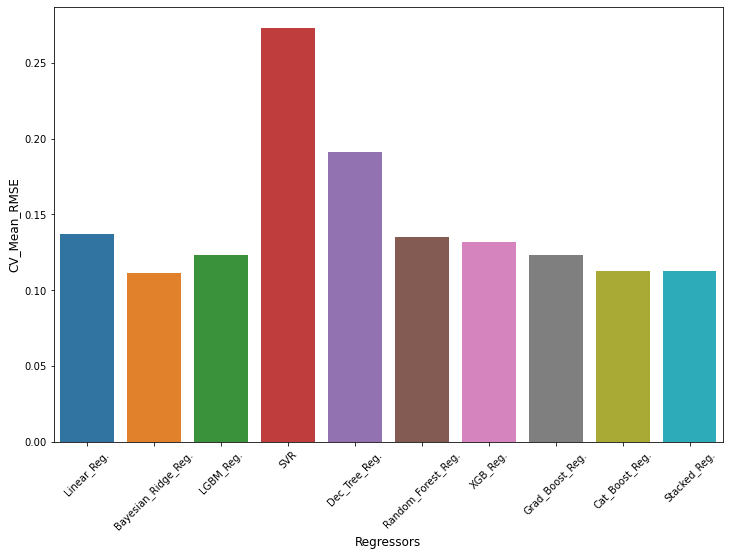

In [31]:
plt.figure(figsize = (12,8))
sns.barplot(final_cv_score['Regressors'],final_cv_score['RMSE_mean'])
plt.xlabel('Regressors', fontsize = 12)
plt.ylabel('CV_Mean_RMSE', fontsize = 12)
plt.xticks(rotation=45)
plt.show()

In [32]:
# Train-Test split the data
#to Display you must run this command in powershell
# jupyter nbextension enable --py widgetsnbextension --sys-prefix

X_train,X_val,y_train,y_val = train_test_split(train,target_log,test_size = 0.1,random_state=42)

# Cat Boost Regressor

cat = CatBoostRegressor()
cat_model = cat.fit(X_train,y_train,
                     eval_set = (X_val,y_val),
                     plot=True,
                     verbose = 0)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [33]:
cat_pred = cat_model.predict(X_val)
cat_score = rmse(y_val, cat_pred)
cat_score

0.08505152953662547

Now let's take a look at the top 20 most important variables for our model. This could give us further insight into the functioning of the algorithm and how and which data it uses most to arrive at the final prediction.

In [34]:
# Features' importance of our model

feat_imp = cat_model.get_feature_importance(prettified=True)
feat_imp

,Feature Id,Importances
0,OverallQual,17.134001
1,HighQualSF,6.597175
2,TotalBsmtSF,6.050513
3,Total_Home_Quality,5.827014
4,Total_Bathrooms,5.481429
...,...,...
330,SaleType_ConLD,0.000000
331,SaleType_ConLI,0.000000
332,SaleType_ConLw,0.000000
333,SaleType_Oth,0.000000


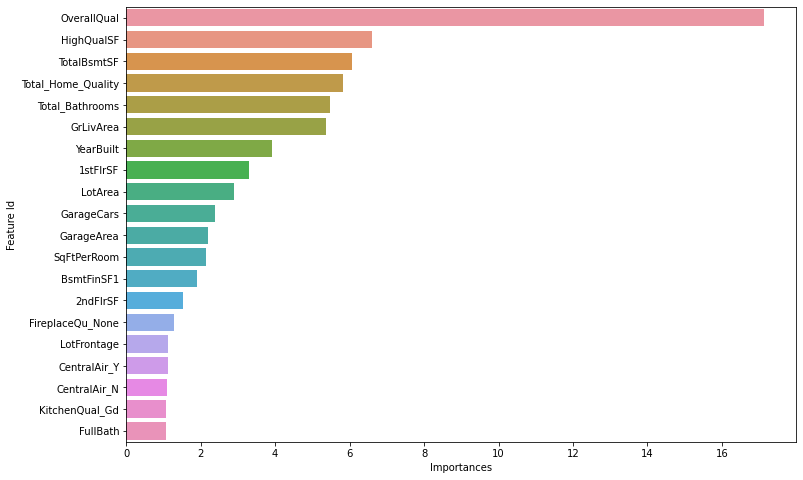

In [35]:
# Plotting top 20 features' importance

plt.figure(figsize = (12,8))
sns.barplot(feat_imp['Importances'][:20],feat_imp['Feature Id'][:20], orient = 'h')
plt.show()

In [36]:
# Feature importance Interactive Plot 

train_pool = Pool(X_train)
val_pool = Pool(X_val)

explainer = shap.TreeExplainer(cat_model) # insert your model
shap_values = explainer.shap_values(train_pool) # insert your train Pool object

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:200,:], X_train.iloc[:200,:])

# The plot represents just a slice of the Training data (200 observations)

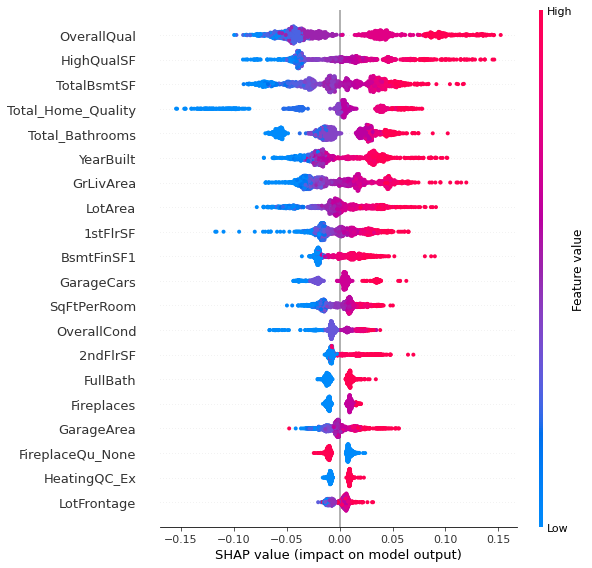

In [37]:
shap.summary_plot(shap_values, X_train)

The above diagram represents each observation (x-axis) for the feature presented (y-axis). The x location of each dot on the x-axis reflects the impact of that feature on the model's predictions, while the color of the dot represents the value of that feature for that exact observation. Dots that pile up on the line show density. Here we can see how features such as 'BsmtFinType1_GLQ' or 'BsmtQual_Ex', differently from 'GrLivArea' and 'OverallQual', do not contribute significantly in producing the final predictions.



 N.B: Catboost comes with a great method: ***get_feature_importance***. This method can be used to find important interactions among features. This is a huge advantage because it can give us insights about possible new features to create that can improve the performance.  

In [38]:
# Features' Interactions

train_data = Pool(X_train)

interaction = cat_model.get_feature_importance(train_data, type="Interaction")
column_names = X_train.columns.values 
interaction = pd.DataFrame(interaction, columns=["feature1", "feature2", "importance"])
interaction.feature1 = interaction.feature1.apply(lambda l: column_names[int(l)])
interaction.feature2 = interaction.feature2.apply(lambda l: column_names[int(l)])
interaction.head(20)

,feature1,feature2,importance
0,OverallQual,TotalBsmtSF,0.744973
1,OverallQual,Total_Bathrooms,0.533572
2,GrLivArea,Total_Home_Quality,0.464810
3,1stFlrSF,Total_Home_Quality,0.409867
4,OverallQual,HighQualSF,0.391608
5,YearBuilt,Total_Home_Quality,0.379782
6,LotArea,Total_Home_Quality,0.375040
7,OverallQual,YearBuilt,0.341183
8,LotArea,YearBuilt,0.339664
9,YearBuilt,GrLivArea,0.334675


Which are the deafult parameters used by CaboostRegressor? This is our real baseline, now we need to optimize the hyperparameters trying to tune the model to obtain a better performance.

In [39]:
# Catboost default paramters

cat_model.get_all_params()

{'nan_mode': 'Min',
 'eval_metric': 'RMSE',
 'iterations': 1000,
 'sampling_frequency': 'PerTree',
 'leaf_estimation_method': 'Newton',
 'grow_policy': 'SymmetricTree',
 'penalties_coefficient': 1,
 'boosting_type': 'Plain',
 'model_shrink_mode': 'Constant',
 'feature_border_type': 'GreedyLogSum',
 'bayesian_matrix_reg': 0.10000000149011612,
 'l2_leaf_reg': 3,
 'random_strength': 1,
 'rsm': 1,
 'boost_from_average': True,
 'model_size_reg': 0.5,
 'subsample': 0.800000011920929,
 'use_best_model': True,
 'random_seed': 0,
 'depth': 6,
 'posterior_sampling': False,
 'border_count': 254,
 'classes_count': 0,
 'auto_class_weights': 'None',
 'sparse_features_conflict_fraction': 0,
 'leaf_estimation_backtracking': 'AnyImprovement',
 'best_model_min_trees': 1,
 'model_shrink_rate': 0,
 'min_data_in_leaf': 1,
 'loss_function': 'RMSE',
 'learning_rate': 0.04821399971842766,
 'score_function': 'Cosine',
 'task_type': 'CPU',
 'leaf_estimation_iterations': 1,
 'bootstrap_type': 'MVS',
 'max_leaves

### Hyperparameter Optimization

In [40]:
# Preforming a Random Grid Search to find the best combination of parameters

grid = {'iterations': [1000,6000],
        'learning_rate': [0.05, 0.005],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5]}

final_model = CatBoostRegressor()
randomized_search_result = final_model.randomized_search(grid,
                                                   X = X_train,
                                                   y= y_train,
                                                   verbose = False,
                                                   plot=True)
                                                   

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 7.353413319
bestIteration = 999


bestTest = 0.7937023372
bestIteration = 5999


bestTest = 0.7292081066
bestIteration = 5999


bestTest = 0.2438818735
bestIteration = 2652


bestTest = 0.2529043686
bestIteration = 5924


bestTest = 7.660282817
bestIteration = 999


bestTest = 0.3933902558
bestIteration = 5865


bestTest = 0.4362324215
bestIteration = 5998


bestTest = 0.4386542252
bestIteration = 5999


bestTest = 0.4999274955
bestIteration = 5998



KeyboardInterrupt: 

In [41]:
# Final Cat-Boost Regressor

params = {'iterations': 6000,
          'learning_rate': 0.05,
          'depth': 6,
          'l2_leaf_reg': 5,
          'eval_metric':'RMSE',
          'early_stopping_rounds': 200,
          'verbose': 200,
          'random_seed': 42}
         
cat_f = CatBoostRegressor(**params)
cat_model_f = cat_f.fit(X_train,y_train,
                     eval_set = (X_val,y_val),
                     plot=True,
                     verbose = False)

catf_pred = cat_model_f.predict(X_val)
catf_score = rmse(y_val, catf_pred)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [42]:
catf_score

0.08488040271475727

### SUBMISSION

In [43]:
# Test CSV Submission

test_pred = cat_f.predict(test)
submission = pd.DataFrame(test_id, columns = ['Id'])
test_pred = np.expm1(test_pred)
submission['SalePrice'] = test_pred 
submission.head()

,Id,SalePrice
0,1461,128405.280560
1,1462,162707.445255
2,1463,180506.417836
3,1464,190936.814497
4,1465,185983.293709


In [44]:
# Saving the results in a csv file

submission.to_csv("result.csv", index = False, header = True)